In [ ]:
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from jax import value_and_grad, random, lax, jit
from jax.example_libraries import optimizers
import jax
import seaborn as sns

sns.set(font_scale=1.3)
sns.set_style("whitegrid")
sns.set_palette("rocket", n_colors=10)

In [ ]:
def train_model(target_exp, N, train_step, time_window, dt = 0.01, sigma = 0.1, lr = 0.01, tied = False):

  u = sigma*random.normal(random.PRNGKey(0), (N,))
  v = sigma*random.normal(random.PRNGKey(1), (N,))
  u = sigma * u / jnp.sqrt( jnp.mean(u**2) )
  v = sigma * v / jnp.sqrt( jnp.mean(v**2) )

  if tied:
    v = u

  W = sigma * random.normal(random.PRNGKey(2), (N,N))

  def loss_fn(params):
    u, v, W = params

    def update_fn(carry, x):
      h = carry
      dh = dt * ( - h + 1/jnp.sqrt(N) * W @ h  ) # run forward dynamics starting from u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v )
      return h_new, window

    def update_fn_r2(carry, x):
      h, hm = carry
      dh = dt * ( - h + 1/jnp.sqrt(N) * W @ h  ) # run forward dynamics starting from u
      h_new = hm + 2 * dh
      window = 1/N * jnp.sum( h * v )
      return [h_new, h] , window

    _, f = lax.scan(update_fn, init = u, xs= None, length = time_window)
    #_, f = lax.scan(update_fn_r2, init = [u, u], xs= None, length = time_window)
    y = jnp.exp( - target_exp * jnp.linspace(0, time_window, time_window) * dt  )

    return jnp.sum( (f-y)**2 ) * dt

  y = jnp.exp( - target_exp * jnp.linspace(0, time_window, time_window) * dt  )

  plt.plot(jnp.linspace(0, time_window, time_window) * dt, y)
  plt.show()

  params = [u, v, W]

  val_grad_fn = jit( value_and_grad(loss_fn) )
  opt_init, opt_update, get_params = optimizers.sgd( lr * N )

  opt_state = opt_init(params)

  losses = []
  aligns = []
  W_aligns = []
  u_norm = []
  c_scale = []

  for t in range(train_step):

    loss, grads = val_grad_fn(get_params(opt_state))
    opt_state = opt_update(t, grads, opt_state)

    losses.append(loss)

    u, v, W = get_params(opt_state)

    aligns += [ jnp.sum( u * v ) / jnp.sqrt( jnp.sum(u**2) * jnp.sum(v**2) ) ]
    W_aligns += [  jnp.sum( v * ( W @ u )) / jnp.sqrt( jnp.sum((W @ u)**2) * jnp.sum(v**2) )   ]

    u_norm += [ jnp.mean(u**2) ]
    c_scale += [ jnp.mean(  v *  (W @ u / jnp.sqrt(N) )) / jnp.sqrt( jnp.mean(v**2) * jnp.mean(u**2) ) ]



  # check final windowing fn
  def update_fn(carry, x):
      h = carry
      dh = dt * ( - h + 1/jnp.sqrt(N) * W @ h  ) # run forward dynamics starting rom u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v )
      return h_new, window

  _, f = lax.scan(update_fn, init = u, xs= None, length = time_window)
  plt.plot(y)
  plt.plot(f, '--')
  plt.show()

  return losses, aligns, W_aligns, W, u_norm, c_scale


def train_model_eig_vis(target_exp, N, train_step, time_window, dt = 0.01, sigma = 0.1, lr = 0.01, tied = False):

  u = sigma*random.normal(random.PRNGKey(0), (N,))
  v = sigma*random.normal(random.PRNGKey(1), (N,))
  u = sigma * u / jnp.sqrt( jnp.mean(u**2) )
  v = sigma * v / jnp.sqrt( jnp.mean(v**2) )

  if tied:
    v = u

  W = sigma * random.normal(random.PRNGKey(2), (N,N))

  def loss_fn(params):
    u, v, W = params

    def update_fn(carry, x):
      h = carry
      dh = dt * ( - h + 1/jnp.sqrt(N) * W @ h  ) # run forward dynamics starting from u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v )
      return h_new, window

    def update_fn_r2(carry, x):
      h, hm = carry
      dh = dt * ( - h + 1/jnp.sqrt(N) * W @ h  ) # run forward dynamics starting from u
      h_new = hm + 2 * dh
      window = 1/N * jnp.sum( h * v )
      return [h_new, h] , window

    _, f = lax.scan(update_fn, init = u, xs= None, length = time_window)
    #_, f = lax.scan(update_fn_r2, init = [u, u], xs= None, length = time_window)
    y = jnp.exp( - target_exp * jnp.linspace(0, time_window, time_window) * dt  )

    return jnp.sum( (f-y)**2 ) * dt

  y = jnp.exp( - target_exp * jnp.linspace(0, time_window, time_window) * dt  )

  plt.plot(jnp.linspace(0, time_window, time_window) * dt, y)
  plt.show()

  params = [u, v, W]

  val_grad_fn = jit( value_and_grad(loss_fn) )
  opt_init, opt_update, get_params = optimizers.sgd( lr * N )

  opt_state = opt_init(params)

  losses = []
  aligns = []
  W_aligns = []
  u_norm = []
  c_scale = []

  all_eigs = []

  for t in range(train_step):

    loss, grads = val_grad_fn(get_params(opt_state))
    opt_state = opt_update(t, grads, opt_state)

    losses.append(loss)

    u, v, W = get_params(opt_state)

    aligns += [ jnp.sum( u * v ) / jnp.sqrt( jnp.sum(u**2) * jnp.sum(v**2) ) ]
    W_aligns += [  jnp.sum( v * ( W @ u )) / jnp.sqrt( jnp.sum((W @ u)**2) * jnp.sum(v**2) )   ]

    u_norm += [ jnp.mean(u**2) ]
    c_scale += [ jnp.mean(  v *  (W @ u / jnp.sqrt(N) )) ]

    all_eigs += [np.linalg.eigvals( W / jnp.sqrt(N))]


  # check final windowing fn
  def update_fn(carry, x):
      h = carry
      dh = dt * ( - h + 1/jnp.sqrt(N) * W @ h  ) # run forward dynamics starting rom u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v )
      return h_new, window

  _, f = lax.scan(update_fn, init = u, xs= None, length = time_window)
  plt.plot(y)
  plt.plot(f, '--')
  plt.show()

  return losses, aligns, W_aligns, W, u_norm, c_scale, all_eigs



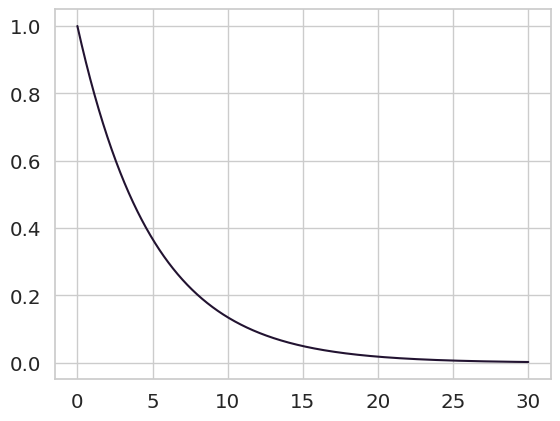

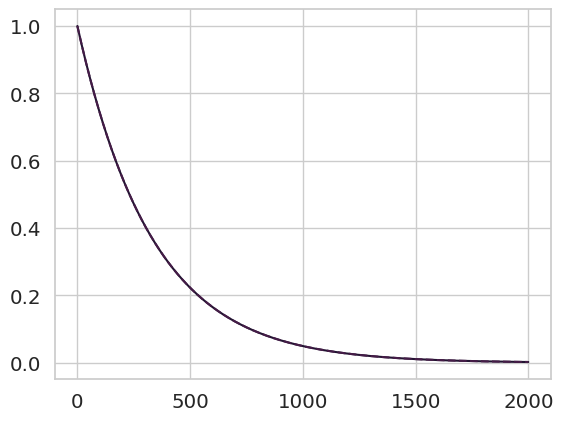

In [ ]:
N = 200
target_exp = 0.2

sigma = 0.0001
lr = 0.01
time_window = 2000

train_step = 1000
losses,aligns, W_aligns, W, u_norm, c_scale = train_model( target_exp , N, train_step = train_step, time_window = time_window, sigma = sigma, lr = lr, dt = 0.015, tied= True)

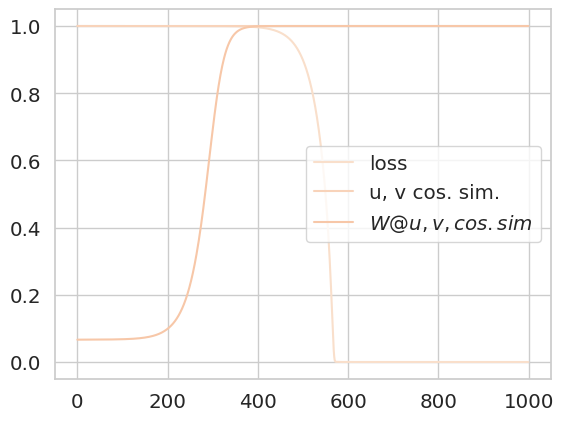

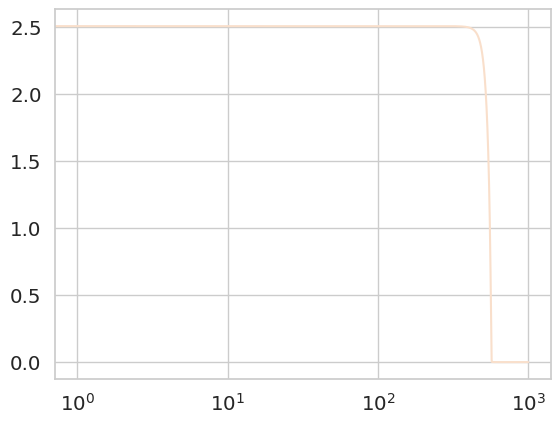

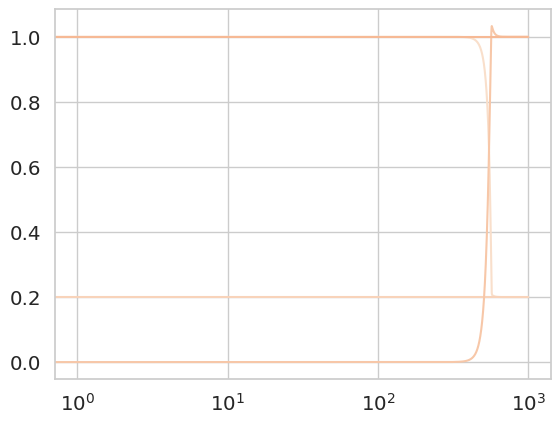

In [ ]:
plt.plot(jnp.array(losses) / losses[0], label = 'loss')
plt.plot(aligns, label = 'u, v cos. sim.')
plt.plot(W_aligns, label = r'$W @ u, v , cos. sim$')
plt.legend()
plt.show()

plt.semilogx(losses)
plt.show()

plt.semilogx(1.0 - jnp.array(c_scale))
plt.semilogx( target_exp * jnp.ones(len(c_scale)) )
plt.semilogx(u_norm)
plt.semilogx( aligns )
plt.show()

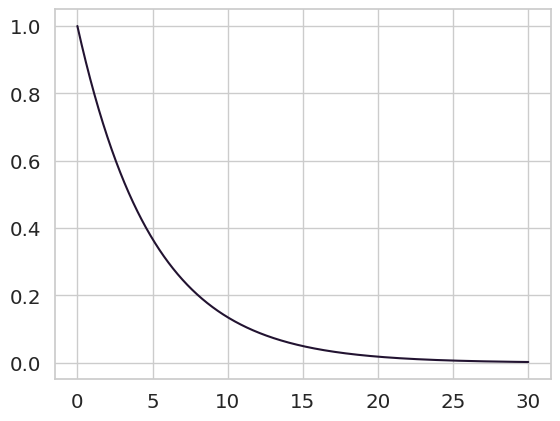

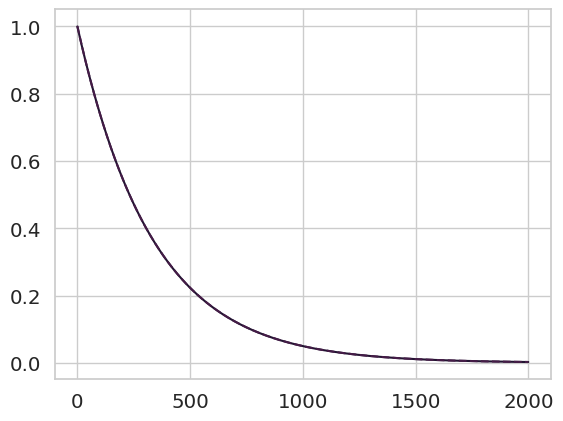

In [ ]:
N = 200
target_exp = 0.2
sigma = 0.2
lr = 0.01

time_window = 2000
train_step = 1000
losses,aligns, W_aligns, W, u_norm, c_scale, all_eigs = train_model_eig_vis( target_exp , N, train_step = train_step, time_window = time_window, sigma = sigma, lr = lr, dt = 0.015, tied= False)

In [ ]:
max_eigs = []
for t, eig in enumerate(all_eigs):
    max_eigs += [jnp.amax( eig.real )]

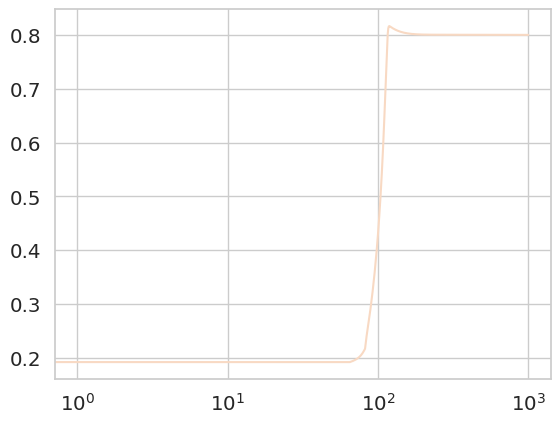

In [ ]:
plt.semilogx(max_eigs)
plt.show()

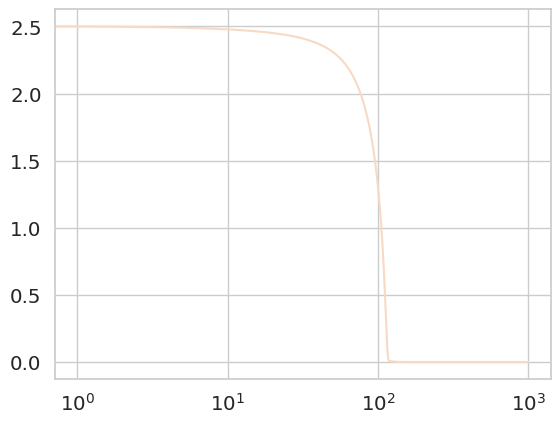

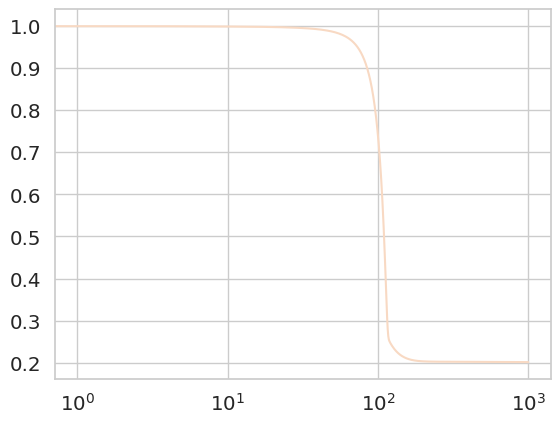

In [ ]:
plt.semilogx(losses)
plt.show()
plt.semilogx(1.0 - jnp.array(c_scale))
#plt.semilogx( target_exp * jnp.ones(len(c_scale)) )
plt.show()

<Figure size 800x800 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

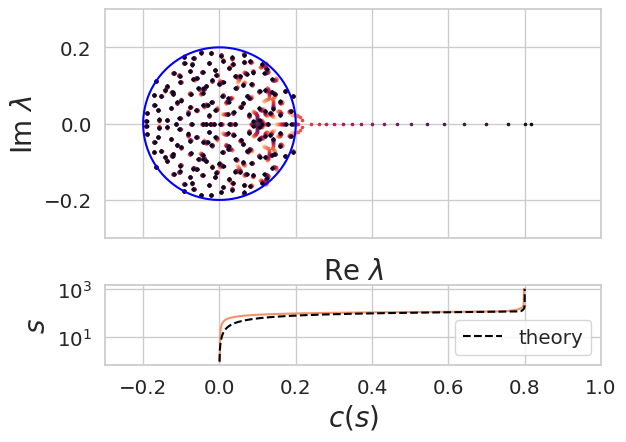

In [ ]:
plt.figure(figsize = (8,8))
times = jnp.arange(60, 120, 2)
sns.set_palette("rocket_r", n_colors=len(times))

plt.figure(figsize = (10,10))
f, (a0, a1) = plt.subplots(2, 1, height_ratios=[4, 1.25])
for t in times:
  #for t, eig in enumerate(all_eigs):
  a0.scatter(all_eigs[t].real, all_eigs[t].imag, s = 2.5)

theta_vals = jnp.linspace(0, 2*jnp.pi, 100)
a0.plot(sigma * jnp.cos(theta_vals), sigma * jnp.sin(theta_vals), color = 'blue', label = r'$x^2 + y^2 = \sigma^2$')
a0.set_aspect('equal')

a0.set_xlim([-0.3, 1.0])
a0.set_ylim([-0.3, 0.3])
a0.set_xlabel(r'Re $\lambda$',fontsize = 20)
a0.set_xticklabels([])

a0.set_ylabel(r'Im $\lambda$', fontsize = 20)
#plt.tight_layout()

a1.semilogy(jnp.array(c_scale), jnp.linspace(1,len(c_scale),len(c_scale)), color = 'C6')
a1.semilogy(1- jnp.array(cs),  jnp.linspace(1,len(cs),len(cs)), '--', color = 'black',label = 'theory')
#a1.semilogy(jnp.array(c_scale), jnp.linspace(1,len(c_scale),len(c_scale)), label = r'$c(s)$')
#a1.semilogy(1- jnp.array(cs),  jnp.linspace(1,len(cs),len(cs)), '--', color = 'black',label = 'theory')
a1.set_xlabel(r'$c(s)$',fontsize = 20)
a1.set_xlim([-0.3, 1.0])
a1.set_ylabel(r'$s$', fontsize = 20)
a1.legend()
#plt.tight_layout()
#plt.legend()
plt.savefig('eigenvalue_dynamics_real_time_complex_plane_outlier.pdf', bbox_inches= 'tight')
plt.show()

In [ ]:
def simulate_theory(c_star, train_step, sigma = 0.05, lr = 0.01):

  c = 1.0
  u = sigma

  us = []
  cs = []
  print(c_star)


  losses = []

  for t in range(train_step):

    dc =  lr * ( u**4 / (2*c**2) - 2.0 * u**2 /( c_star + c )**2 )
    du =  - lr * u * ( u**2/c -  2.0 / (c+c_star) )
    us += [u]
    cs += [c]

    c += dc
    u += du

    losses += [ u**4/(2*c) - 2*u**2/(c+c_star) + 1/(2*c_star) ]

  return us, cs, losses


# theory with initial condition set by stitching
def simulate_theory_stitched(c_star, train_step, t_align, sigma = 0.05, lr = 0.01):

  # stitched initial condition
  #c = 1.0
  #u = sigma

  #c = 1.0 - sigma
  #c = 1.0 - sigma
  a = 1.0/(1.0 + c_star)
  u = jnp.exp( 2 * a * t_align ) * sigma
  c = 1.0 - jnp.exp(4*a*t_align) * sigma

  us = []
  cs = []
  print(c_star)


  losses = []

  for t in range(train_step):

    dc =    lr * ( u**4 / (2*c**2) - 2.0 * u**2 /( c_star + c )**2 )
    du =  - lr * u * ( u**2/c -  2.0 / (c+c_star) )
    us += [u]
    cs += [c]

    c += dc
    u += du

    losses += [ u**4/(2*c) - 2*u**2/(c+c_star) + 1/(2*c_star) ]

  return us, cs, losses


In [ ]:
print( target_exp )
bs, cs, losses_th = simulate_theory(target_exp, train_step=train_step, sigma = sigma, lr = lr)

print(target_exp)
print(sigma)
a = 1.0/(1.0 + target_exp)
t_align = 200 * lr

#t_align = 1.0/(2*a) * jnp.log(1.0 + 2/(a*sigma) )
#print(t_align)
#print(t_align/lr)

#bs_st, cs_st, losses_th_st = simulate_theory_stitched(target_exp, train_step=train_step, t_align = t_align, sigma = sigma, lr = lr)

0.2
0.2
0.2
0.2


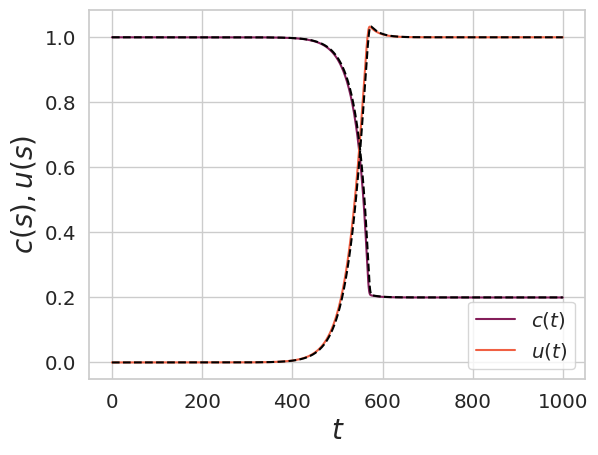

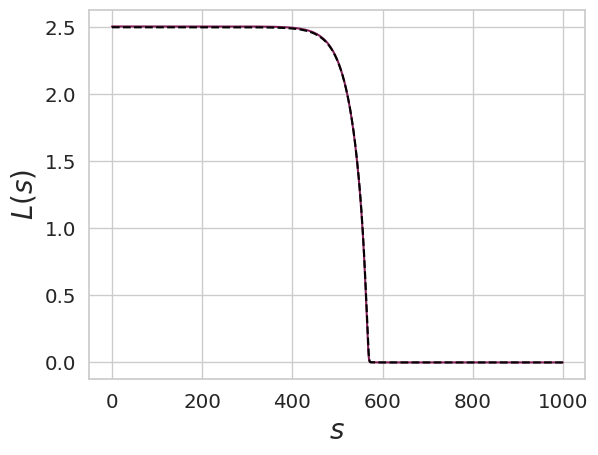

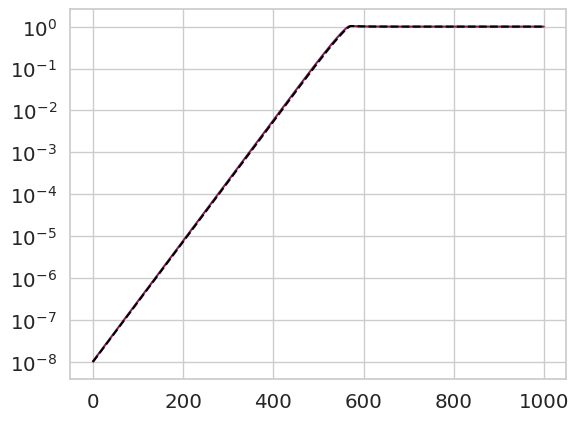

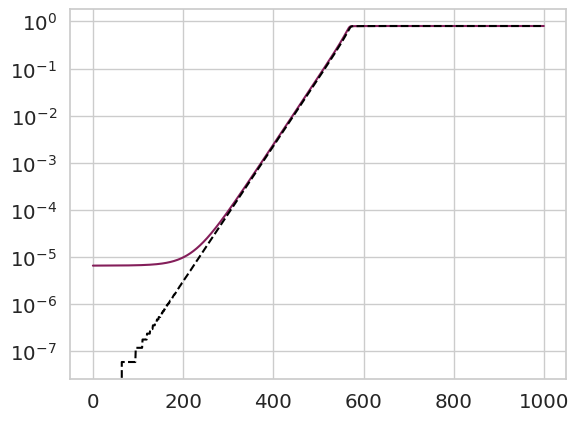

In [ ]:
sns.set_palette("rocket", n_colors=2)

ts = jnp.linspace(1,len(cs), len(cs))

#plt.semilogx(jnp.ones(len(bs)), color = 'black')


plt.plot( 1.0 - jnp.array(c_scale), label = r'$c(t)$')
plt.plot( u_norm , label = r'$u(t)$')
plt.plot(  cs, '--', color = 'black')
#plt.plot( jnp.linspace( t_align / lr , len(cs_st)+ t_align/lr, len(cs_st) ),  cs_st , '--', color = 'red' )
plt.plot(  jnp.array(bs)**2 , '--', color = 'black')
plt.legend()
plt.xlabel(r'$t$',fontsize = 20)
plt.ylabel(r'$c(s),u(s)$',fontsize = 20)
plt.savefig(f'eigenvalues_c_u_dynamics_real_time.pdf')
plt.show()

plt.plot(jnp.array(losses), label = 'loss')
plt.plot(losses_th, '--', color = 'black')
plt.xlabel(r'$s$',fontsize =20)
plt.ylabel(r'$L(s)$',fontsize = 20)
plt.savefig(f'eigenvalues_L_dynamics_real_time.pdf')
plt.show()

plt.semilogy(u_norm)
plt.semilogy(  jnp.array(bs)**2 , '--', color = 'black')
#plt.semilogy(  jnp.linspace( t_align / lr , len(cs_st)+ t_align/lr, len(cs_st) ), jnp.array(bs_st)**2 , '--', color = 'blue')
#plt.semilogy(  )
plt.show()

plt.semilogy(    jnp.array(c_scale), label = r'$c(t)$')
plt.semilogy( 1.0-jnp.array(cs) , '--', color = 'black')
plt.show()

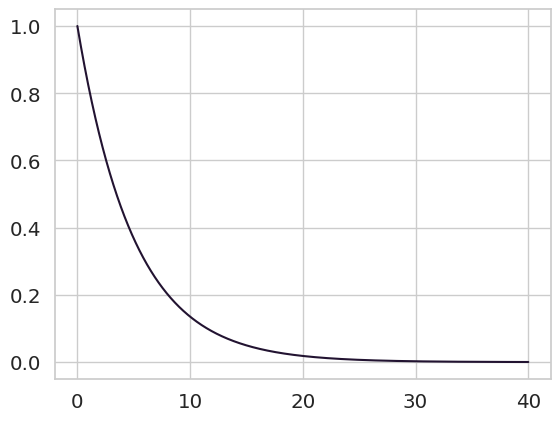

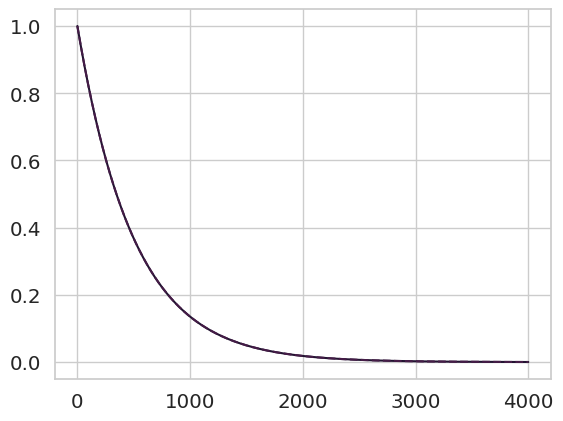

0.2


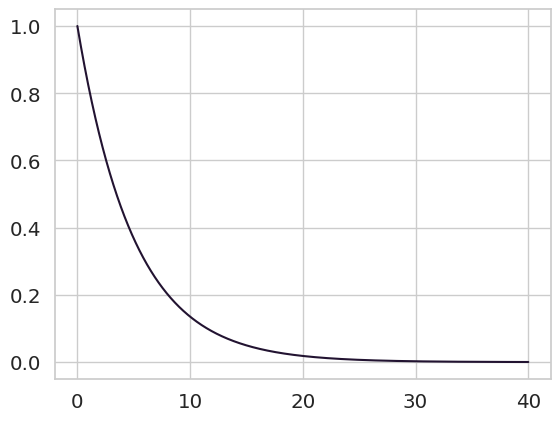

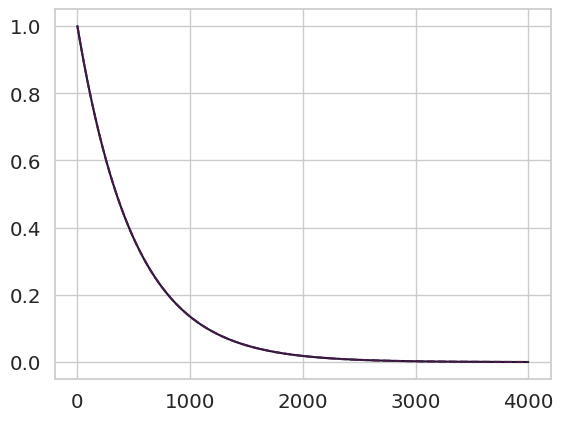

0.2


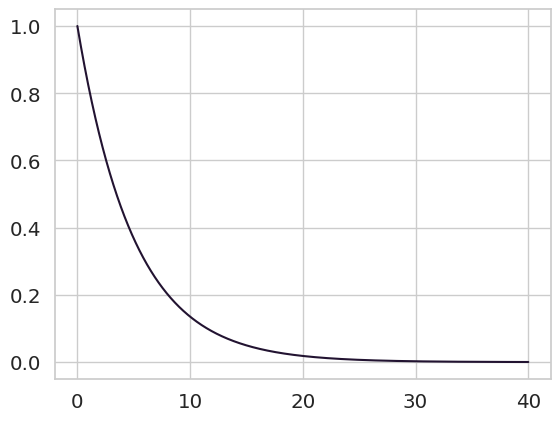

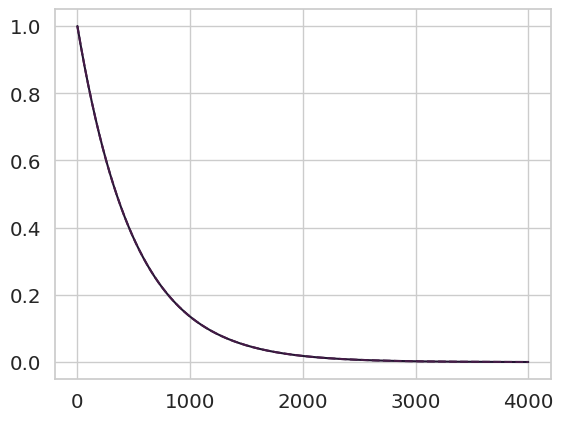

0.2


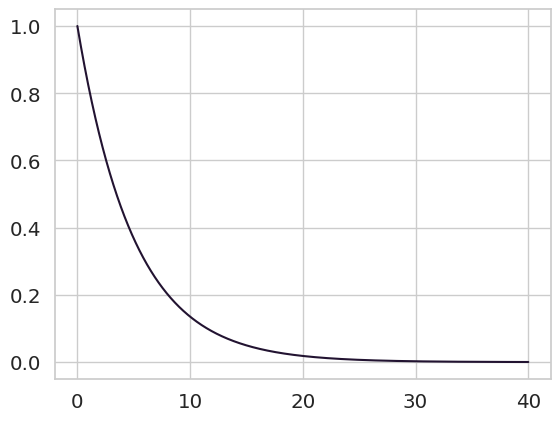

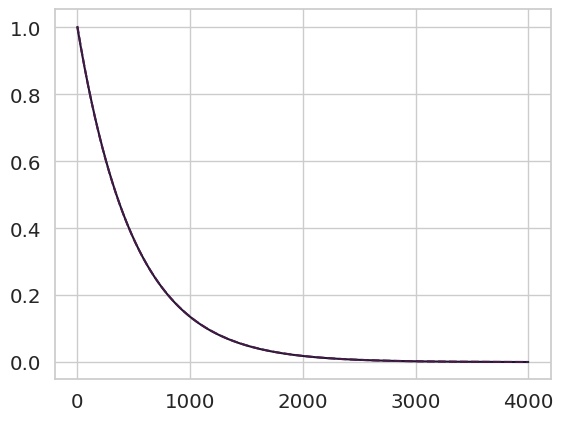

0.2


In [ ]:
sigma_vals = [1e-4, 1e-3, 1e-2, 1e-1]

N = 100

lr = 0.02
train_step = 800


all_loss_expt = []
all_loss_th = []

all_c = []
all_c_th = []


all_W_aligns = []
for i, sigma in enumerate(sigma_vals):
  losses,aligns, W_aligns, W, u_norm, c_scale = train_model( target_exp , N, train_step = train_step, time_window = 2*time_window, sigma = sigma, lr = lr, dt = 0.01, tied= True)
  all_W_aligns += [ W_aligns ]
  all_loss_expt += [losses]
  all_c += [ c_scale ]
  bs, cs, losses_th = simulate_theory(target_exp, train_step=train_step, sigma = sigma, lr = lr)
  all_loss_th += [ losses_th ]
  all_c_th += [ cs ]

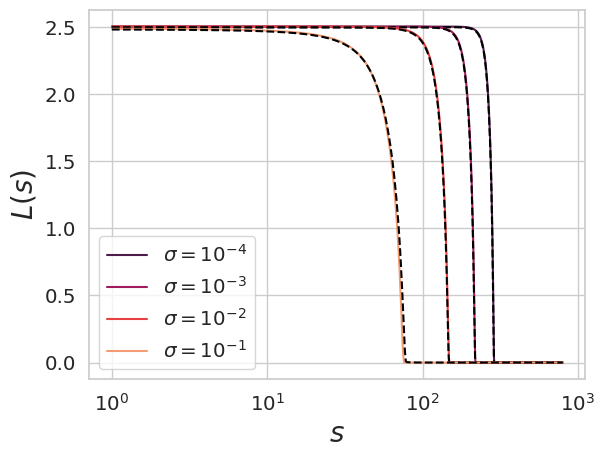

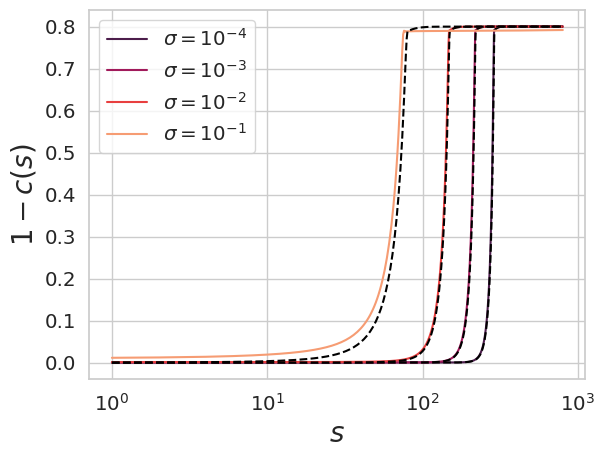

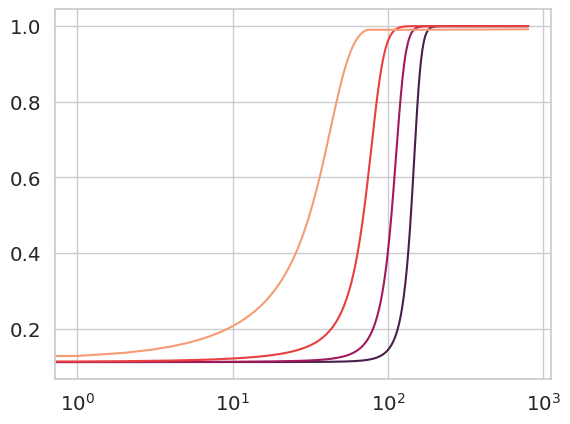

In [ ]:
labels = [r'$10^{-4}$', r'$10^{-3}$', r'$10^{-2}$', r'$10^{-1}$']
sns.set_palette("rocket", n_colors= len(all_loss_expt))
for i, loss in enumerate(all_loss_expt):
  plt.semilogx( jnp.linspace(1,len(loss),len(loss)), loss , label = r'$\sigma = $' + labels[i] )
  plt.semilogx( jnp.linspace(1,len(loss),len(loss)), all_loss_th[i] , '--',  color = 'black')
plt.legend()
plt.xlabel(r'$s$',fontsize = 20)
plt.ylabel(r'$L(s)$',fontsize = 20)
plt.savefig('vary_sigma_tied_real_filter_loss.pdf',bbox_inches = 'tight')
plt.show()

sns.set_palette("rocket", n_colors= len(all_loss_expt))
for i, ct in enumerate(all_c):
  plt.semilogx( jnp.linspace(1,len(loss),len(loss)), jnp.array(ct) , label = r'$\sigma = $' + labels[i] )
  plt.semilogx( jnp.linspace(1,len(loss),len(loss)), 1.0-jnp.array(all_c_th[i]) , '--',  color = 'black')
plt.legend()
plt.xlabel(r'$s$',fontsize = 20)
plt.ylabel(r'$1-c(s)$',fontsize = 20)
plt.savefig('vary_sigma_tied_real_filter_ct.pdf',bbox_inches = 'tight')
plt.show()

for i, W_align in enumerate(all_W_aligns):
  plt.semilogx(W_align)
plt.show()

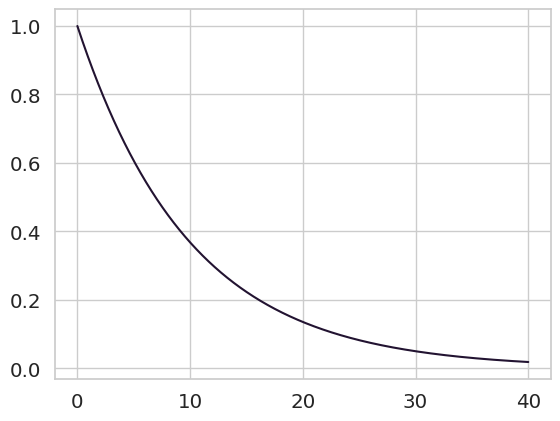

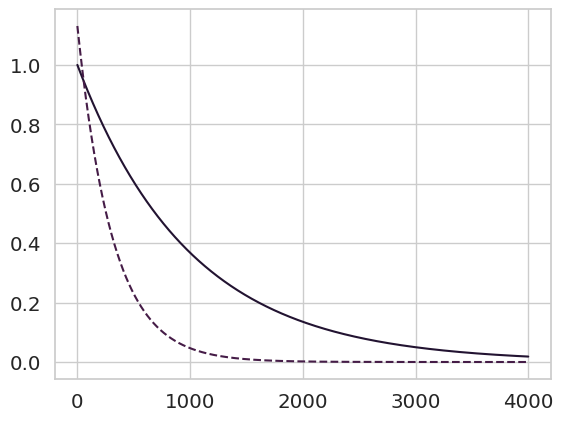

0.1


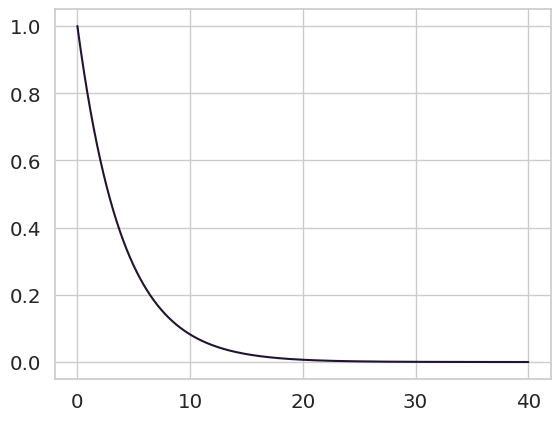

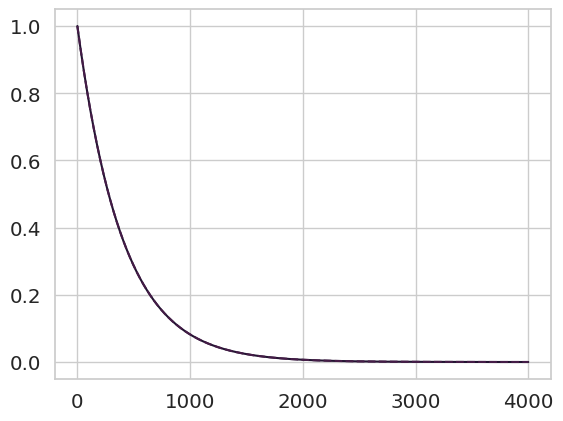

0.25


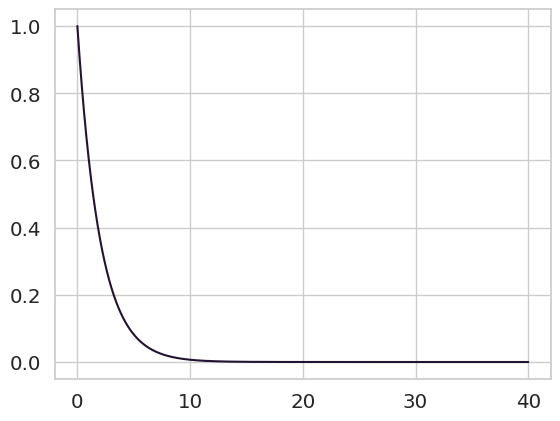

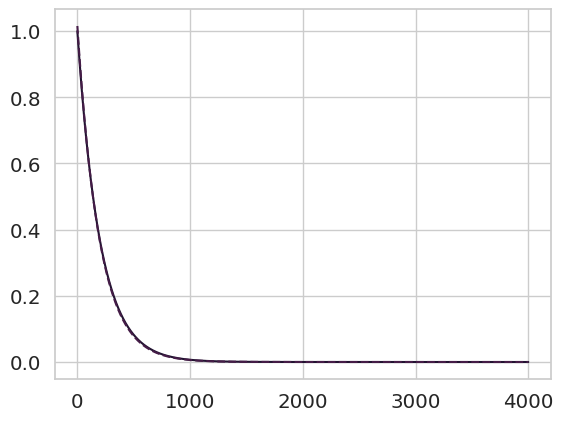

0.5


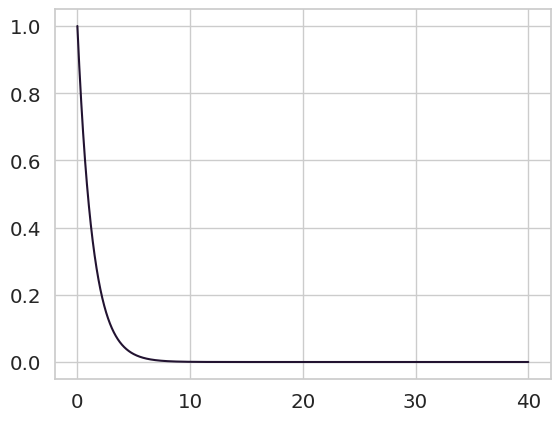

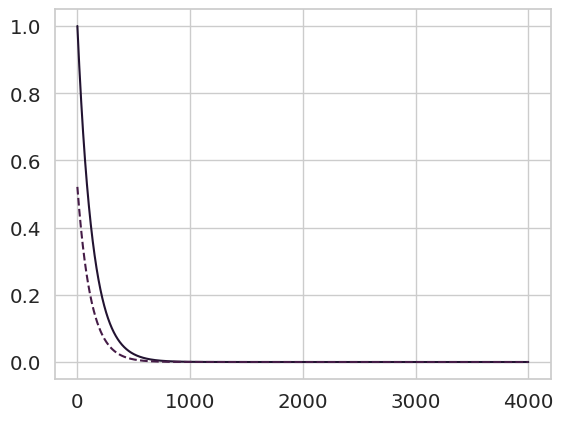

0.75


In [ ]:
targets = [0.1, 0.25, 0.5, 0.75]

N = 100

lr = 0.01
train_step = 800


all_loss_expt = []
all_loss_th = []

all_c = []
all_c_th = []


all_W_aligns = []
for i, target_exp in enumerate(targets):
  losses,aligns, W_aligns, W, u_norm, c_scale = train_model( target_exp , N, train_step = train_step, time_window = 2*time_window, sigma = sigma, lr = lr, dt = 0.01, tied= True)
  all_W_aligns += [ W_aligns ]

  all_loss_expt += [losses]
  all_c += [ c_scale ]
  bs, cs, losses_th = simulate_theory(target_exp, train_step=train_step, sigma = sigma, lr = lr)
  all_loss_th += [ losses_th ]
  all_c_th += [ cs ]

In [ ]:
def train_model_complex_target(target_exp, N, train_step, time_window, dt = 0.025, sigma = 0.1, lr = 0.01, seed =0):

  u = sigma*random.normal(random.PRNGKey(seed), (N,))
  #v = sigma*random.normal(random.PRNGKey(1), (N,))
  v = u

  perp_u = random.normal( random.PRNGKey(seed + 1), (N,)  )
  perp_u = perp_u - jnp.dot(perp_u, u)/jnp.sum(u**2) * u
  perp_u = perp_u / jnp.sqrt( jnp.sum(perp_u**2) ) * jnp.sqrt( jnp.sum(u**2) )
  print(jnp.sum(perp_u**2) / N)
  print(jnp.sum(u**2) / N )


  u_normed = u / jnp.sqrt(jnp.sum(u**2) )
  perp_u_normed = perp_u / jnp.sqrt(jnp.sum(perp_u**2) )
  z = u_normed + 1j * perp_u_normed
  lamb_init = 1.5*sigma + 1j * 1.5*sigma
  print(lamb_init)
  outlier_component = lamb_init * jnp.outer( z, jnp.conjugate(z) ) + jnp.conjugate(lamb_init) * jnp.outer( jnp.conjugate(z), z )

  outlier_component = outlier_component.real
  print(outlier_component.shape)
  #  s * u
  #W = sigma*random.normal(random.PRNGKey(seed + 3), (N,N))  + jnp.sqrt(N) * outlier_component
  W = sigma*random.normal(random.PRNGKey(seed + 3), (N,N))

  def loss_fn(params):
    u, v, W = params

    def update_fn(carry, x):
      h = carry
      dh = dt * ( - h + 1/jnp.sqrt(N) * W @ h  ) # run forward dynamics starting from u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v )
      return h_new, window

    def update_fn_r2(carry, x):
      h, hm = carry
      dh = dt * ( - h + 1/jnp.sqrt(N) * W @ h  ) # run forward dynamics starting from u
      h_new = hm + 2 * dh
      window = 1/N * jnp.sum( h * v )
      return [h_new, h] , window

    _, f = lax.scan(update_fn, init = u, xs= None, length = time_window)
    #_, f = lax.scan(update_fn_r2, init = [u, u], xs= None, length = time_window)
    y = jnp.exp( - target_exp * jnp.linspace(0, time_window-1, time_window) * dt  ).real

    return jnp.sum( (f-y)**2 ) * dt

  y = jnp.exp( - target_exp * jnp.linspace(0, time_window-1, time_window) * dt  ).real

  plt.plot(jnp.linspace(0, time_window-1, time_window) * dt, y)
  plt.show()

  params = [u, v, W]

  val_grad_fn = jit( value_and_grad(loss_fn) )
  opt_init, opt_update, get_params = optimizers.sgd( lr * N )

  opt_state = opt_init(params)

  losses = []
  aligns = []
  W_aligns = []
  u_norm = []
  c_scale = []

  all_eigs = []

  for t in range(train_step):


    if t % 10 == 0:
      all_eigs += [ np.linalg.eigvals( W / jnp.sqrt(N) ) ]


    loss, grads = val_grad_fn(get_params(opt_state))

    opt_state = opt_update(t, grads, opt_state)

    losses.append(loss)

    u, v, W = get_params(opt_state)

    aligns += [ jnp.sum( u * v ) / jnp.sqrt( jnp.sum(u**2) * jnp.sum(v**2) ) ]
    W_aligns += [  jnp.sum( v * ( W @ u )) / jnp.sqrt( jnp.sum((W @ u)**2) * jnp.sum(v**2) )   ]

    u_norm += [ jnp.mean(u**2) ]
    c_scale += [ jnp.mean(  v *  (W @ u / jnp.sqrt(N) )) ]



  # check final windowing fn
  def update_fn(carry, x):
      h = carry
      dh = dt * ( - h + 1/jnp.sqrt(N) * W @ h  ) # run forward dynamics starting rom u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v )
      return h_new, window

  _, f = lax.scan(update_fn, init = u, xs= None, length = time_window)
  plt.plot(y)
  plt.plot(f, '--')
  plt.show()

  return losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs


0.010909648
0.010909648
(0.15000000000000002+0.15000000000000002j)
(250, 250)


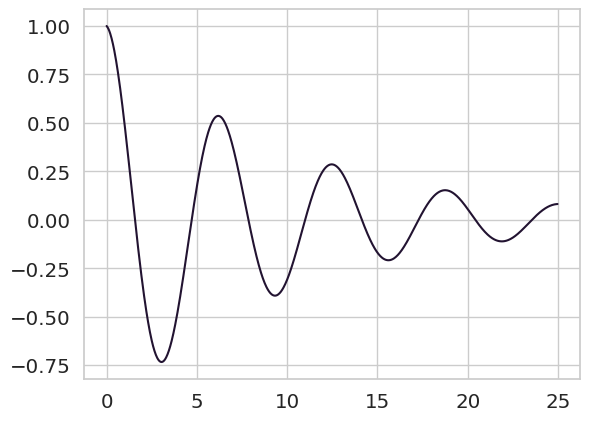

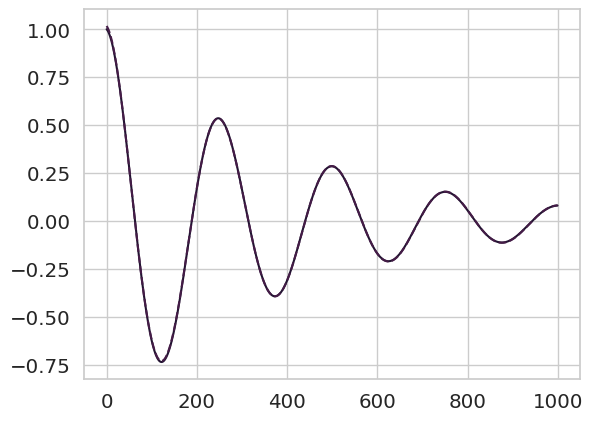

In [ ]:
N = 250
target_exp = 0.1 + 1.0j

sigma = 0.1
lr = 0.005

time_window = 1000
train_step = 2500


losses,aligns, W_aligns, W, u,v, u_norm, c_scale, all_eigs = train_model_complex_target( target_exp , N, train_step = train_step, time_window = time_window, sigma = sigma, lr = lr)

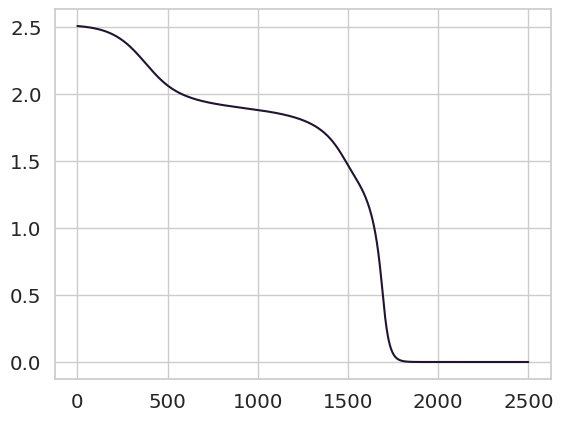

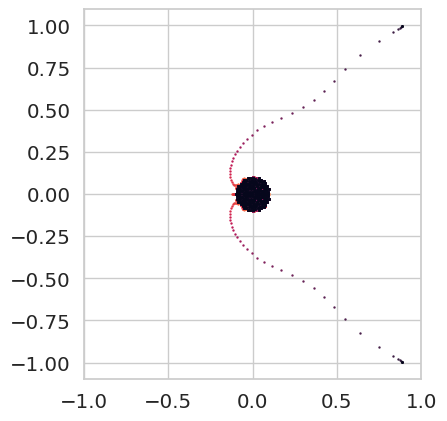

In [ ]:
plt.plot(losses)
plt.show()

times = jnp.arange(10, 200, 3)
sns.set_palette("rocket_r", n_colors=len(times))

plt.figure()
for t in times:
    plt.scatter(all_eigs[t].real, all_eigs[t].imag, s = 0.5)
plt.gca().set_aspect('equal')
plt.xlim([-1.0,1.0])
#plt.scatter( all_eigs2d[t].real, all_eigs2d[t].imag , color = 'black', s = 0.25)
plt.show()

## Small Init, Complex Target

0.0022769768
0.0022769768
(0.07500000000000001+0.07500000000000001j)
(250, 250)


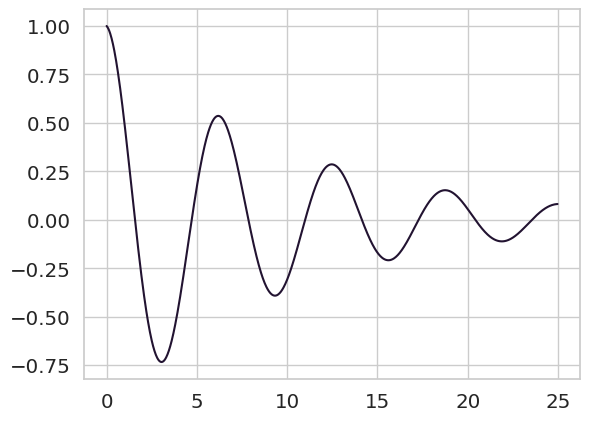

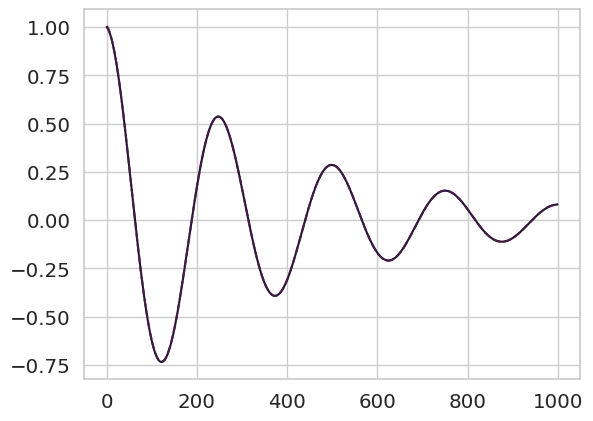

In [ ]:
N = 250
target_exp = 0.1 + 1.0j

sigma = 0.05
lr = 0.01

time_window = 1000
train_step = 2500


losses,aligns, W_aligns, W, u,v, u_norm, c_scale, all_eigs = train_model_complex_target( target_exp , N, train_step = train_step, time_window = time_window, sigma = sigma, lr = lr)

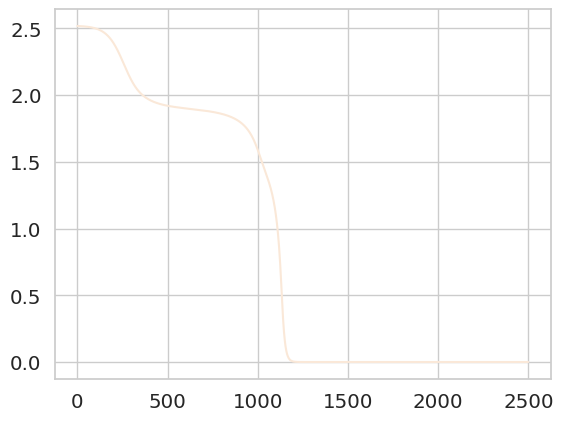

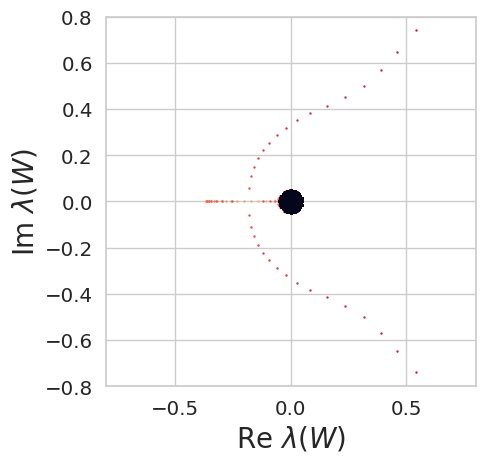

In [ ]:
plt.plot(losses)
plt.show()

times = jnp.arange(10, 200, 2)
sns.set_palette("rocket_r", n_colors=len(times))

plt.figure()
for t in times:
    plt.scatter(all_eigs[t].real, all_eigs[t].imag, s = 0.5)
plt.gca().set_aspect('equal')
plt.xlim([-0.8,0.8])
plt.ylim([-0.8,0.8])
plt.xlabel(r'Re $\lambda(W)$',fontsize= 20)
plt.ylabel(r'Im $\lambda(W)$',fontsize= 20)
plt.savefig('eigenvalue_dynamics_small_init_complex_plane.pdf', bbox_inches= 'tight')
#plt.scatter( all_eigs2d[t].real, all_eigs2d[t].imag , color = 'black', s = 0.25)
plt.show()

0.008916819
0.008916818
(0.15000000000000002+0.15000000000000002j)
(100, 100)


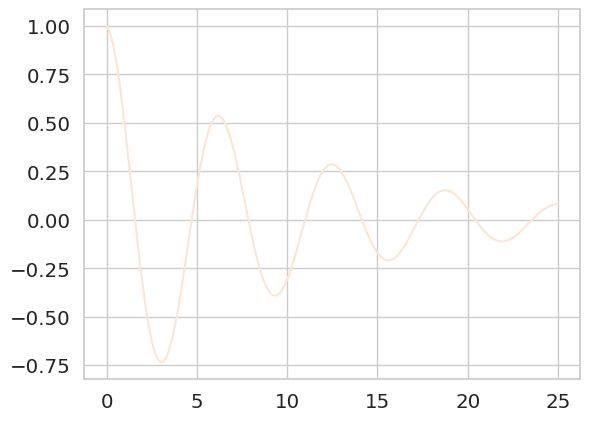

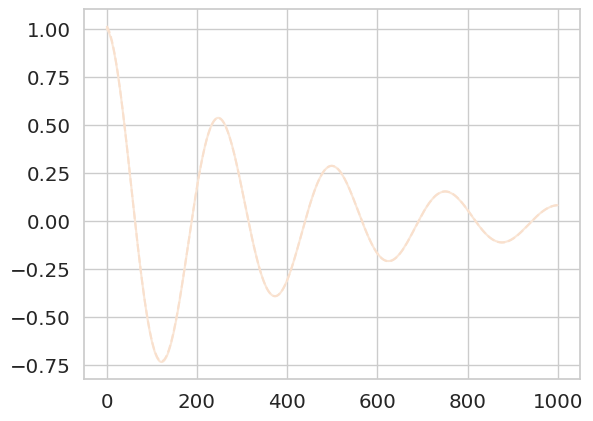

0.009608812
0.009608811
(0.15000000000000002+0.15000000000000002j)
(100, 100)


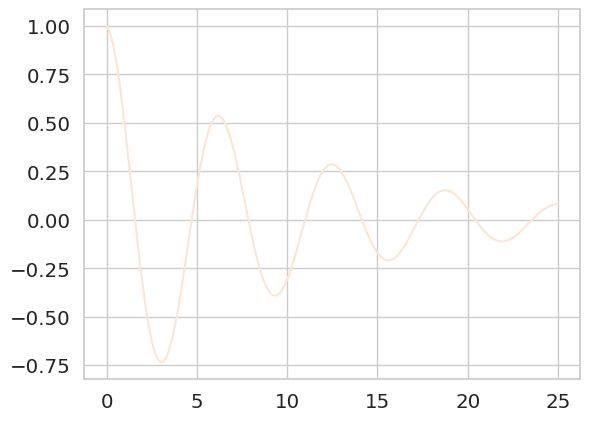

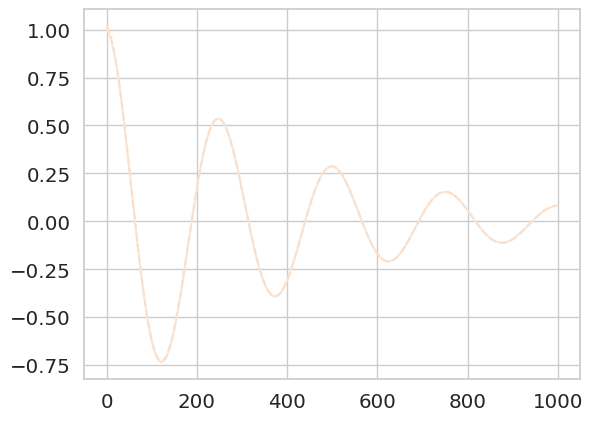

0.008378163
0.008378165
(0.15000000000000002+0.15000000000000002j)
(100, 100)


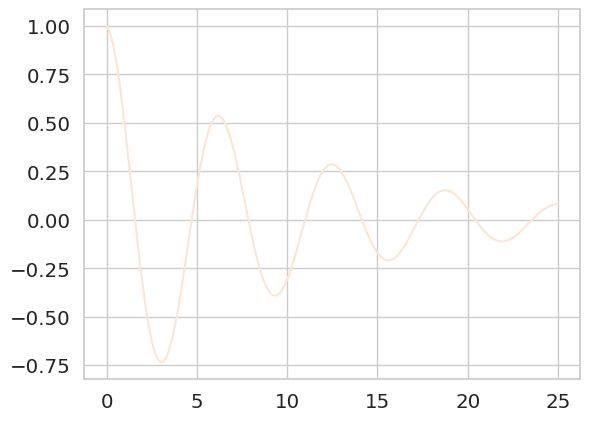

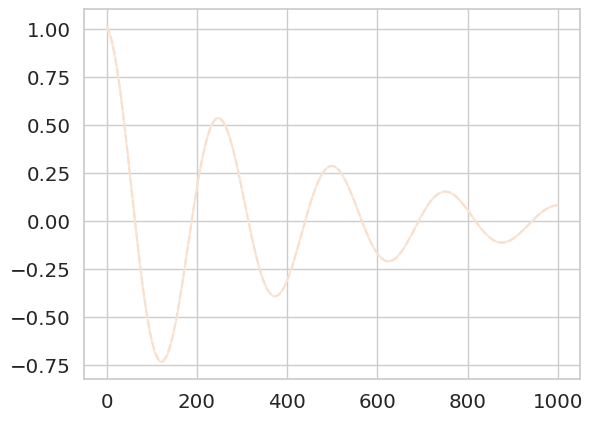

0.009369639
0.00936964
(0.15000000000000002+0.15000000000000002j)
(100, 100)


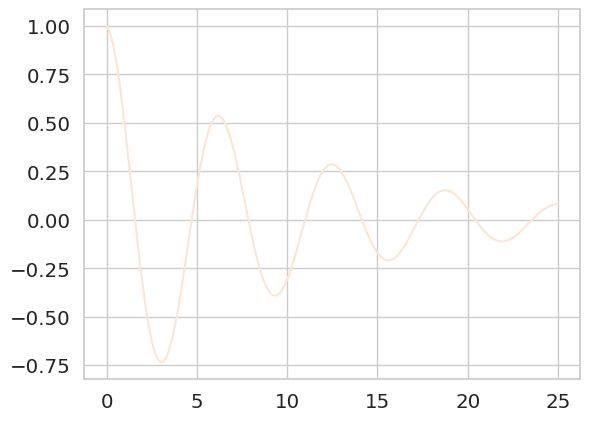

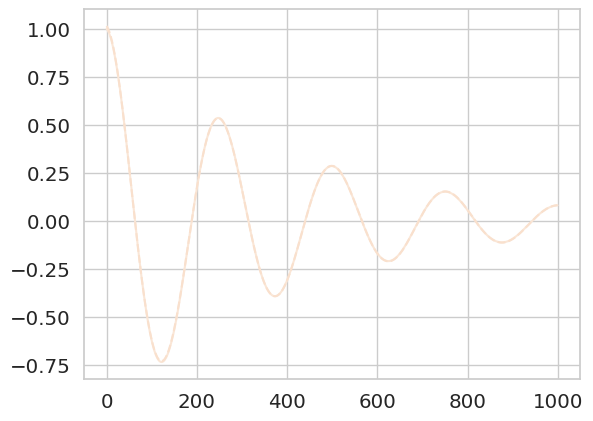

In [ ]:
seeds = [0 , 1, 2, 3]
all_all_eigs = []
all_losses = []
for i, seed in enumerate(seeds):
    losses,aligns, W_aligns, W, u,v, u_norm, c_scale, all_eigs = train_model_complex_target( target_exp , N, train_step = train_step, time_window = time_window, sigma = sigma, lr = lr, seed = seed)
    all_all_eigs += [all_eigs]
    all_losses += [losses]

0.0022769768
0.0022769768
(0.07500000000000001+0.07500000000000001j)
(250, 250)


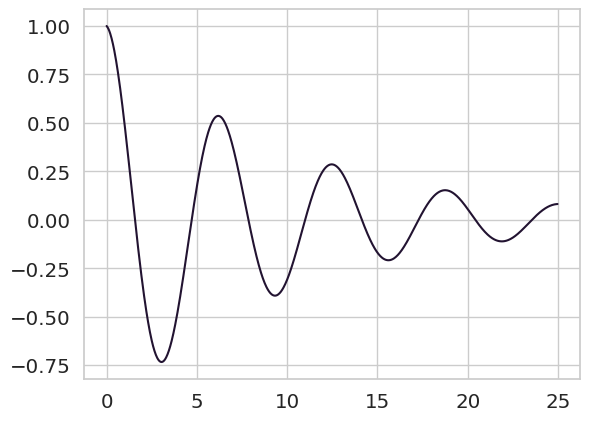

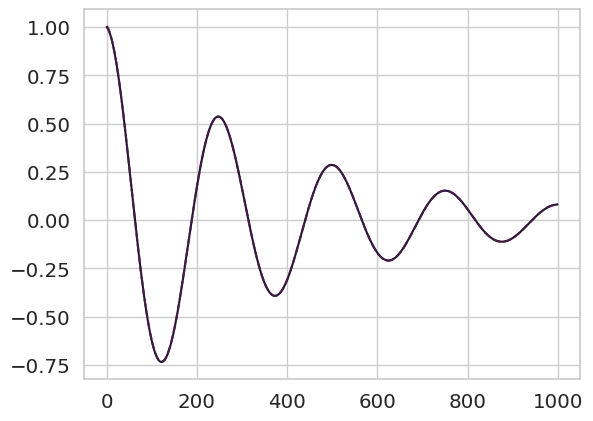

0.009107907
0.009107907
(0.15000000000000002+0.15000000000000002j)
(250, 250)


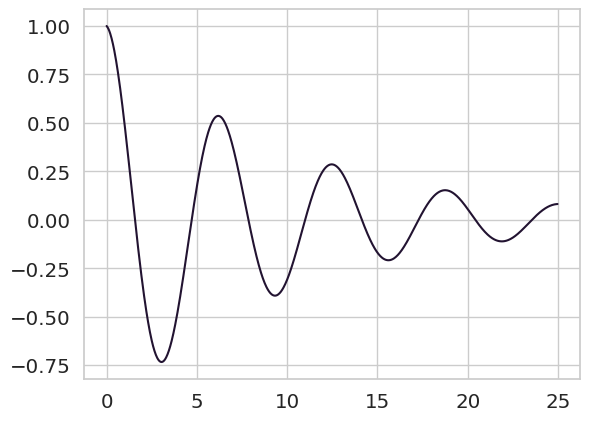

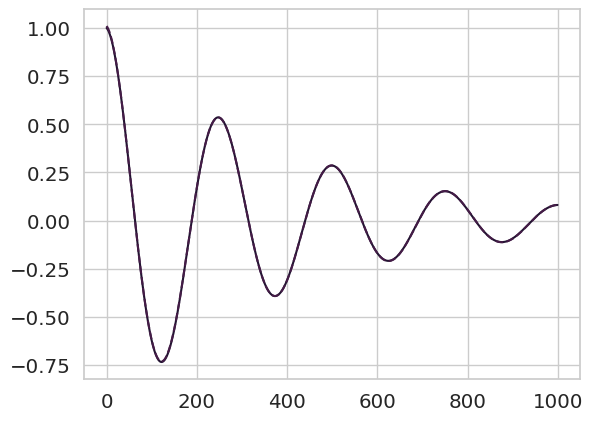

0.03643163
0.03643163
(0.30000000000000004+0.30000000000000004j)
(250, 250)


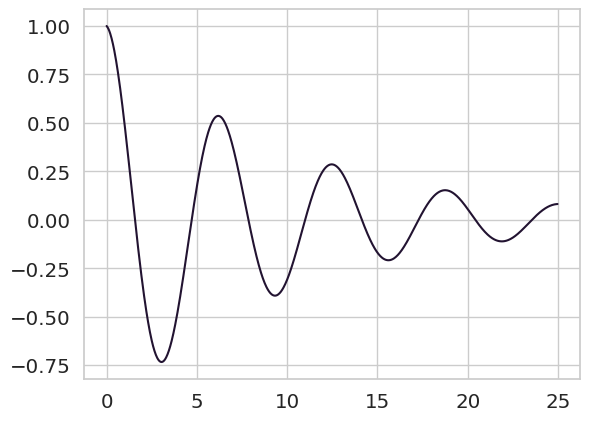

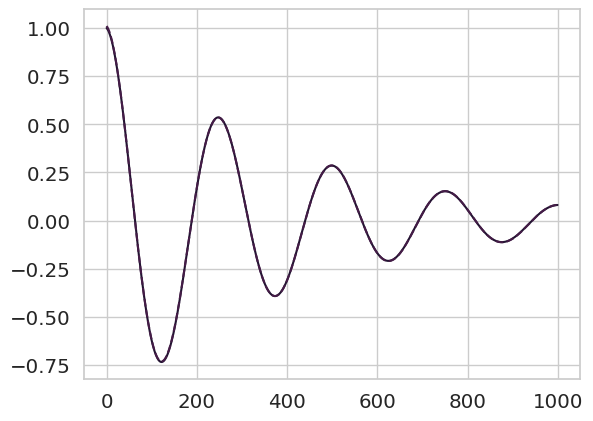

0.14572652
0.14572652
(0.6000000000000001+0.6000000000000001j)
(250, 250)


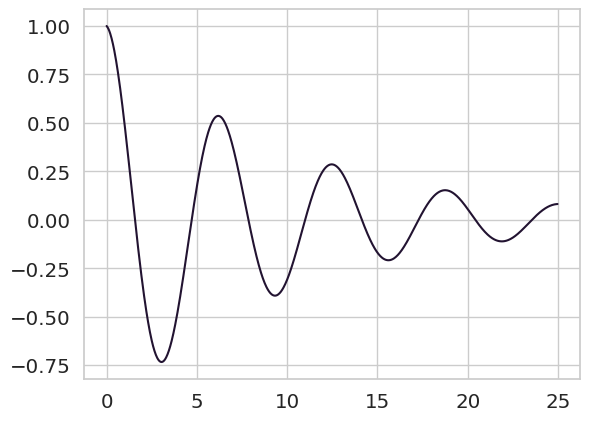

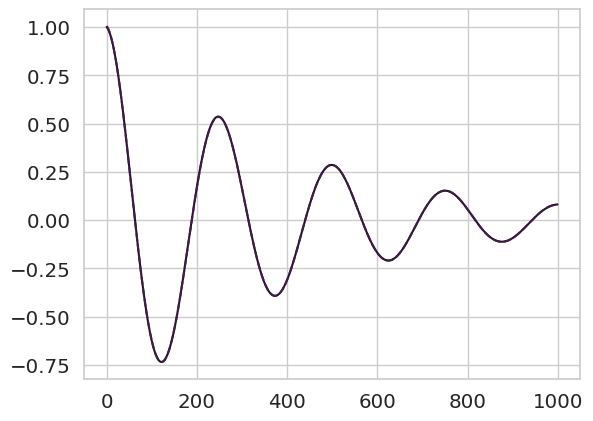

0.32788458
0.32788464
(0.8999999999999999+0.8999999999999999j)
(250, 250)


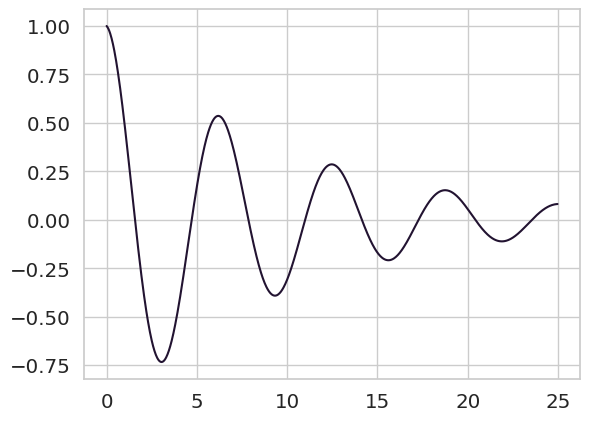

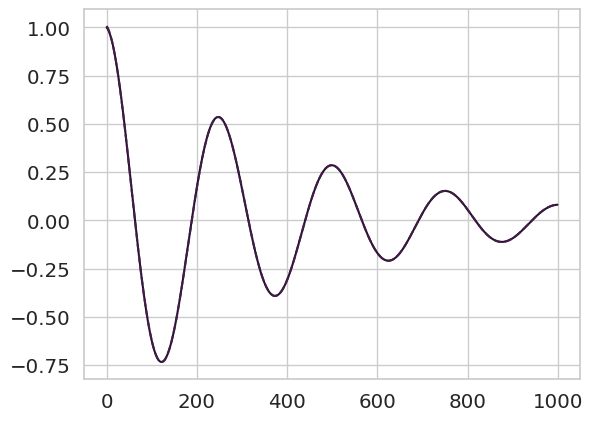

0.58290607
0.58290607
(1.2000000000000002+1.2000000000000002j)
(250, 250)


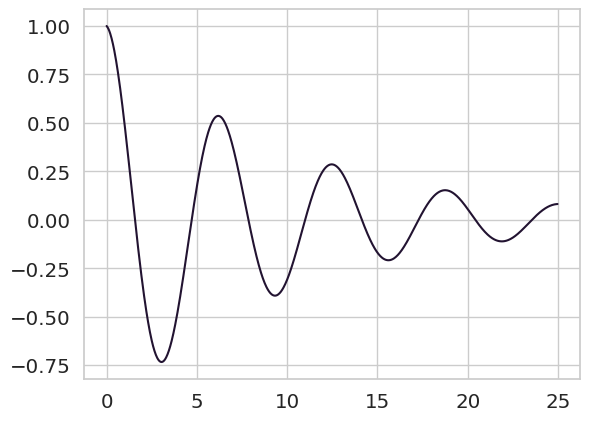

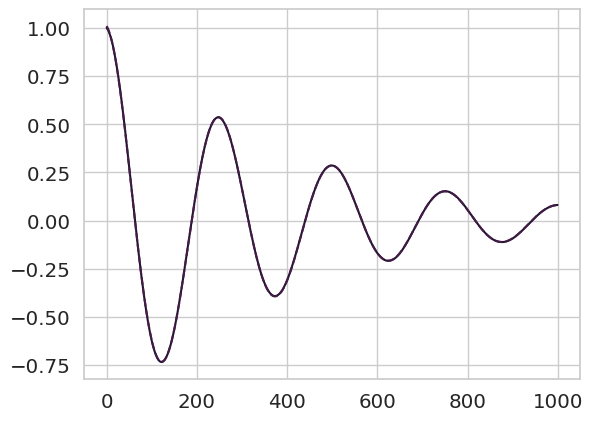

In [ ]:
sigmas = [0.05, 0.1, 0.2, 0.4, 0.6, 0.8]
all_all_eigs = []
all_losses = []
all_u_norm = []
all_uv_align = []
seed = 0
for i, sigma in enumerate(sigmas):
    losses,aligns, W_aligns, W, u,v, u_norm, c_scale, all_eigs = train_model_complex_target( target_exp , N, train_step = train_step, time_window = time_window, sigma = sigma, lr = lr, seed = seed)
    all_all_eigs += [all_eigs]
    all_losses += [losses]
    all_u_norm += [u_norm]

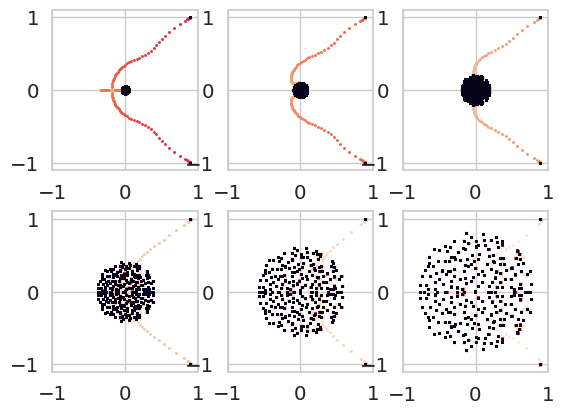

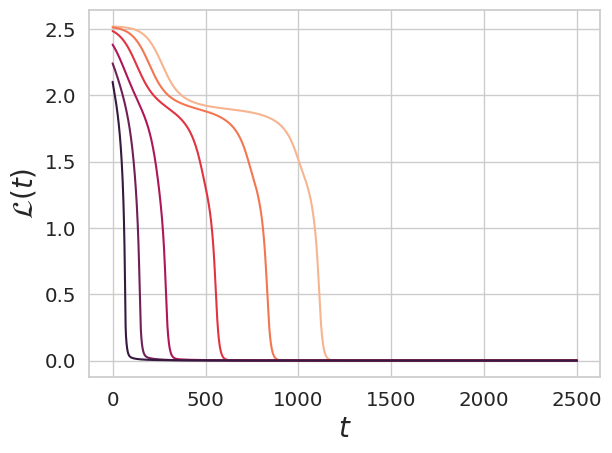

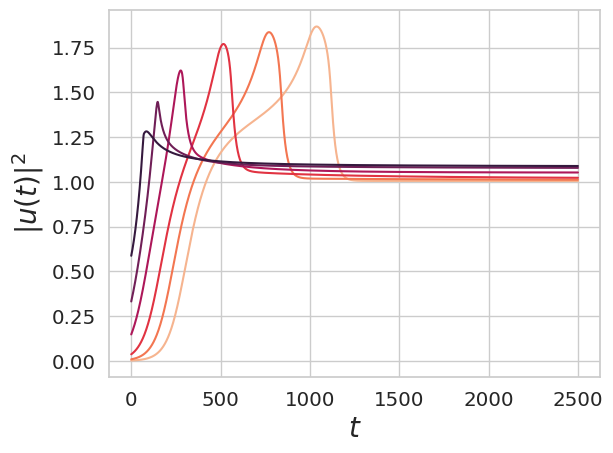

In [ ]:
times = jnp.arange(2, 250, 1)
sns.set_palette("rocket_r", n_colors=len(times))
for i, all_eigs in enumerate(all_all_eigs):
  plt.subplot(2,3, i+1)
  for t in times:
    plt.scatter(all_eigs[t].real, all_eigs[t].imag, s = 1.25)
    plt.gca().set_aspect('equal')
    plt.xlim([-1.0,1.0])
    #plt.scatter( all_eigs2d[t].real, all_eigs2d[t].imag , color = 'black', s = 0.25)
    #plt.xticks([])
    #plt.yticks([])
    #plt.xlabel(r'Re $\lambda$',fontsize =20)
    #plt.ylabel(r'Im $\lambda$',fontsize =20)

plt.savefig('eig_sigma_dependence_complex.pdf',bbox_inches = 'tight')
plt.show()



sns.set_palette("rocket_r", n_colors=len(all_losses))
for i, losses in enumerate(all_losses):
  plt.plot(losses)
plt.xlabel(r'$t$',fontsize = 20)
plt.ylabel(r'$\mathcal{L}(t)$',fontsize =20)
plt.tight_layout()
plt.show()


sns.set_palette("rocket_r", n_colors=len(all_losses))
for i, unorm in enumerate(all_u_norm):
  plt.plot(unorm)
plt.xlabel(r'$t$',fontsize=20)
plt.ylabel(r'$|u(t)|^2$',fontsize=20)
plt.tight_layout()
plt.show()

0.04363859
0.04363859
(0.30000000000000004+0.30000000000000004j)
(250, 250)


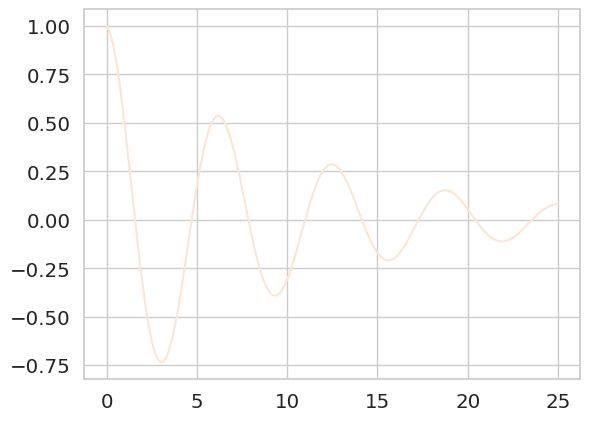

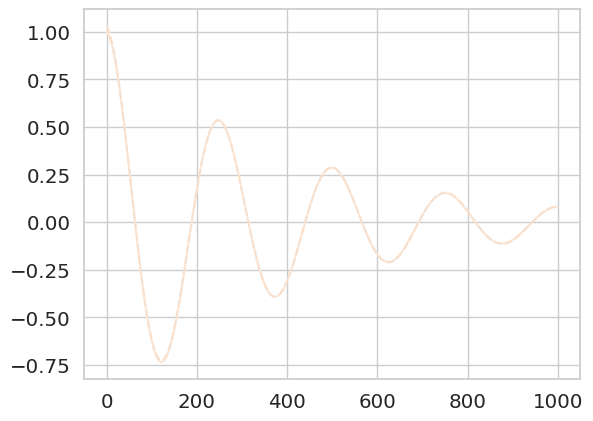

In [ ]:
#
sigma = sigmas[2]
losses,aligns, W_aligns, W, u,v, u_norm, c_scale, all_eigs = train_model_complex_target( target_exp , N, train_step = train_step, time_window = time_window, sigma = sigma, lr = lr, seed = seed)


0.04363859
0.04363859
(0.30000000000000004+0.30000000000000004j)
(250, 250)


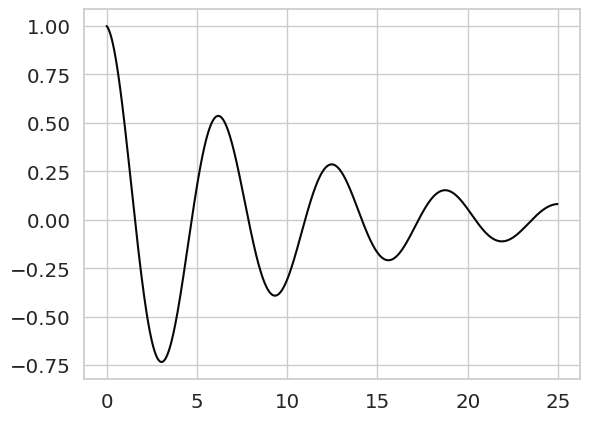

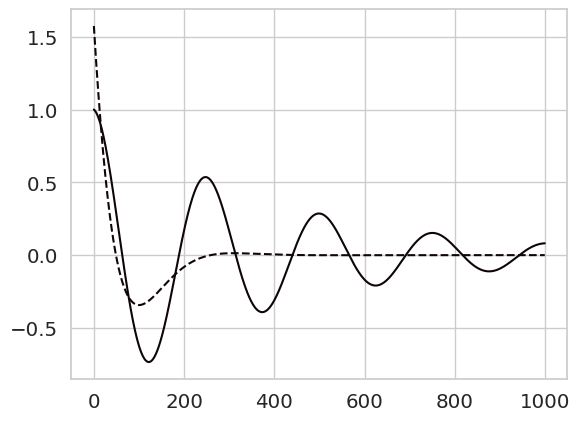

In [ ]:
t_est = 1000
sigma = sigmas[2]
losses,aligns, W_aligns, W, u,v, u_norm, c_scale, all_eigs = train_model_complex_target( target_exp , N, train_step = t_est, time_window = time_window, sigma = sigma, lr = lr, seed = seed)


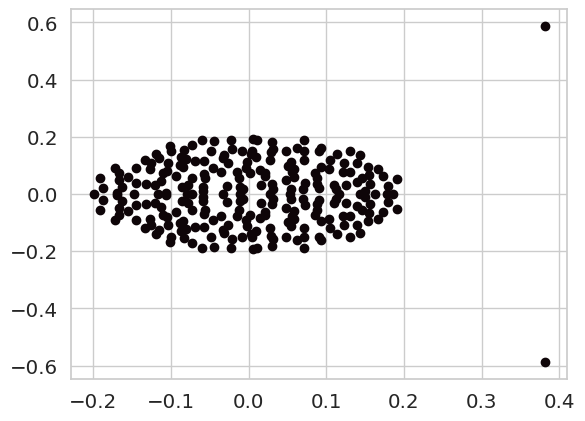

outlier eigs to start
(0.38138402+0.5875706j)
inner products
(1+0j)
(1+0j)
(1+0j)
(0.5939434+0.5355583j)
(0.5939434-0.5355583j)
(0.9390147+0.32389054j)
(0.9390147-0.32389054j)
[1.1295017  0.05838513]
[0.6151241 1.2629052]
0.7316132


In [ ]:
eigs, vecs = np.linalg.eig(W / jnp.sqrt(N))

plt.scatter(eigs.real, eigs.imag)
plt.show()


ind_max = jnp.argmax( eigs.imag )
ind_min = jnp.argmin( eigs.imag )

eig_stitch_init = eigs[ind_max]
print("outlier eigs to start")
print(eig_stitch_init)


max_v = vecs[:,ind_max]
min_v = vecs[:,ind_min]

print("inner products")
print( jnp.dot(max_v, min_v)  )
print( jnp.dot(max_v, max_v.conjugate() ) )
print( jnp.dot(min_v, min_v.conjugate() ) )

u_p = jnp.dot(max_v.conjugate(), u) / jnp.sqrt(N)
u_m = jnp.dot(min_v.conjugate(), u)/ jnp.sqrt(N)


v_p = jnp.dot(max_v.conjugate(), v)/ jnp.sqrt(N)
v_m = jnp.dot(min_v.conjugate(), v)/ jnp.sqrt(N)

print(u_p)
print(u_m)
print(v_p)
print(v_m)




u_vec = jnp.array( [ u_p.real + u_p.imag, u_p.real - u_p.imag ] )
v_vec = jnp.array( [ v_p.real - v_p.imag, v_p.real + v_p.imag ] )

print(u_vec)
print(v_vec)


print( (jnp.abs(u_p)**2 + jnp.abs(u_m)**2 ) / jnp.mean(u**2) )

0.04363859
0.04363859
(0.30000000000000004+0.30000000000000004j)
(250, 250)


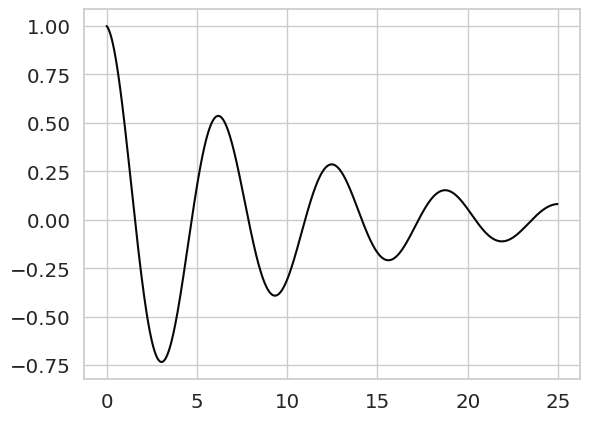

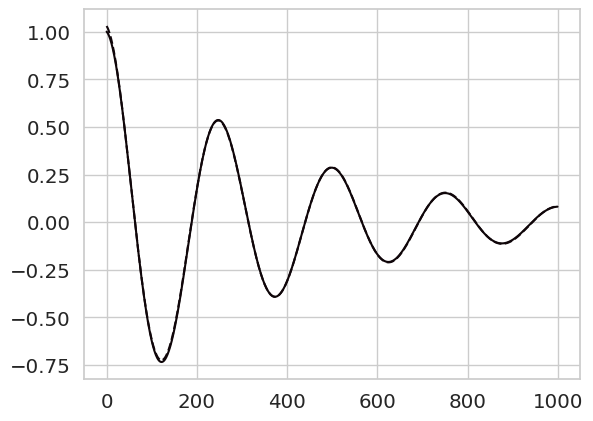

In [ ]:
sigma = sigmas[2]
losses,aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs = train_model_complex_target( target_exp , N, train_step = train_step, time_window = time_window, sigma = sigma, lr = lr, seed = seed)

0.2


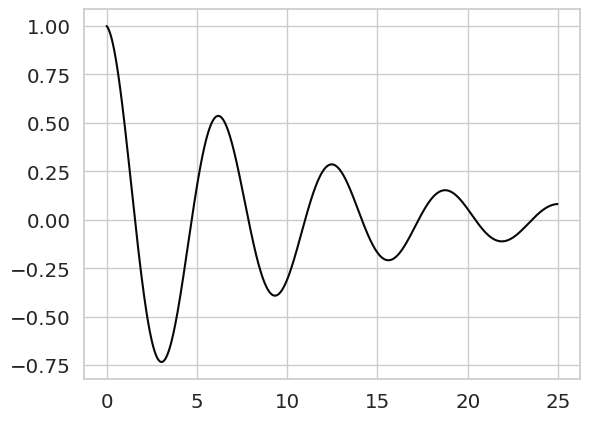

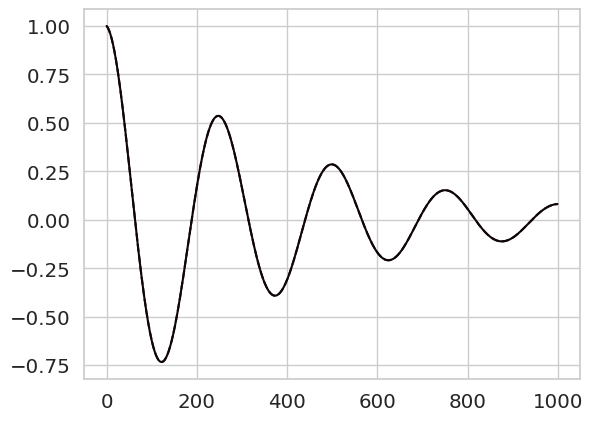

In [ ]:
#lamb_init = 0.0

#sigma = sigmas[2]
#lamb_init = -0.05 + 0.075 * 1j

lamb_init = eig_stitch_init

print(sigma)
losses2d, aligns2d, W_aligns2d, W2d, u2d, v2d, u_norm2d, c_scale2d, all_eigs2d, all_u_top2d = train_2d_RNN(target_exp, train_step = train_step, lamb_init = lamb_init, time_window = time_window, sigma =sigma, lr = lr, u_init=u_vec, v_init=v_vec)

In [ ]:
print(lamb_init )

(0.38138402+0.5875706j)


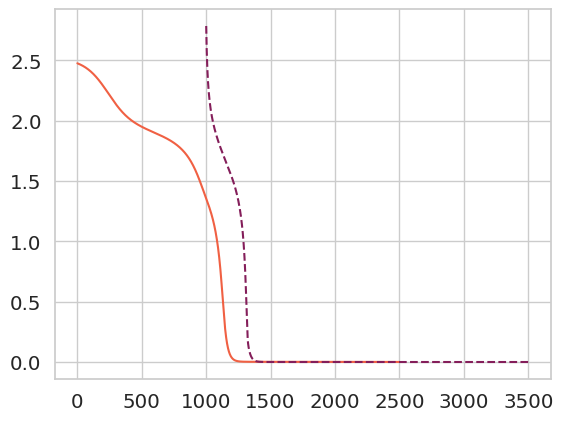

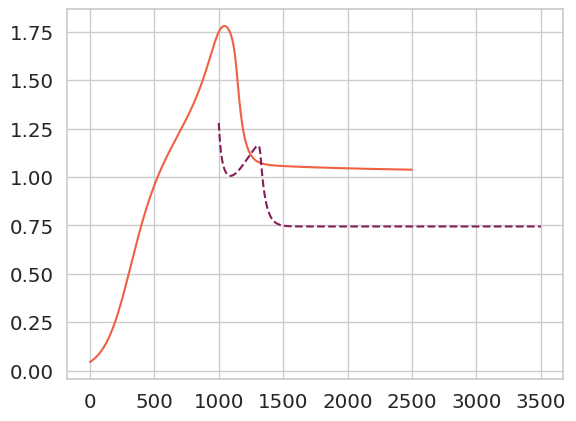

[0.38138402+0.5875706j 0.38138402-0.5875706j]


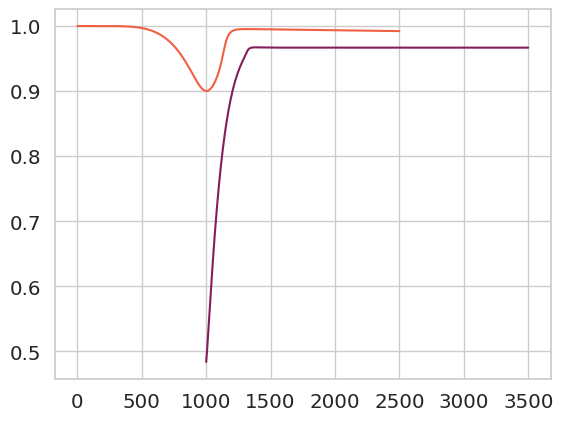

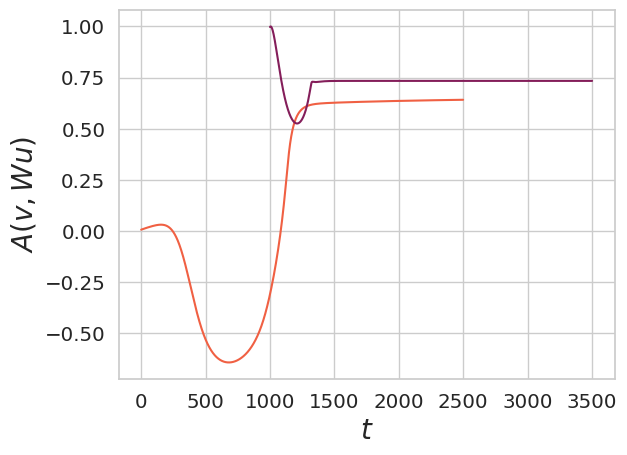

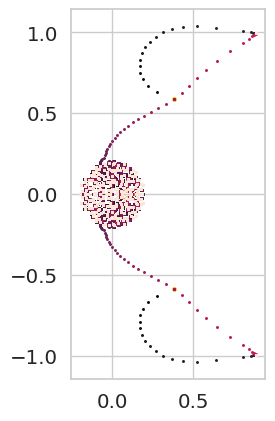

In [ ]:
sns.set_palette("rocket_r", n_colors=2)
plt.plot(losses)
plt.plot(jnp.linspace(t_est, len(losses2d)+t_est, len(losses2d)), losses2d, '--')
#plt.plot(losses2d, '--')
plt.show()

plt.plot(u_norm)
plt.plot(jnp.linspace(t_est, len(losses2d)+t_est, len(losses2d)),u_norm2d,'--')
plt.show()

print(all_eigs2d[0])

plt.plot(aligns)
plt.plot(jnp.linspace(t_est, len(losses2d)+t_est, len(losses2d)), aligns2d)
plt.show()


plt.plot(W_aligns)
plt.plot(jnp.linspace(t_est, len(losses2d)+t_est, len(losses2d)), W_aligns2d)
plt.ylabel(r'$A(v, W u)$', fontsize = 20)
plt.xlabel(r'$t$',fontsize = 20)
plt.show()

times = jnp.arange(0, 240, 2)

sns.set_palette("mako", n_colors=len(times))
plt.scatter( all_eigs2d[0].real, all_eigs2d[0].imag, s=5.5, color = 'orange')
for t in times:
    plt.scatter(all_eigs2d[t].real, all_eigs2d[t].imag, s = 1.25)
    plt.gca().set_aspect('equal')

cmap2 = sns.color_palette("rocket", n_colors=len(times))

for i,t in enumerate(times):
    plt.scatter(all_eigs[t].real, all_eigs[t].imag, s = 1.25, color = cmap2[i])
    plt.gca().set_aspect('equal')
#plt.ylim([-0.35,0.35])
#plt.xlim([-0.35,0.35])
plt.show()

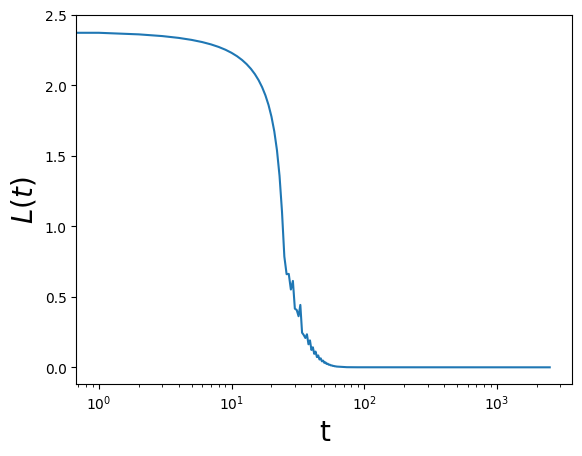

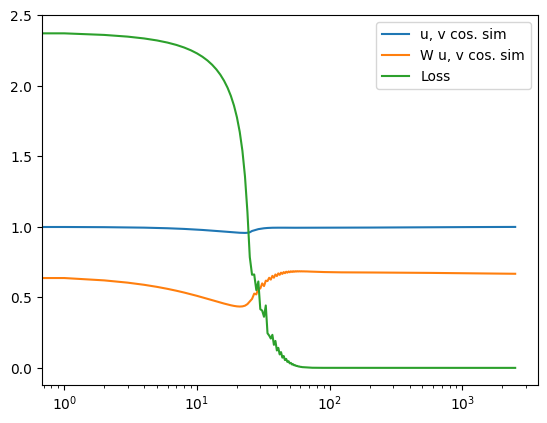

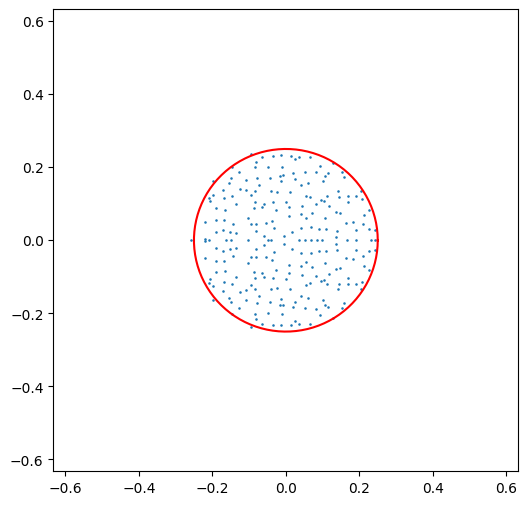

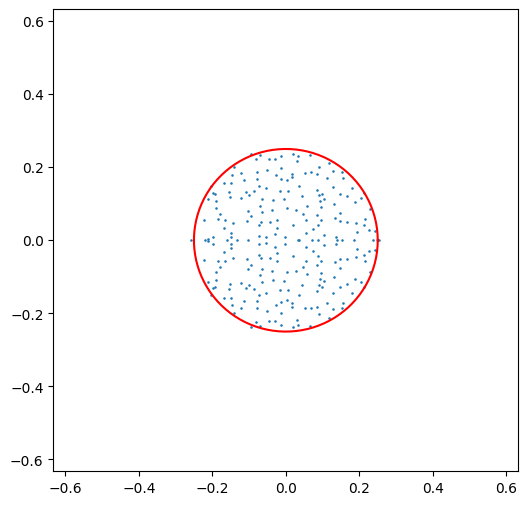

(250, 250)


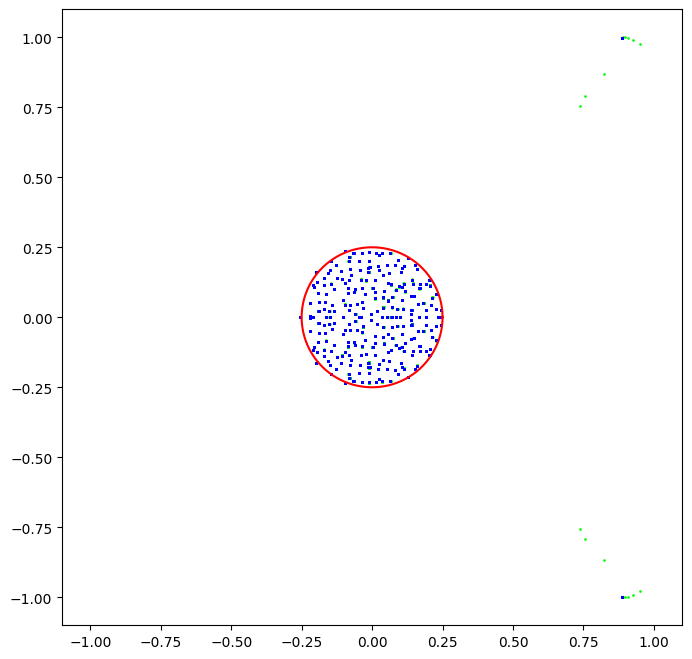

In [ ]:
"import numpy as np"

plt.semilogx(losses, label = r'Loss')
plt.xlabel('t',fontsize = 20)
plt.ylabel(r'$L(t)$',fontsize = 20)
plt.show()

plt.semilogx(aligns, label = 'u, v cos. sim')
plt.semilogx(W_aligns, label = 'W u, v cos. sim')
plt.semilogx(losses, label = r'Loss')
plt.legend()
#plt.semilogx(u_norm)
plt.show()


eigs = np.linalg.eigvals(W / jnp.sqrt(N))
plt.figure(figsize = (6,6))
plt.scatter(eigs.real, eigs.imag, s = 0.7)
thetas = np.linspace(0, 2*np.pi, 100)
plt.plot(  sigma * np.cos(thetas), sigma *np.sin(thetas), color = 'red')
box_size = 10 / np.sqrt(N)
plt.xlim([-box_size, box_size])
plt.ylim([-box_size, box_size])
plt.show()


W0 = sigma*random.normal(random.PRNGKey(2), (N,N))
plt.figure(figsize = (6,6))
eigs = np.linalg.eigvals(W0 / jnp.sqrt(N))
plt.scatter(eigs.real, eigs.imag, s = 0.7)
plt.plot(  sigma * np.cos(thetas), sigma *np.sin(thetas), color = 'red')
box_size = 10 / np.sqrt(N)
plt.xlim([-box_size, box_size])
plt.ylim([-box_size, box_size])
plt.show()


all_eigs = np.array(all_eigs)
print(all_eigs.shape)
Ts = np.linspace(0, 1, len(all_eigs))
plt.figure(figsize = (8,8))

for i, eig in enumerate(all_eigs):
    plt.scatter(eig.real, eig.imag, color=(0.0, 1.0*(1-Ts[i]) , Ts[i] ), s = 0.8)

thetas = np.linspace(0, 2*np.pi, 100)
plt.plot(  sigma * np.cos(thetas), sigma *np.sin(thetas), color = 'red')
#box_size = 20 / np.sqrt(N)
box_size = 1.1
plt.xlim([-box_size, box_size])
plt.ylim([-box_size, box_size])
plt.show()




In [ ]:
print(all_eigs.shape)
print(all_eigs.real)

(200, 500)
[[-7.7287252e-03 -7.7287252e-03  1.5477953e-03 ... -8.5211388e-04
  -8.5211388e-04  1.4541611e-03]
 [-7.7287233e-03 -7.7287233e-03  1.5477708e-03 ... -8.5198850e-04
  -8.5198850e-04  1.4541134e-03]
 [ 1.6486716e-02  1.6486716e-02 -7.7287205e-03 ... -8.5183181e-04
  -8.5183181e-04  1.4540558e-03]
 ...
 [ 8.8774866e-01  8.8774866e-01  1.2283460e-02 ...  2.1289026e-03
  -7.9344137e-04  1.0591578e-03]
 [ 8.8774866e-01  8.8774866e-01  1.2283464e-02 ...  2.1288542e-03
  -7.9344894e-04  1.0591706e-03]
 [ 8.8774860e-01  8.8774860e-01 -7.6669073e-03 ...  2.1287894e-03
  -7.9344981e-04  1.0591820e-03]]


<ipython-input-9-c0db2680e350>:18: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  line.set_data( arr  )


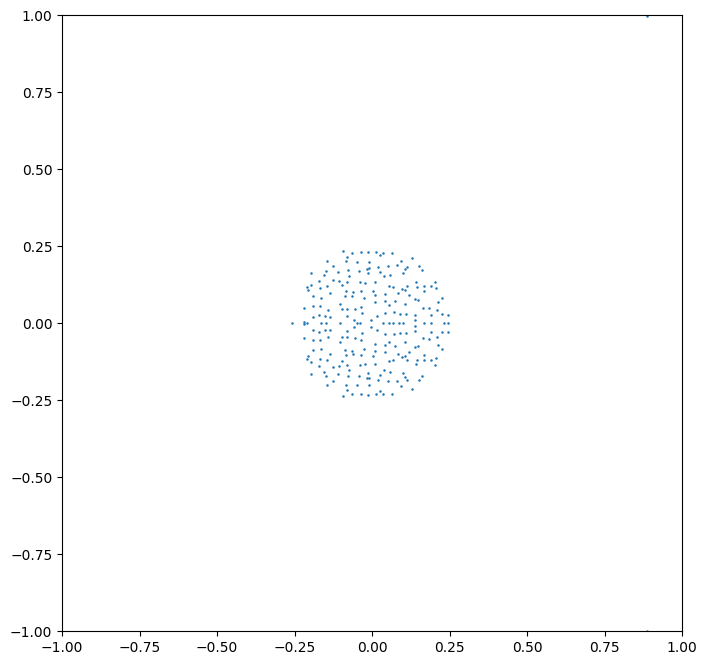

In [ ]:
import matplotlib.animation as animation

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot()


lines = [ ax.plot([],[], '-o', color = 'C0', markersize =0.8)[0] for _ in range(all_eigs.shape[1]) ] # multiple lines

def init():
    ax.set_xlim(-1.0, 1.0)
    ax.set_ylim(-1.0, 1.0)
    return lines

def update(frame, all_eigs, lines):

    for i, line in enumerate(lines):
      arr = np.array([ all_eigs[frame,i].real, all_eigs[frame,i].imag ])
      line.set_data( arr  )
    return lines

ani = animation.FuncAnimation(fig, update, range(all_eigs.shape[0]), init_func=init, interval = 100, fargs=(all_eigs, lines), blit=True)

ani.save('complex_eigs.mp4')
plt.show()

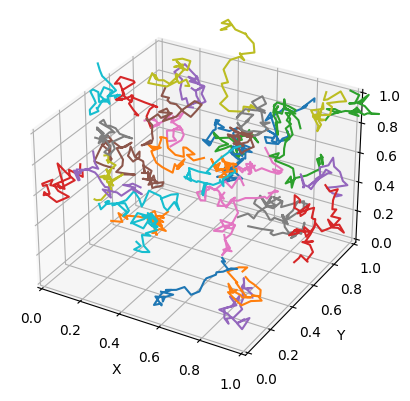

In [ ]:
np.random.seed(19680801)


def random_walk(num_steps, max_step=0.05):
    """Return a 3D random walk as (num_steps, 3) array."""
    start_pos = np.random.random(3)
    steps = np.random.uniform(-max_step, max_step, size=(num_steps, 3))
    walk = start_pos + np.cumsum(steps, axis=0)
    return walk


def update_lines(num, walks, lines):
    for line, walk in zip(lines, walks):
        line.set_data_3d(walk[:num, :].T)
    return lines


# Data: 40 random walks as (num_steps, 3) arrays
num_steps = 30
walks = [random_walk(num_steps) for index in range(40)]

# Attaching 3D axis to the figure
fig = plt.figure()
ax = fig.add_subplot(projection="3d")

# Create lines initially without data
lines = [ax.plot([], [], [])[0] for _ in walks]

# Setting the Axes properties
ax.set(xlim3d=(0, 1), xlabel='X')
ax.set(ylim3d=(0, 1), ylabel='Y')
ax.set(zlim3d=(0, 1), zlabel='Z')

# Creating the Animation object
ani = animation.FuncAnimation(
    fig, update_lines, num_steps, fargs=(walks, lines), interval=100)

ani.save('random_walk_ex.mp4')
plt.show()

In [ ]:
def cos_sim(a,b):
  return jnp.dot(a,b)/jnp.sqrt( jnp.sum(a**2) * jnp.sum(b**2) )

def dot_prod(a,b):
  return jnp.dot(a,b)

print("u , v")
print(cos_sim(u,v))

eigs, vecs = np.linalg.eig(W / jnp.sqrt(N))

indsort = np.argsort(np.imag(eigs))

eig_sort = eigs[indsort]
vec_sort = vecs[:, indsort]

print("outlier eigenvalues")
print(eig_sort[0])
print(eig_sort[-1])

print("raw dot prod sim, z and u")

print( dot_prod( np.real(vec_sort[:,0]) ,  u)  )
print( dot_prod( np.imag(vec_sort[:,0]) ,  u)  )
print( dot_prod( np.real(vec_sort[:,-1]) ,  u)  )
print( dot_prod( np.imag(vec_sort[:,-1]) ,  u)  )

print("cosine sim, z and u")
print( cos_sim( np.real(vec_sort[:,0]) ,  u)  )
print( cos_sim( np.imag(vec_sort[:,0]) ,  u)  )
print( cos_sim( np.real(vec_sort[:,-1]) ,  u)  )
print( cos_sim( np.imag(vec_sort[:,-1]) ,  u)  )


print("real, imag similarity")
print( cos_sim( np.real(vec_sort[:,0]) ,  np.imag(vec_sort[:,0]))  )



print(vec_sort[:3,-1] )
print(vec_sort[:3,0] )

# can u be decomposed in terms of

print("orthogonal components")
print(cos_sim( jnp.real( vec_sort[:,0] ), jnp.imag(vec_sort[:,0]) ))


u_proj = jnp.dot( jnp.real( vec_sort[:,0] ), u ) * jnp.real( vec_sort[:,0] ) / jnp.sum(jnp.real( vec_sort[:,0] )**2 ) + jnp.dot( jnp.imag( vec_sort[:,0] ), u ) * jnp.imag( vec_sort[:,0] )/ jnp.sum(jnp.imag( vec_sort[:,0] )**2 )

print("coeffs")


coeff1 = jnp.dot( jnp.real( vec_sort[:,0] ), u ) /  jnp.sum(jnp.real( vec_sort[:,0] )**2 )**(0.5)
print(coeff1)
coeff2 = jnp.dot( jnp.imag( vec_sort[:,0] ), u ) / jnp.sum(jnp.imag( vec_sort[:,0] )**2 )**(0.5)
print(coeff2)
coeff1 = jnp.dot( jnp.real( vec_sort[:,-1] ), u ) /  jnp.sum(jnp.real( vec_sort[:,-1] )**2 )**(0.5)
print(coeff1)
coeff2 = jnp.dot( jnp.imag( vec_sort[:,-1] ), u ) / jnp.sum(jnp.imag( vec_sort[:,-1] )**2 )**(0.5)
print(coeff2)

print("cosine sim uproj, u")
print(cos_sim(u_proj, u))



eigs_R , vecs_R = np.linalg.eig(W.T / jnp.sqrt(N))

indsort_R = np.argsort(np.imag(eigs_R))

eig_sort_R = eigs_R[indsort_R]
vec_sort_R = vecs_R[:, indsort_R]

print("W and W.T similarity")
print( jnp.sum( W * W.T ) / jnp.sqrt( jnp.sum(W**2) * jnp.sum(W**2) ) )

print("first outlier")
print(cos_sim( jnp.real(vec_sort_R[:,0]), jnp.real(vec_sort[:,0])))
print(cos_sim(vec_sort_R[:,0].imag , vec_sort[:,0].imag ))

print("second outlier")
print(cos_sim( jnp.real(vec_sort_R[:,-1]), jnp.real(vec_sort[:,-1])))
print(cos_sim(vec_sort_R[:,-1].imag , vec_sort[:,-1].imag ))


print( jnp.dot( vec_sort[:,0] , vec_sort[:,0 ] ))
print( jnp.dot( vec_sort[:,-1] , vec_sort[:,-1] ))


# z^T z = 0

# W = [ z+   z-  ] diag( lambdas ) [ z+^* , z-^*  ]

u , v
0.9999334
outlier eigenvalues
(0.8877486-0.9973372j)
(0.8877486+0.9973372j)
raw dot prod sim, z and u
15.761026
1.1707033
15.761026
-1.1707033
cosine sim, z and u
0.99610186
0.07397777
0.99610186
-0.07397777
real, imag similarity
0.0010136571
[0.01673423+0.03766169j 0.02834311+0.02728288j 0.02034776+0.01503057j]
[0.01673423-0.03766169j 0.02834311-0.02728288j 0.02034776-0.01503057j]
orthogonal components
0.0010136571
coeffs
22.29112
1.6555009
22.29112
-1.6555009
cosine sim uproj, u
0.9987704
W and W.T similarity
-0.10622909
first outlier
-0.99997616
0.99999976
second outlier
-0.99997616
0.99999976
(-0.00014928542+0.0010136571j)
(-0.00014928542-0.0010136571j)


In [ ]:
from jax import vmap

def simulate_complex(c_star, omega_star, u0, c0, omega0, train_step, sigma = 0.05, lr = 0.01):


    def loss_fn(params):

      u, v, c, omega = params

      L = 0.25 * u**2 * v**2 * (1.0/c + c/(c**2+omega**2))
      L += 0.25 * (1.0/c_star + c_star/(c_star**2 + omega_star**2))
      L += -u*v*( (c+c_star)/( (c+c_star)**2 + (omega+omega_star)**2 ) )
      L += -u*v*( (c+c_star)/( (c+c_star)**2 + (omega-omega_star)**2 ) )
      return L


    params = [u0, u0, c0, omega0]

    val_grad_fn = jit( value_and_grad(loss_fn) )

    update = lambda p, g: p - lr * g

    update_grads = vmap(update, (0,0))
    losses = []
    all_c_omega = []
    all_u = []

    for t in range(train_step):
        loss, grads = val_grad_fn(params)
        losses += [loss]


        params = [ update(params[i], g) for i, g in enumerate(grads) ]
        #params = update_grads( params, grads )
        u, v, c, omega = params
        all_c_omega += [ c + 1j*omega ]
        all_u += [u]
    return losses, all_c_omega, all_u


In [ ]:
def train_model_complex_target_warmstart(target_exp, N, train_step, lamb_init, time_window, dt = 0.025, sigma = 0.1, lr = 0.01, tied = True, leak = 1.0, gamma = 1.0):

  u_dir = random.normal(random.PRNGKey(0), (N,))
  u_dir = u_dir / jnp.sqrt( jnp.mean(u_dir**2) )
  u = sigma*u_dir
  if tied:
    v = u
  else:
    v = sigma*random.normal(random.PRNGKey(1), (N,))

  perp_u = random.normal( random.PRNGKey(3), (N,)  )
  perp_u = perp_u - jnp.dot(perp_u, u)/jnp.sum(u**2) * u
  perp_u = perp_u / jnp.sqrt( jnp.sum(perp_u**2) ) * jnp.sqrt( jnp.sum(u**2) )
  print(jnp.sum(perp_u**2) / N)
  print(jnp.sum(u**2) / N )


  u_normed = u / jnp.sqrt(jnp.sum(u**2) )
  perp_u_normed = perp_u / jnp.sqrt(jnp.sum(perp_u**2) )

  z = 1/jnp.sqrt(2) * ( u_normed + 1j * perp_u_normed )


  outlier_component = lamb_init * jnp.outer( z, jnp.conjugate(z) ) + jnp.conjugate(lamb_init) * jnp.outer( jnp.conjugate(z), z )

  outlier_component = outlier_component.real
  print(outlier_component.shape)
  #  s * u
  W = sigma*random.normal(random.PRNGKey(2), (N,N))  + jnp.sqrt(N) * outlier_component

  def loss_fn(params):
    u, v, W = params

    def update_fn(carry, x):
      h = carry
      dh = dt * ( - leak * h + 1/jnp.sqrt(N) * W @ h  ) # run forward dynamics starting from u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v ) / gamma
      return h_new, window

    _, f = lax.scan(update_fn, init = u, xs= None, length = time_window)
    y = jnp.exp( - target_exp * jnp.linspace(0, time_window-1, time_window) * dt  ).real

    return jnp.sum( (f-y)**2 ) * dt

  y = jnp.exp( - target_exp * jnp.linspace(0, time_window-1, time_window) * dt  ).real

  plt.plot(jnp.linspace(0, time_window-1, time_window) * dt, y)
  plt.show()

  params = [u, v, W]

  val_grad_fn = jit( value_and_grad(loss_fn) )
  opt_init, opt_update, get_params = optimizers.sgd( lr * N * gamma**2 )

  opt_state = opt_init(params)

  losses = []
  aligns = []
  W_aligns = []
  u_norm = []
  c_scale = []

  all_eigs = []
  all_zu = []
  all_u_top_eig = []

  for t in range(train_step):

    u, v, W = get_params(opt_state)

    if t % 10 == 0:
      #eig = np.linalg.eigvals( W / jnp.sqrt(N) )

      eig, vecs = np.linalg.eig( W / jnp.sqrt(N) )
      all_eigs += [ eig ]
      ind_max = jnp.argsort( eig.imag )[::-1][0]
      all_u_top_eig += [jnp.mean( vecs[:,ind_max] * u )]


    loss, grads = val_grad_fn(get_params(opt_state))

    opt_state = opt_update(t, grads, opt_state)

    losses.append(loss)


    aligns += [ jnp.sum( u * v ) / jnp.sqrt( jnp.sum(u**2) * jnp.sum(v**2) ) ]
    W_aligns += [  jnp.sum( v * ( W @ u )) / jnp.sqrt( jnp.sum((W @ u)**2) * jnp.sum(v**2) )   ]

    u_norm += [ jnp.mean(u**2) ]
    c_scale += [ jnp.mean(  v *  (W @ u / jnp.sqrt(N) )) ]

    all_zu += [ jnp.mean( u * z ) ]



  # check final windowing fn
  def update_fn(carry, x):
      h = carry
      dh = dt * ( -leak*h + 1/jnp.sqrt(N) * W @ h  ) # run forward dynamics starting rom u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v ) / gamma
      return h_new, window

  _, f = lax.scan(update_fn, init = u, xs= None, length = time_window)
  plt.plot(y)
  plt.plot(f, '--')
  plt.show()

  return losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs, all_zu, all_u_top_eig


0.022500008
0.022500005
(400, 400)


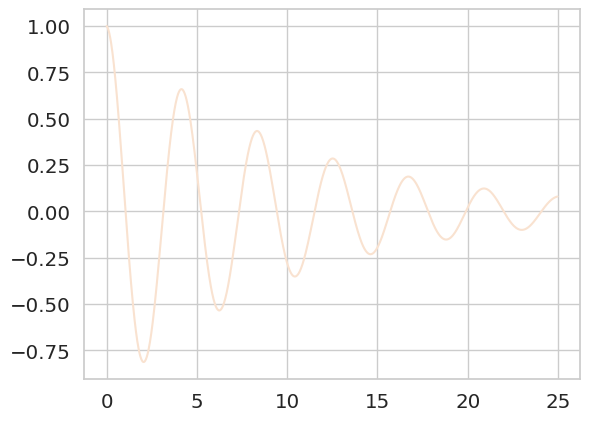

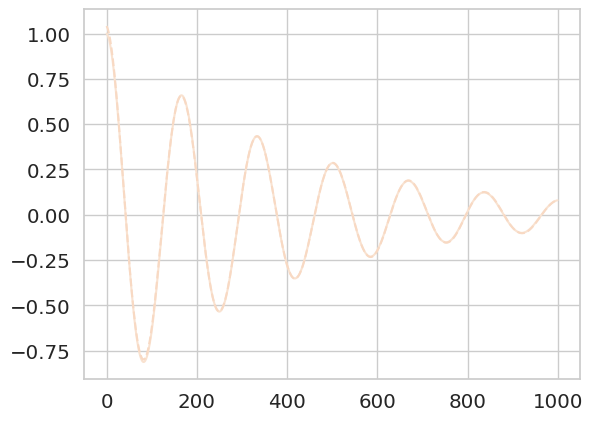

In [ ]:
N = 400

# define target function
c_star = 0.1
omega_star = 1.5
target_exp = c_star + 1j * omega_star

#sigma = 0.15
sigma = 0.15
lr = 0.005

time_window = 1000
train_step = 2500

c0 = 1.0
omega0 = 0.2

lamb_init = 1.0-c0 + 1j * omega0

losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs, all_zu, all_u_top = train_model_complex_target_warmstart(target_exp, N, train_step, lamb_init, time_window,sigma=sigma, lr = lr)


In [ ]:

# lamb_init should be the initial eigenvalue
def train_2d_RNN(target_exp, train_step, lamb_init, time_window, dt = 0.025, sigma = 0.1, lr = 0.01, u_init = None, v_init = None, gamma=1.0):


  if u_init == None or v_init == None:
    u = sigma * jnp.array([1.0, 0.0])
    v = u
  else:
    u = u_init
    v = v_init

  u_norm = jnp.array([1.0,0.0])
  u_perp = jnp.array([0.0,1.0])

  z = 1/jnp.sqrt(2) * ( u_norm + 1j*u_perp )

  #real_lamb = jnp.real( lamb_init )
  #imag_lamb = jnp.imag( lamb_init )

  # eigenvalues are  (x - lr)^2 + li^2 = 0, x = lr +/- i * li
  #W = jnp.array( [ [ real_lamb,  imag_lamb ],  [ - imag_lamb, real_lamb] ] )

  W = lamb_init * jnp.outer(z, z.conjugate()) + lamb_init.conjugate() * jnp.outer(z.conjugate(), z)
  W = W.real

  def loss_fn(params):
    u, v, W = params

    def update_fn(carry, x):
      h = carry
      dh = dt * ( - h + W @ h  ) # run forward dynamics starting from u
      h_new = h + dh
      window = jnp.sum( h * v ) / gamma
      return h_new, window

    _, f = lax.scan(update_fn, init = u, xs= None, length = time_window)
    y = jnp.exp( - target_exp * jnp.linspace(0, time_window-1, time_window) * dt  ).real

    return jnp.sum( (f-y)**2 ) * dt

  y = jnp.exp( - target_exp * jnp.linspace(0, time_window-1, time_window) * dt  ).real

  plt.plot(jnp.linspace(0, time_window-1, time_window) * dt, y)
  plt.show()

  params = [u, v, W]

  val_grad_fn = jit( value_and_grad(loss_fn) )
  opt_init, opt_update, get_params = optimizers.sgd( lr * gamma**2 )

  opt_state = opt_init(params)

  losses = []
  aligns = []
  W_aligns = []
  u_norm = []
  c_scale = []

  all_eigs = []
  all_zu = []
  all_u_top_eig = []

  for t in range(train_step):

    u, v, W = get_params(opt_state)

    if t % 10 == 0:
      #eig = np.linalg.eigvals( W / jnp.sqrt(N) )

      eig, vecs = np.linalg.eig( W )
      all_eigs += [ eig ]
      ind_max = jnp.argsort( eig.imag )[::-1][0]
      all_u_top_eig += [jnp.sum( vecs[:,ind_max] * u )]


    loss, grads = val_grad_fn(get_params(opt_state))

    opt_state = opt_update(t, grads, opt_state)

    losses.append(loss)


    aligns += [ jnp.sum( u * v ) / jnp.sqrt( jnp.sum(u**2) * jnp.sum(v**2) ) ]
    W_aligns += [  jnp.sum( v * ( W @ u )) / jnp.sqrt( jnp.sum((W @ u)**2) * jnp.sum(v**2) )   ]

    u_norm += [ jnp.sum(u**2) ]
    c_scale += [ jnp.sum(  v *  (W @ u  )) ]




  # check final windowing fn
  def update_fn(carry, x):
      h = carry
      dh = dt * ( - h +  W @ h  ) # run forward dynamics starting rom u
      h_new = h + dh
      window = jnp.sum( h * v ) / gamma
      return h_new, window

  _, f = lax.scan(update_fn, init = u, xs= None, length = time_window)
  plt.plot(y)
  plt.plot(f, '--')
  plt.show()

  return losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs, all_u_top_eig


In [ ]:
print(lamb_init)

0.2j


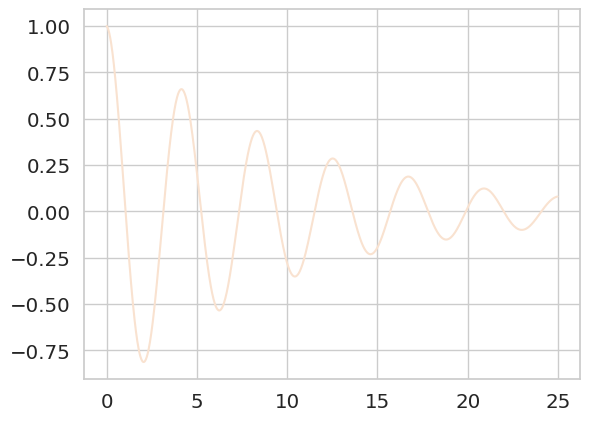

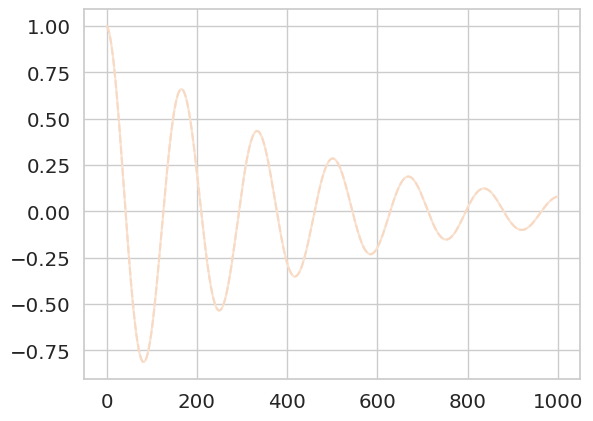

In [ ]:
losses2d, aligns2d, W_aligns2d, W2d, u2d, v2d, u_norm2d, c_scale2d, all_eigs2d, all_u_top2d = train_2d_RNN(target_exp, train_step, lamb_init, time_window,sigma=sigma, lr = lr)

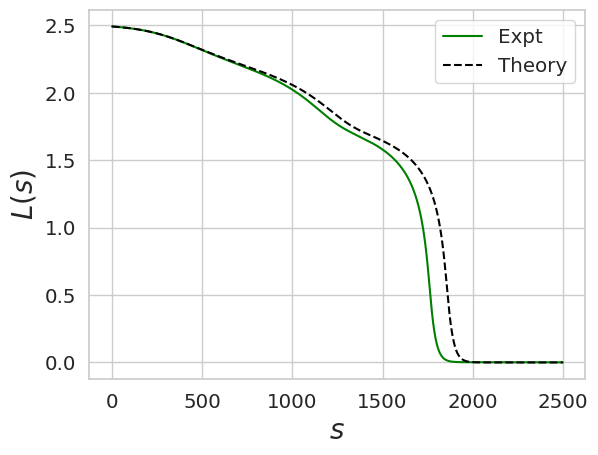

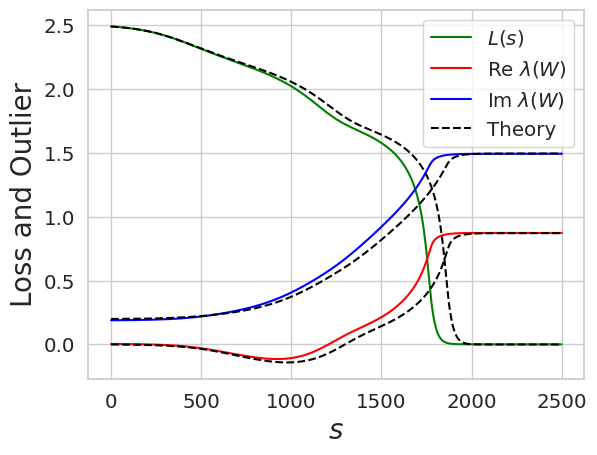

In [ ]:
plt.plot(losses, color ='green', label = 'Expt')
plt.plot(losses2d, '--' , color = 'black', label = 'Theory')
plt.xlabel(r'$s$',fontsize = 20)
plt.ylabel(r'$L(s)$',fontsize = 20)
plt.legend()
plt.savefig('complex_eig_loss.pdf',bbox_inches = 'tight')
plt.show()


max_eig = []
max_eig2d =[]
for i,eig in enumerate(all_eigs):
  ind = jnp.argmax(eig.imag)

  max_eig += [ eig[ind] ]
  ind = jnp.argmax( all_eigs2d[i].imag )
  max_eig2d += [ all_eigs2d[i][ind] ]

plt.plot(losses, color ='green', label = r'$L(s)$')
plt.plot(losses2d, '--', color = 'black')

plt.plot(jnp.linspace(1, len(losses), len(max_eig)),jnp.array(max_eig).real, color ='red', label = r'Re $\lambda(W)$')
plt.plot(jnp.linspace(1, len(losses), len(max_eig)), jnp.array(max_eig).imag, color ='blue', label = r'Im $\lambda(W)$')
plt.plot(jnp.linspace(1, len(losses), len(max_eig)),jnp.array(max_eig2d).imag , '--', color = 'black', label = 'Theory')
plt.plot(jnp.linspace(1, len(losses), len(max_eig)), jnp.array(max_eig2d).real , '--', color = 'black')
#plt.plot(losses2d, '--' , color = 'black', label = 'Theory')
plt.xlabel(r'$s$',fontsize = 20)
plt.ylabel(r'Loss and Outlier',fontsize = 20)
plt.legend()
plt.savefig('complex_eig_imag_components.pdf',bbox_inches = 'tight')
plt.show()


(250, 400)


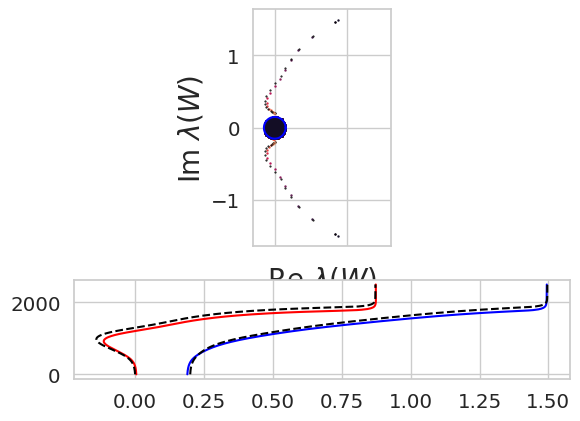

In [ ]:
all_eigs = np.array(all_eigs)
all_eigs2d = np.array(all_eigs2d)

print(all_eigs.shape)
Ts = np.linspace(0, 1, len(all_eigs))
#plt.figure(figsize = (10,6))
f, (a0, a1) = plt.subplots(2, 1, height_ratios=[3.0, 1.25])

times = jnp.arange(10, 200, 10)
sns.set_palette("rocket_r", n_colors=len(times))

for t in times:
    a0.scatter(all_eigs[t].real, all_eigs[t].imag, s = 0.5)
    a0.scatter( all_eigs2d[t].real, all_eigs2d[t].imag , color = 'black', s = 0.25)

#plt.scatter([], [], color=(0.0, 1.0*(1-Ts[len(all_eigs)//2]) , Ts[len(all_eigs)//2] ), s = 12.0, label = 'Expt')
a0.scatter( [], [] , color = 'black', s = 12.0)
thetas = np.linspace(0, 2*np.pi, 100)
a0.plot(  sigma * np.cos(thetas), sigma *np.sin(thetas), color = 'blue')
#box_size = 20 / np.sqrt(N)

box_size = 1.6

#a0.scatter( [1-c0,1-c0], [lamb_init.imag*2, -lamb_init.imag*2], marker = '*', label = 'Init.')
#a0.scatter( [1-c_star,1-c_star], [omega_star, -omega_star], marker = '*', color = 'red', label = 'Final')

#plt.plot(  1.0-jnp.array(c_omega).real, jnp.array(c_omega).imag , '--', color = 'black' )
#plt.plot(  1.0-jnp.array(c_omega).real, -jnp.array(c_omega).imag , '--', color = 'black')

a0.set_xticklabels([])
#a0.set_xlim([-0.3, box_size])
#a0.set_ylim([-2*box_size,2* box_size])
a0.set_aspect('equal')

a0.set_xlabel(r'Re $\lambda(W)$',fontsize = 20)
a0.set_ylabel(r'Im $\lambda(W)$',fontsize = 20)

a0.set_xlim([-0.3, box_size])

a1.plot(jnp.array(max_eig).real, jnp.linspace(1, len(losses), len(max_eig)), color ='red', label = r'Re $\lambda(W)$')
a1.plot(jnp.array(max_eig).imag, jnp.linspace(1, len(losses), len(max_eig)), color ='blue', label = r'Im $\lambda(W)$')
a1.plot(jnp.array(max_eig2d).imag, jnp.linspace(1, len(losses), len(max_eig)), '--', color = 'black', label = 'Theory')
a1.plot(jnp.array(max_eig2d).real, jnp.linspace(1, len(losses), len(max_eig)), '--', color = 'black')
#a0.legend()
#plt.tight_layout()
plt.savefig('complex_plane_eig_trajectory.pdf',bbox_inches = 'tight')
plt.show()

(250, 400)


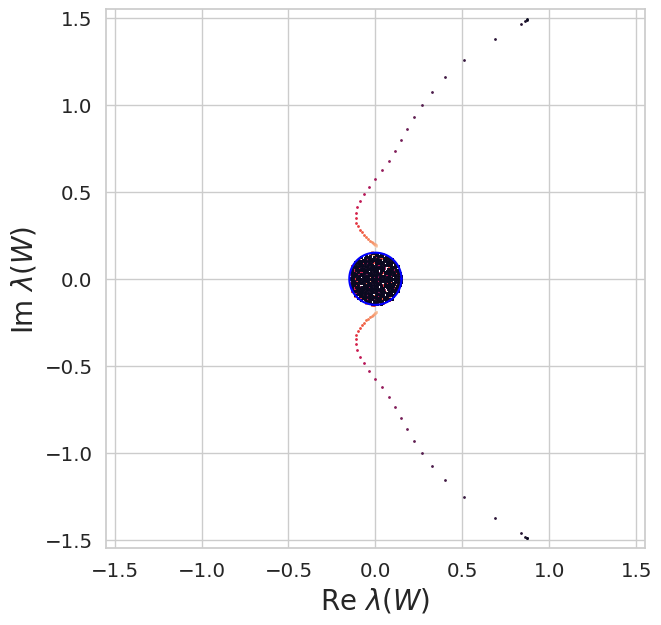

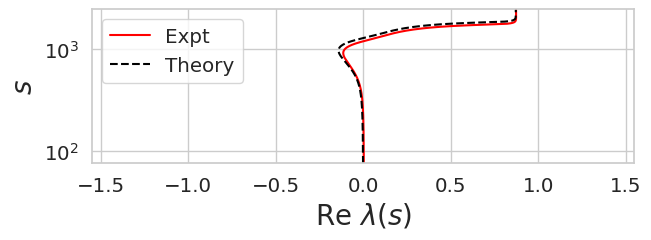

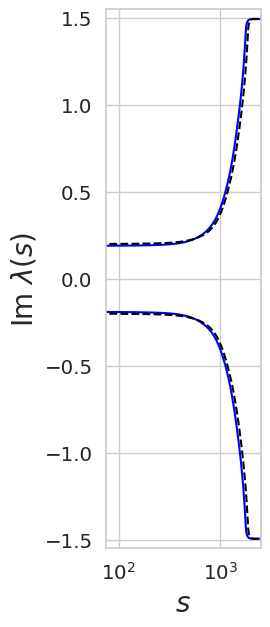

In [ ]:
all_eigs = np.array(all_eigs)
all_eigs2d = np.array(all_eigs2d)

print(all_eigs.shape)
Ts = np.linspace(0, 1, len(all_eigs))
#plt.figure(figsize = (10,6))
#f, (a0, a1) = plt.subplots(2, 1, height_ratios=[3.0, 1.25])

times = jnp.arange(5, 200, 5)
sns.set_palette("rocket_r", n_colors=len(times))
plt.figure(figsize = (7,7))
for t in times:
    plt.scatter(all_eigs[t].real, all_eigs[t].imag, s = 1.0)
    #plt.scatter(all_eigs2d[t].real, all_eigs2d[t].imag, color = 'black', s = 1.0)


plt.scatter( [], [] , color = 'black', s = 12.0)
thetas = np.linspace(0, 2*np.pi, 100)
plt.plot(  sigma * np.cos(thetas), sigma *np.sin(thetas), color = 'blue')

box_size = 1.55

#a0.scatter( [1-c0,1-c0], [lamb_init.imag*2, -lamb_init.imag*2], marker = '*', label = 'Init.')
#a0.scatter( [1-c_star,1-c_star], [omega_star, -omega_star], marker = '*', color = 'red', label = 'Final')

#plt.plot(  1.0-jnp.array(c_omega).real, jnp.array(c_omega).imag , '--', color = 'black' )
#plt.plot(  1.0-jnp.array(c_omega).real, -jnp.array(c_omega).imag , '--', color = 'black')

#plt.set_xticklabels([])

plt.xlim([-box_size, box_size])
plt.ylim([-box_size,box_size])

plt.xlabel(r'Re $\lambda(W)$',fontsize = 20)
plt.ylabel(r'Im $\lambda(W)$',fontsize = 20)

plt.gca().set_aspect('equal')

plt.savefig('complex_plane_eig_trajectory.pdf',bbox_inches = 'tight')
plt.show()


plt.figure(figsize = (7,2))
plt.plot(jnp.array(max_eig).real, jnp.linspace(1, len(losses), len(max_eig)), color ='red', label = r'Expt')
#plt.plot(jnp.array(max_eig).imag, jnp.linspace(1, len(losses), len(max_eig)), color ='blue', label = r'Im $\lambda(W)$')
plt.plot(jnp.array(max_eig2d).real, jnp.linspace(1, len(losses), len(max_eig)), '--', color = 'black', label = 'Theory')
#a1.plot(jnp.array(max_eig2d).real, jnp.linspace(1, len(losses), len(max_eig)), '--', color = 'black')
#a0.legend()
plt.xlim([-box_size, box_size])
plt.ylim([75,2500])
plt.legend()
plt.yscale('log')
plt.xlabel(r'Re $\lambda(s)$',fontsize = 20)
plt.ylabel(r'$s$',fontsize = 20)
plt.savefig('real_part_outlier_dynamics.pdf',bbox_inches = 'tight')
plt.show()


plt.figure(figsize = (2,7))
#plt.figure()
plt.plot(jnp.linspace(1, len(losses), len(max_eig)), jnp.array(max_eig).imag, color ='blue')
plt.plot(jnp.linspace(1, len(losses), len(max_eig)), -jnp.array(max_eig).imag, color = 'blue')

#plt.plot(jnp.array(max_eig).imag, jnp.linspace(1, len(losses), len(max_eig)), color ='blue', label = r'Im $\lambda(W)$')
plt.plot(jnp.linspace(1, len(losses), len(max_eig)), jnp.array(max_eig2d).imag, '--', color = 'black')
plt.plot(jnp.linspace(1, len(losses), len(max_eig)), -jnp.array(max_eig2d).imag, '--', color = 'black')

#a1.plot(jnp.array(max_eig2d).real, jnp.linspace(1, len(losses), len(max_eig)), '--', color = 'black')
#a0.legend()
plt.ylim([-box_size, box_size])
plt.xlim([75,2500])
#plt.legend()
plt.xscale('log')
plt.ylabel(r'Im $\lambda(s)$',fontsize = 20)
plt.xlabel(r'$s$',fontsize = 20)
plt.savefig('imag_part_outlier_dynamics.pdf',bbox_inches = 'tight')
plt.show()

0.040000003
0.040000003
(400, 400)


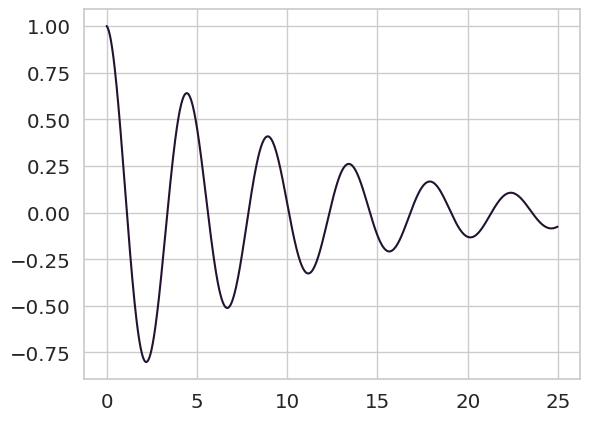

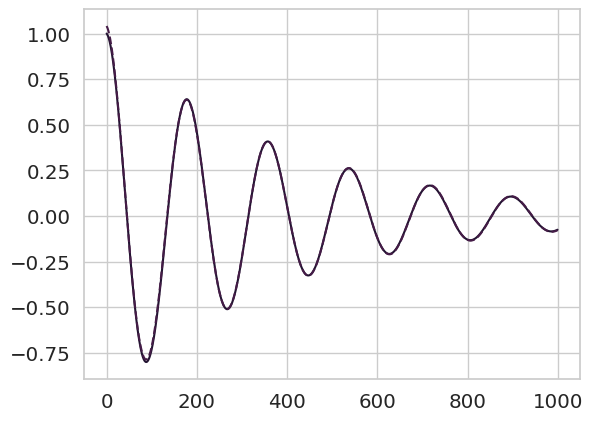

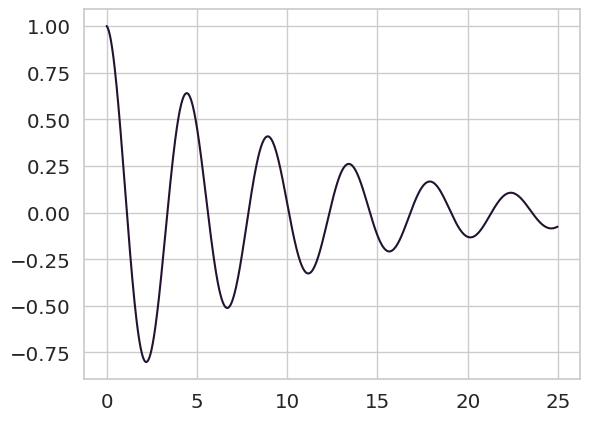

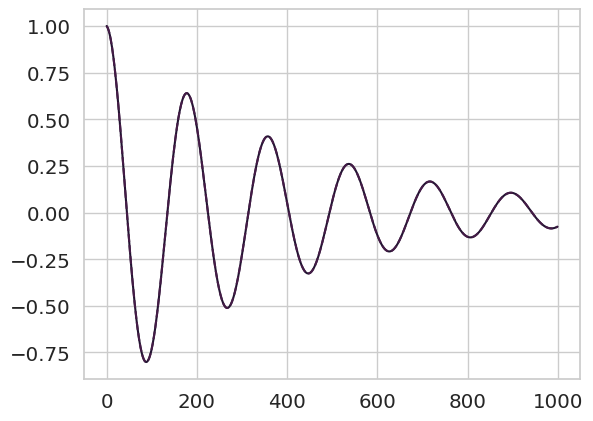

0.040000003
0.040000003
(400, 400)


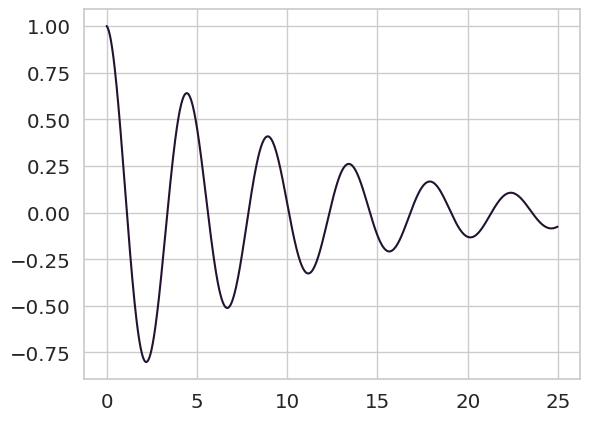

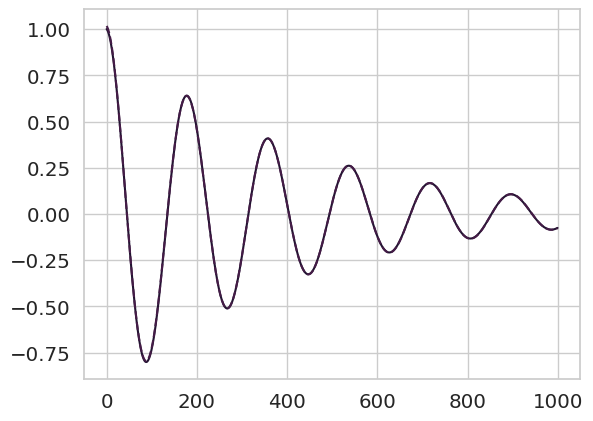

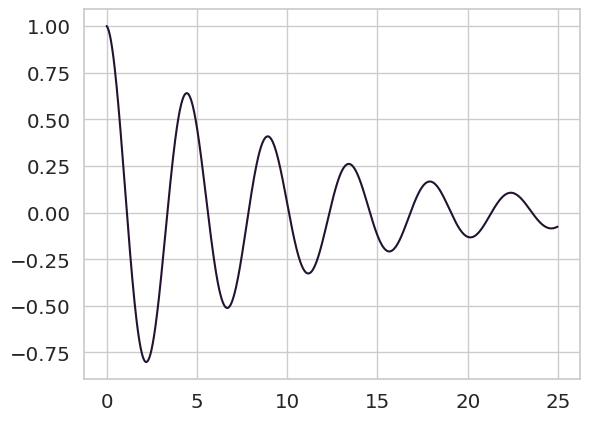

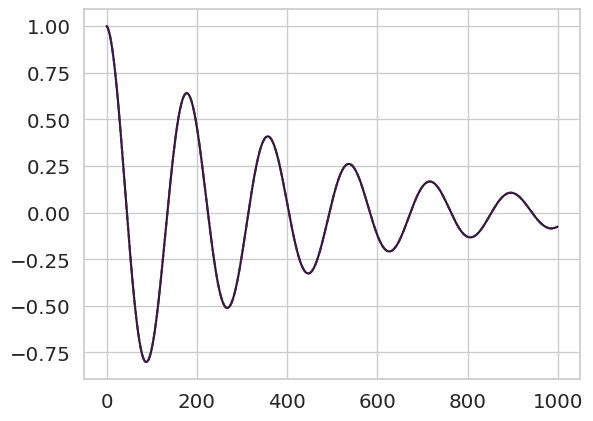

0.040000003
0.040000003
(400, 400)


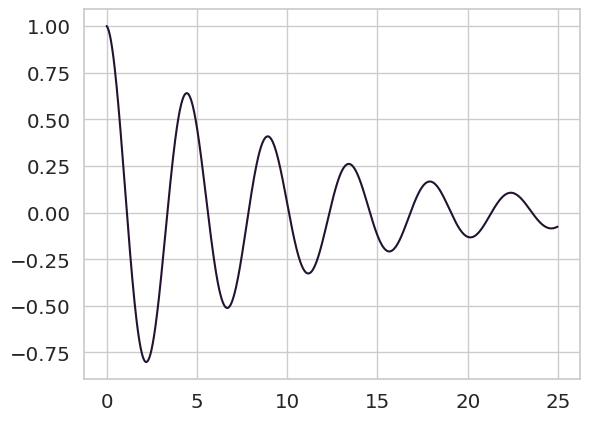

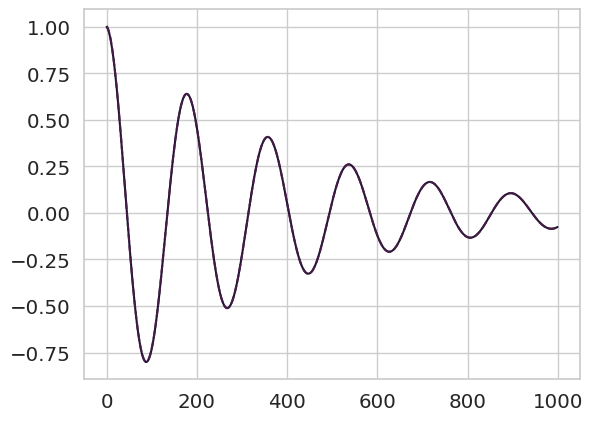

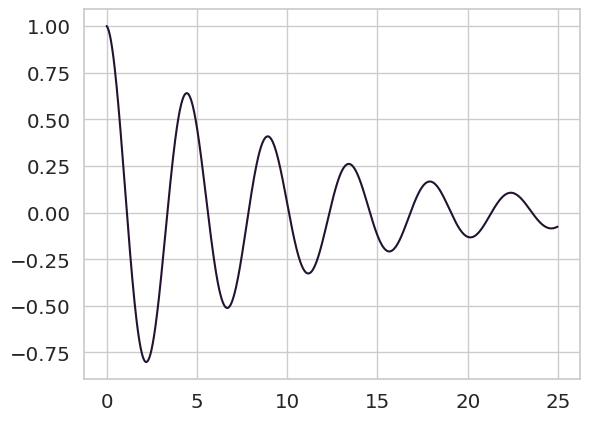

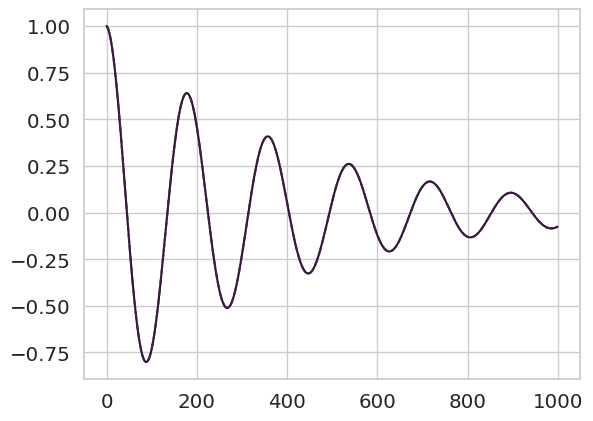

In [ ]:
omega0s = [ 0.2, 0.5, 0.75 ]

all_losses = []
all_all_eigs = []


all_losses_th = []
all_all_eigs_th = []


for i, omega0 in enumerate(omega0s):

  lamb_init = (1.0-c0)/2.0 + 1j * omega0 /2.0
  losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs, all_zu, all_u_top = train_model_complex_target_warmstart(target_exp, N, train_step, lamb_init, time_window,sigma=sigma, lr = lr)
  all_all_eigs += [np.array(all_eigs)]
  all_losses += [losses]
  losses2d, aligns2d, W_aligns2d, W2d, u2d, v2d, u_norm2d, c_scale2d, all_eigs2d, all_u_top2d = train_2d_RNN(target_exp, train_step, 2.0*lamb_init, time_window,sigma=sigma, lr = lr)
  all_losses_th += [losses2d]
  all_all_eigs_th += [np.array(all_eigs2d)]


## Transition from Lazy to Rich

0.48999998
0.49000004
(200, 200)


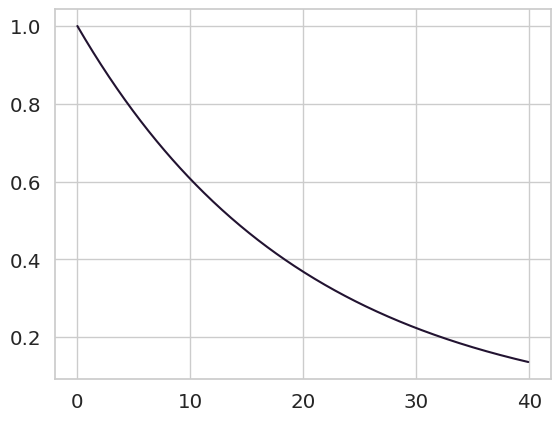

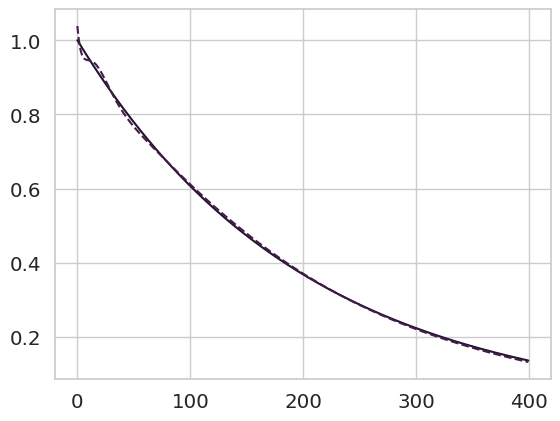

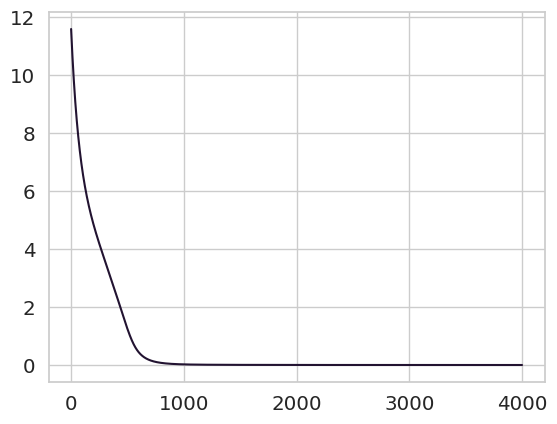

0.48999998
0.49000004
(200, 200)


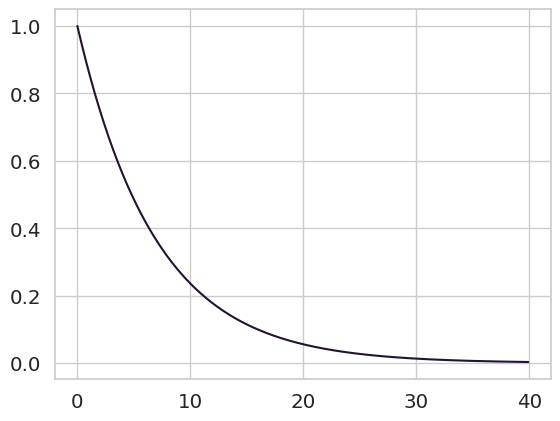

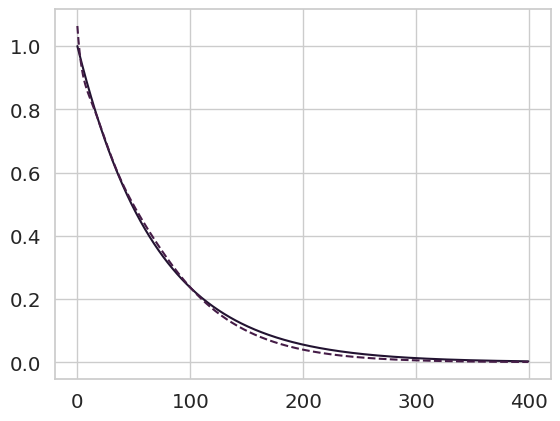

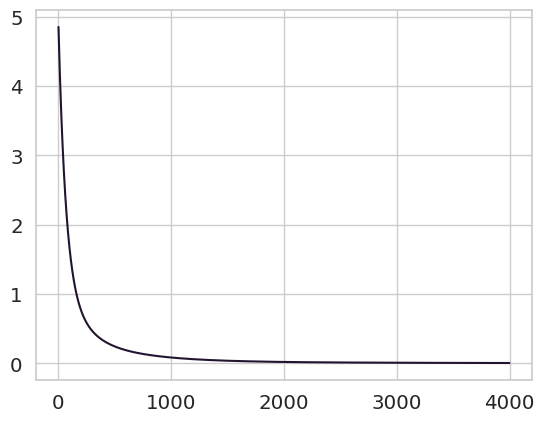

0.48999998
0.49000004
(200, 200)


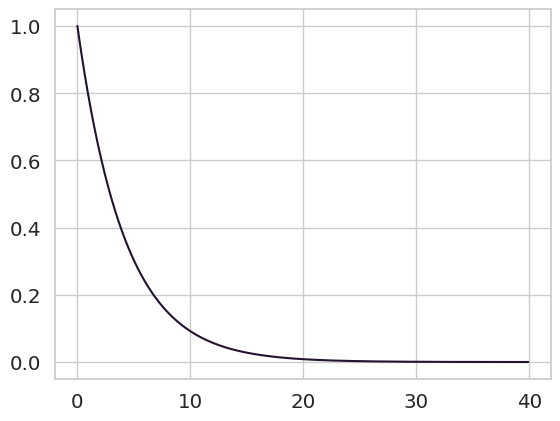

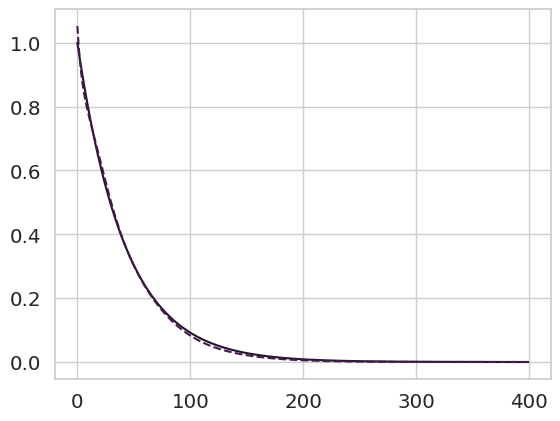

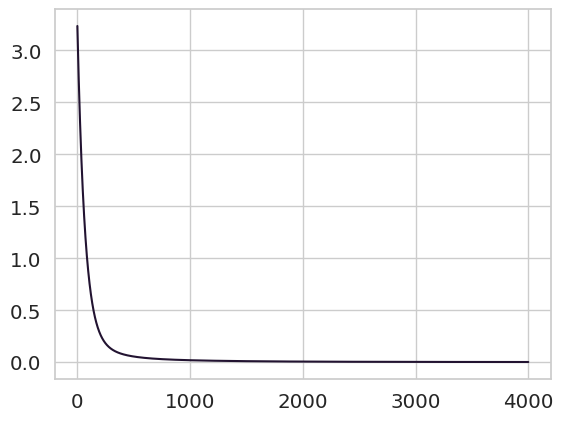

0.48999998
0.49000004
(200, 200)


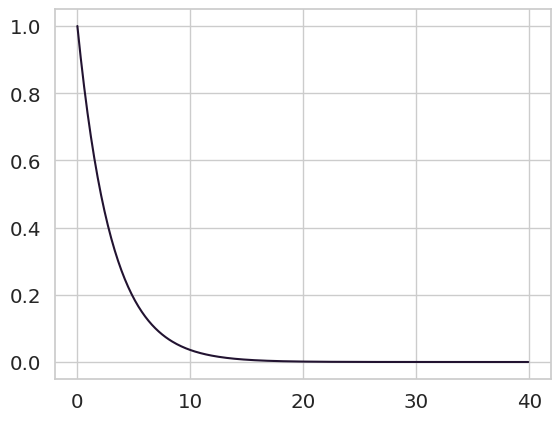

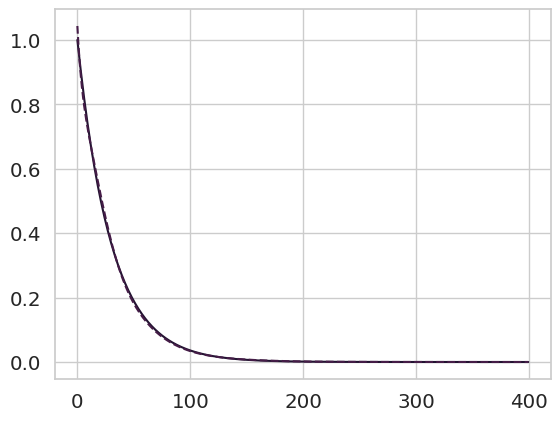

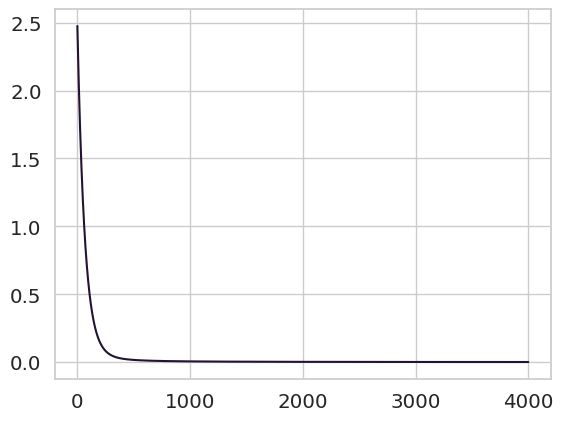

0.48999998
0.49000004
(200, 200)


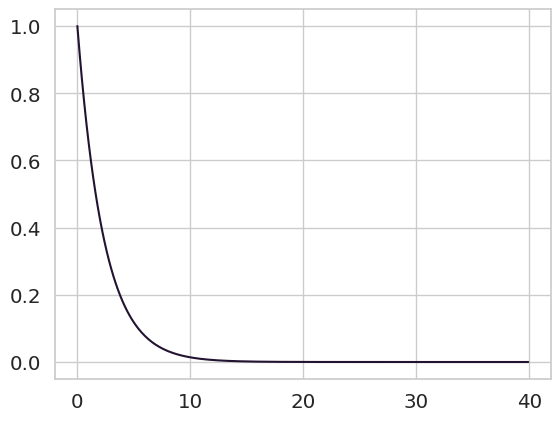

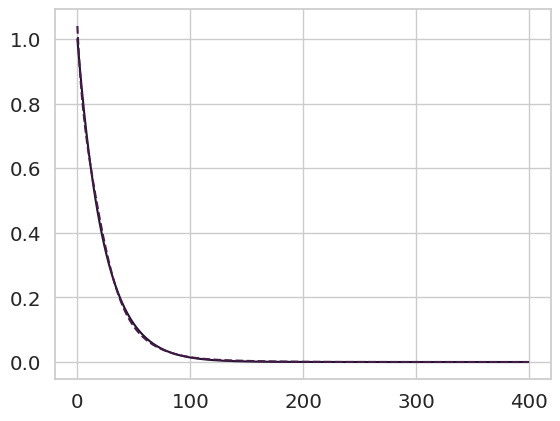

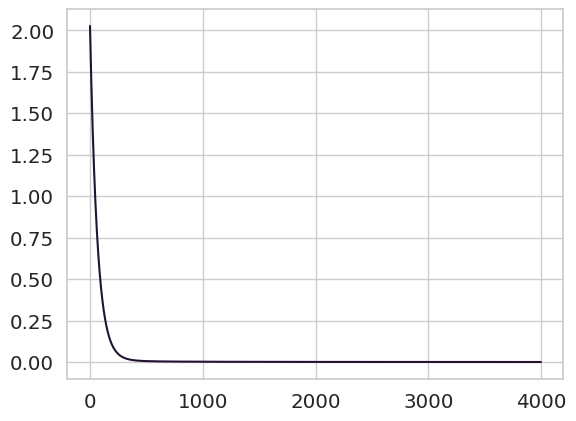

0.48999998
0.49000004
(200, 200)


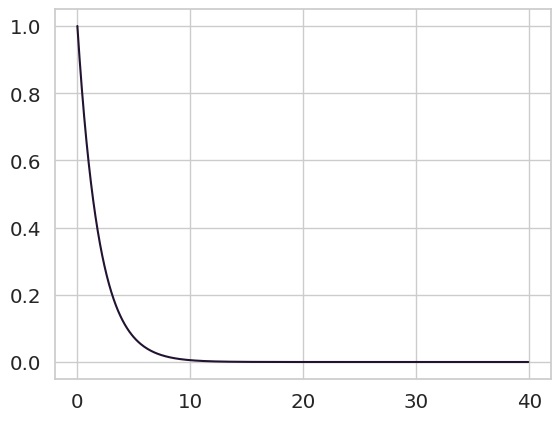

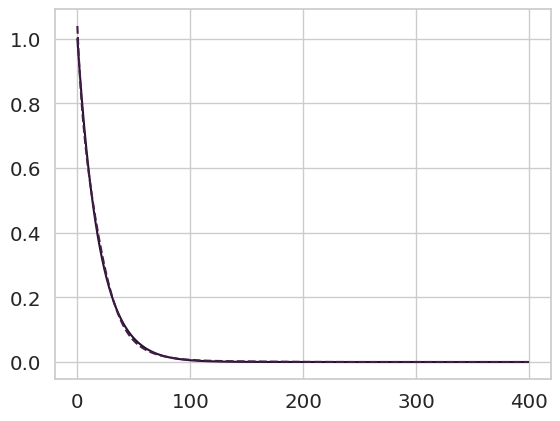

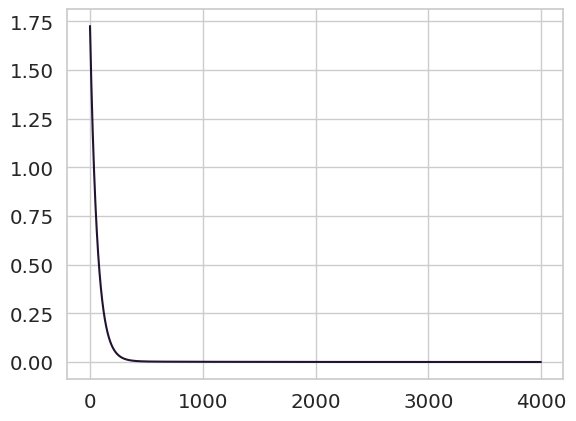

0.48999998
0.49000004
(200, 200)


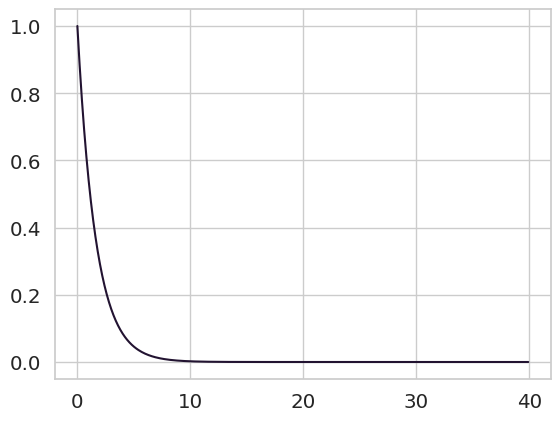

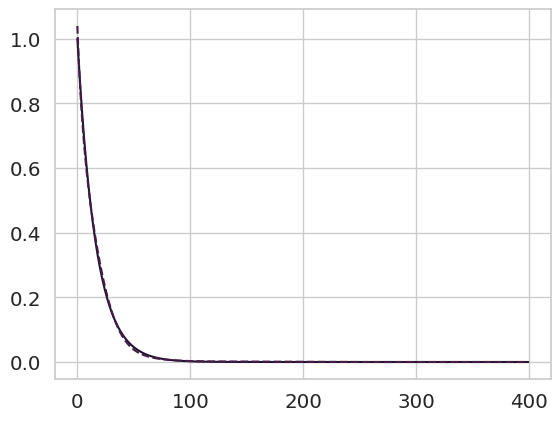

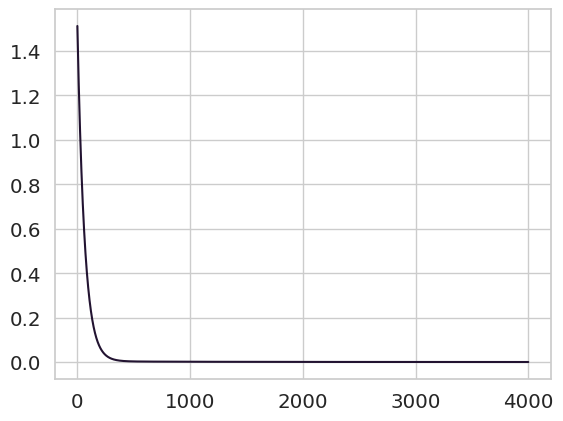

0.48999998
0.49000004
(200, 200)


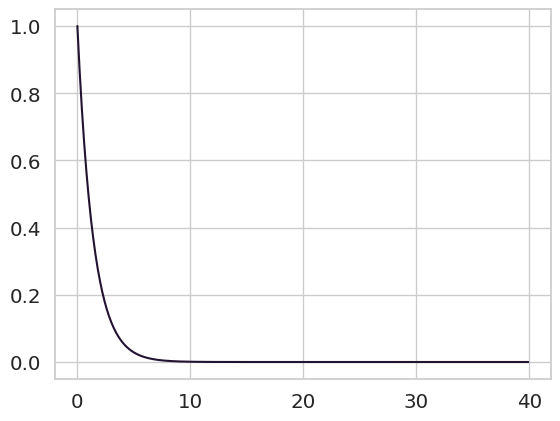

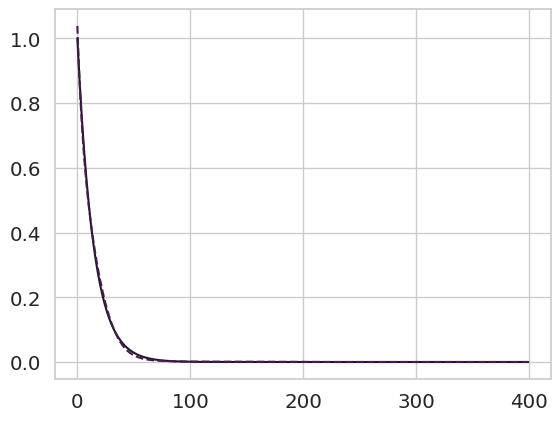

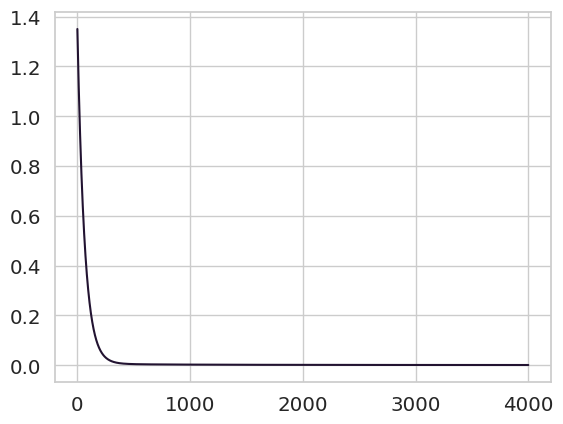

0.48999998
0.49000004
(200, 200)


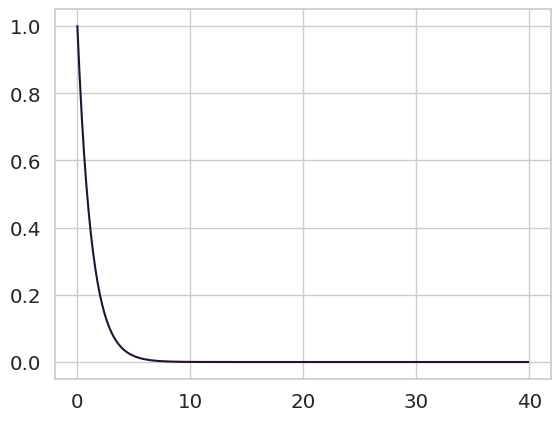

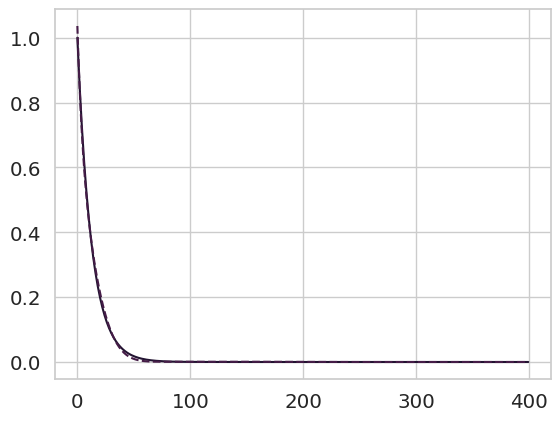

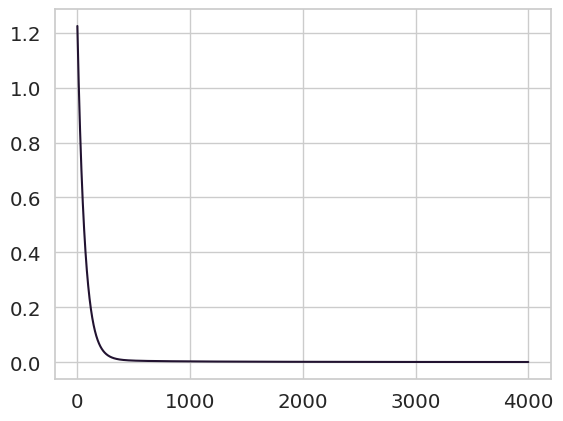

0.48999998
0.49000004
(200, 200)


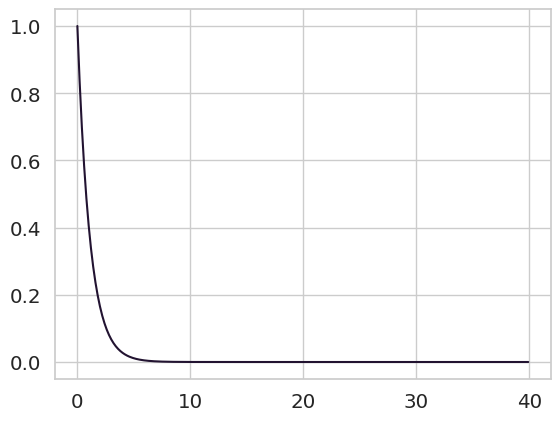

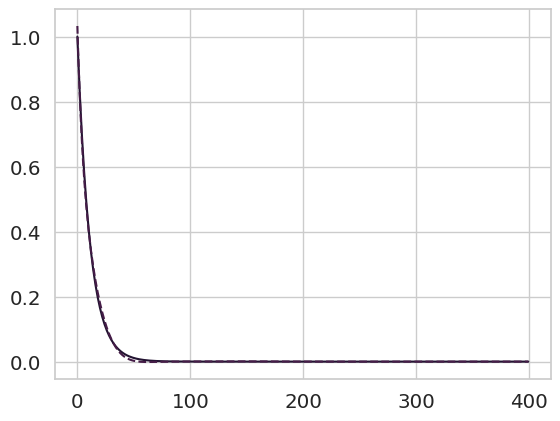

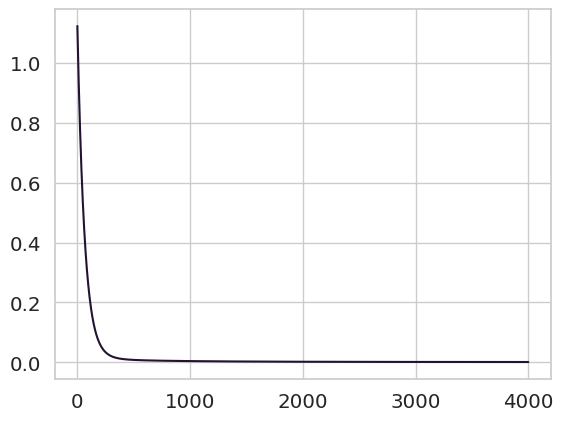

In [ ]:
N = 200

# define target function
#c_star = 0.3
#omega_star = 0.7
#target_exp = c_star + 1j * omega_star


sigma = 0.7
lr = 0.005

dt = 0.1
time_window = 400
train_step = 4000


c0 = 1.0
omega0 = 0.4
gamma = 0.05

lamb_init = 0.0+0.0*1j


all_c_star = jnp.linspace(0.05, 0.9, 10)
omega_star = 0.0


all_W_move = []
for i, c_star in enumerate(all_c_star):

  target_exp = c_star + 1j * omega_star
  W0 = sigma*random.normal(random.PRNGKey(2), (N,N))
  losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs, all_zu, all_u_top = train_model_complex_target_warmstart(target_exp, N, train_step, lamb_init, time_window,sigma=sigma, lr = lr, dt=dt, tied = False, gamma=gamma)
  all_W_move += [ jnp.mean( (W - W0)**2 ) ]
  plt.plot(losses)
  plt.show()

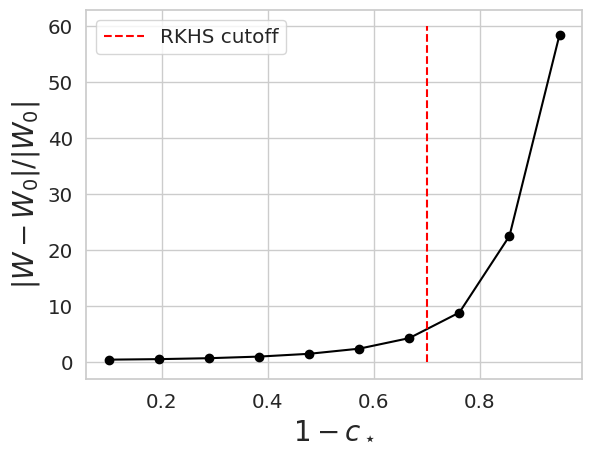

In [ ]:
plt.plot(1-jnp.array(all_c_star), jnp.array(all_W_move) / jnp.mean( sigma*random.normal(random.PRNGKey(2), (N,N)))**2, '-o', color = 'black')
plt.plot( sigma * jnp.ones(10) , jnp.linspace(0.0, 60.0,10), '--',color = 'red' , label = 'RKHS cutoff')
plt.ylabel(r'$|W-W_0| / |W_0|$',fontsize = 20)
plt.xlabel(r'$1- c_\star$', fontsize = 20)
plt.legend()
plt.savefig('vary_task_complexity_RKHS_cutoff.pdf',bbox_inches = 'tight')
plt.show()

0.062499993
0.0625
(200, 200)


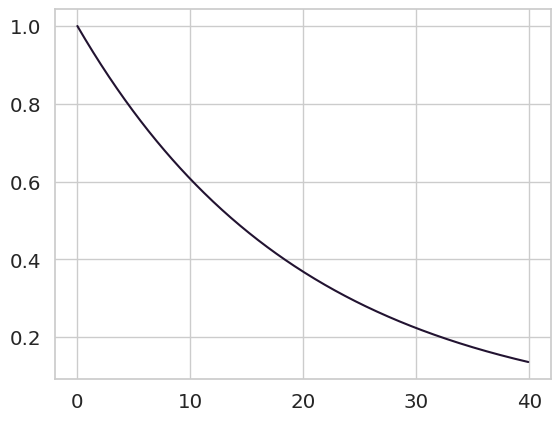

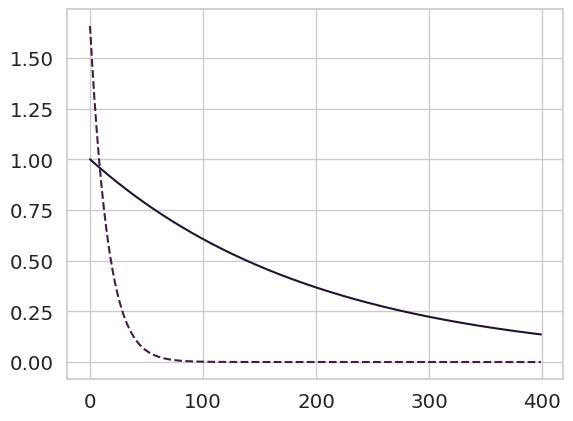

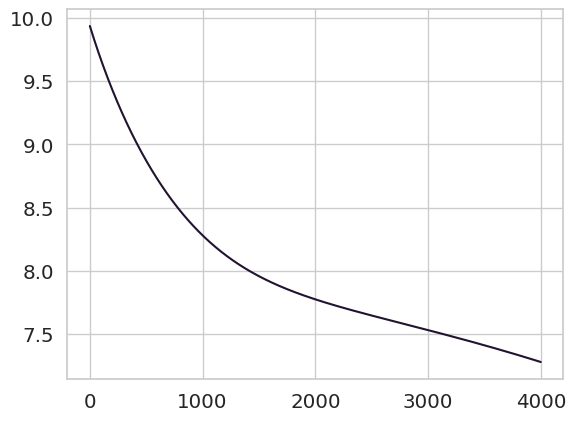

0.062499993
0.0625
(200, 200)


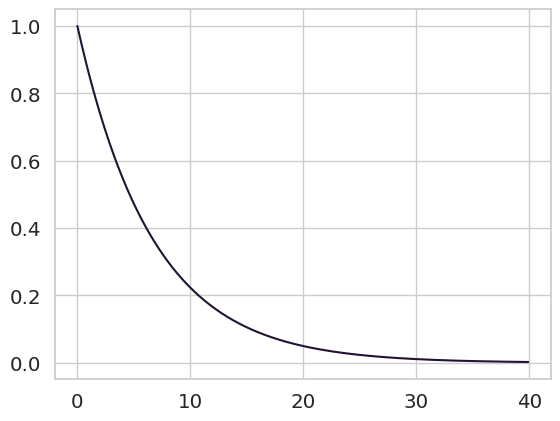

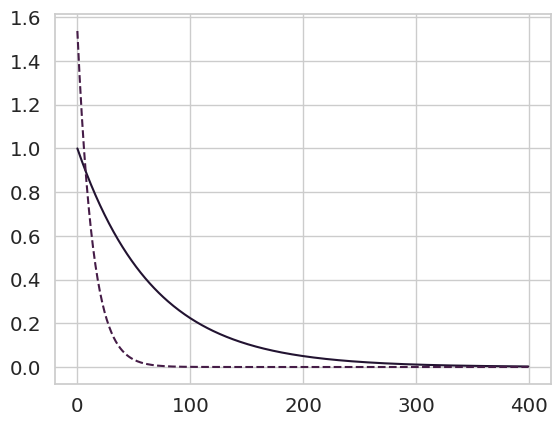

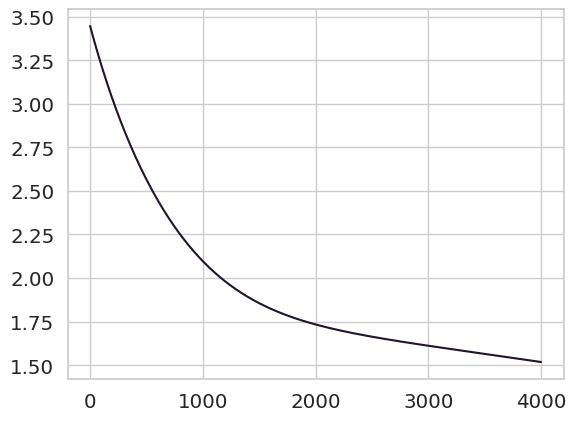

0.062499993
0.0625
(200, 200)


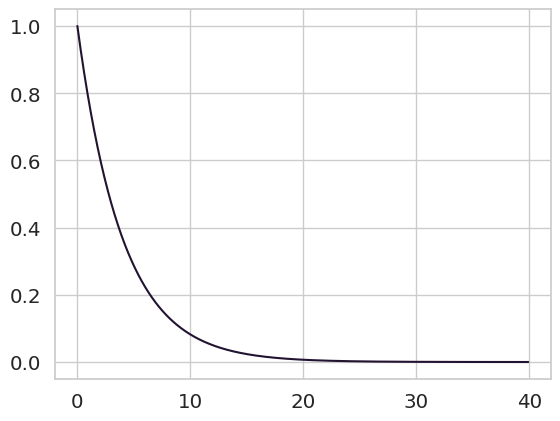

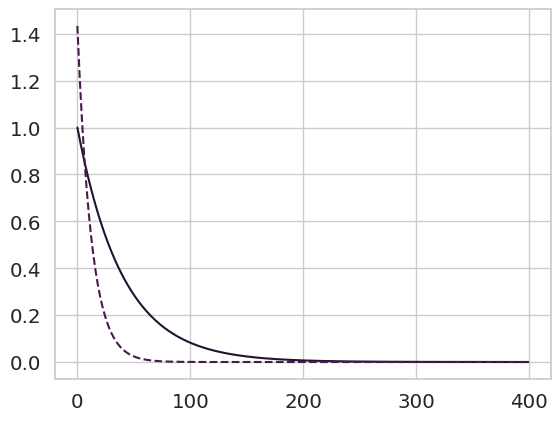

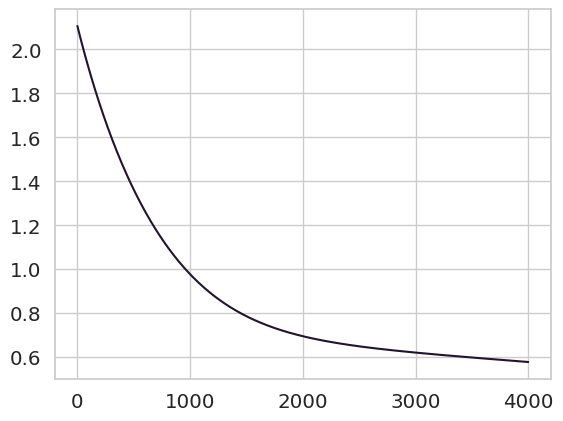

0.062499993
0.0625
(200, 200)


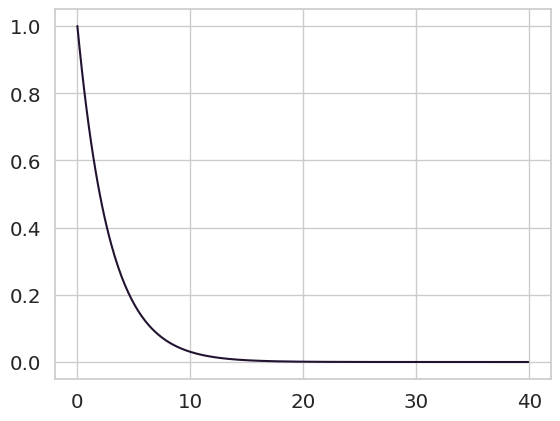

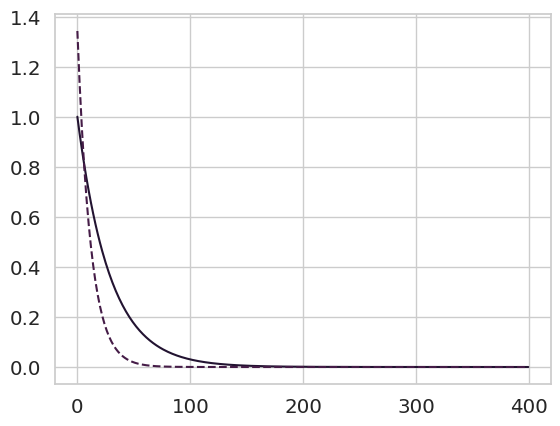

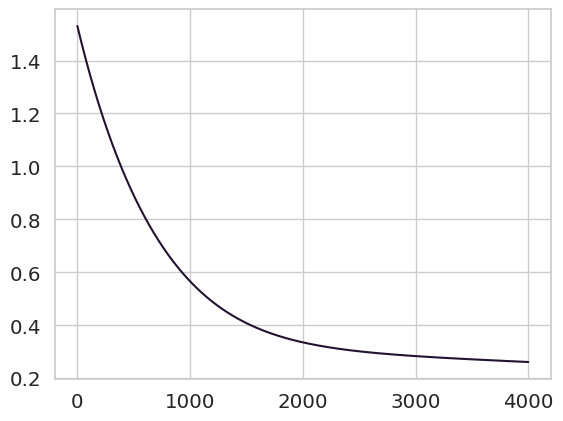

0.062499993
0.0625
(200, 200)


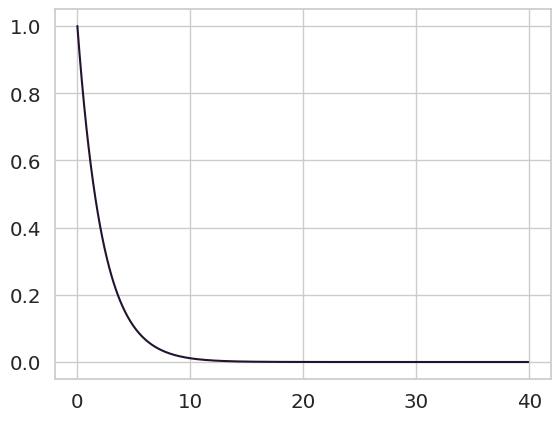

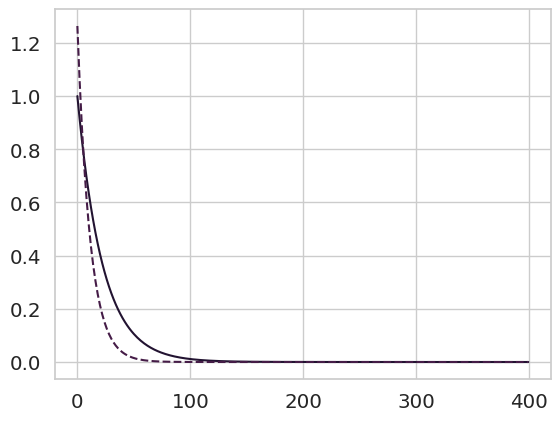

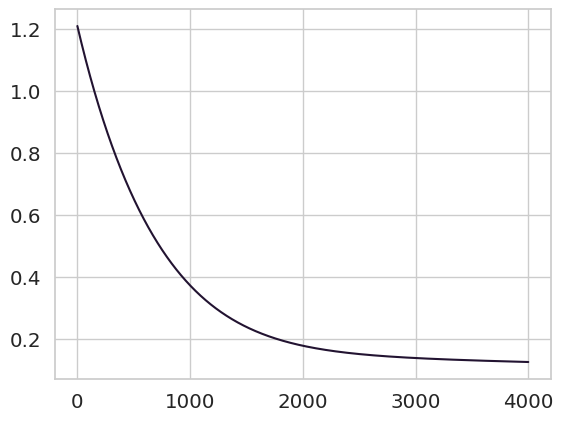

0.062499993
0.0625
(200, 200)


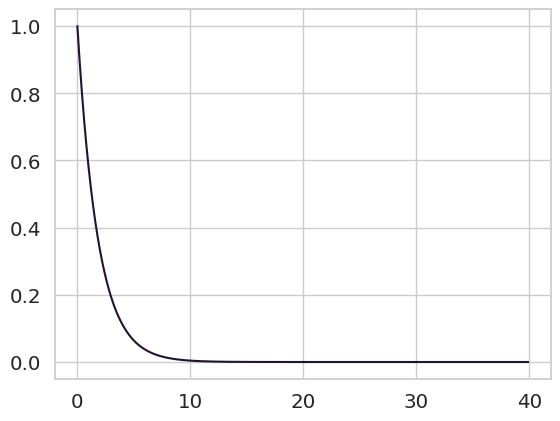

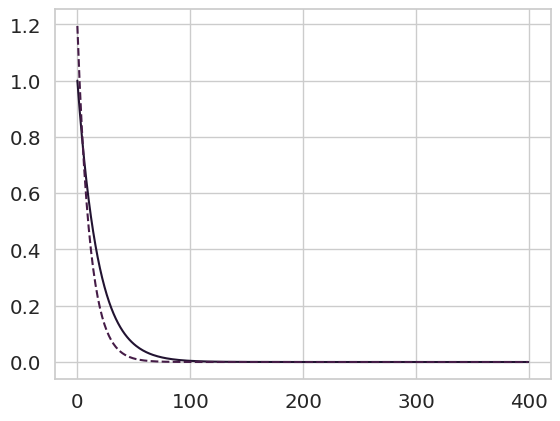

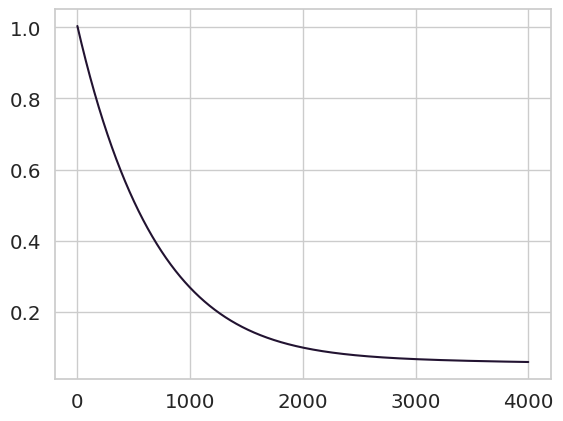

0.062499993
0.0625
(200, 200)


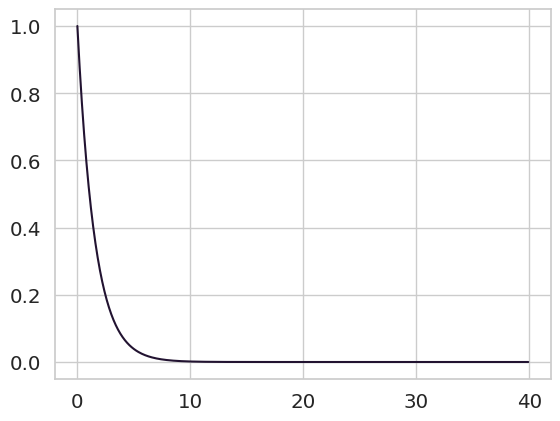

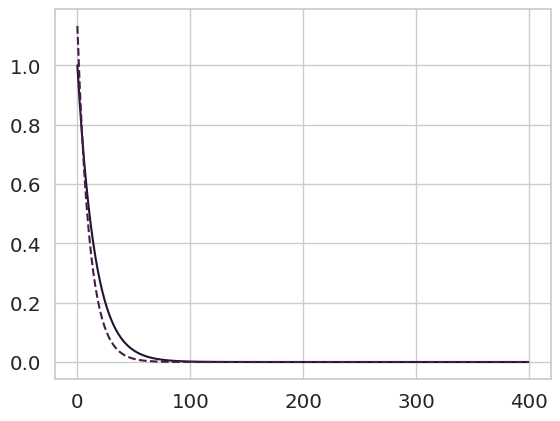

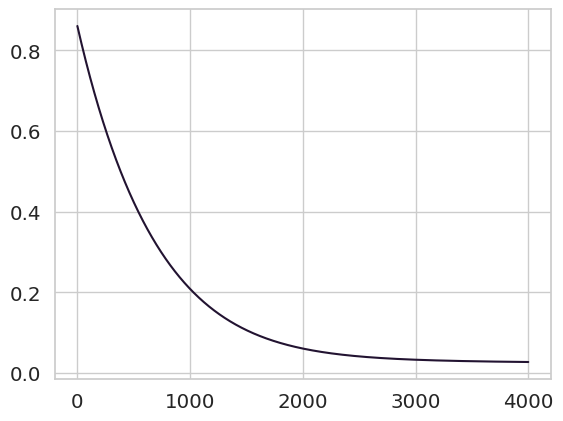

0.062499993
0.0625
(200, 200)


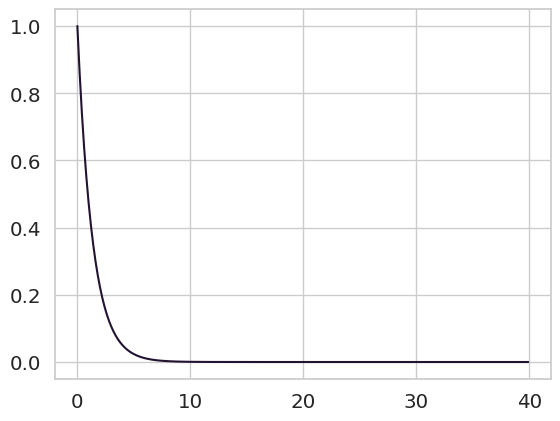

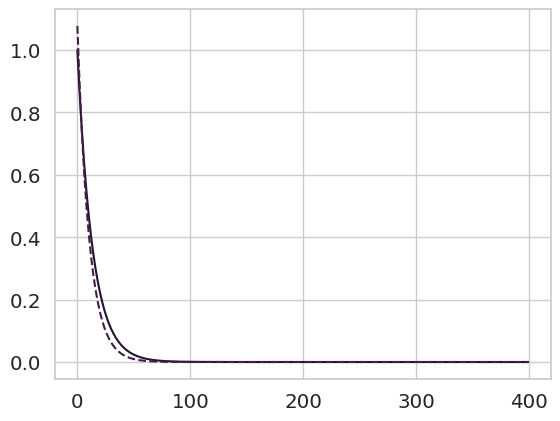

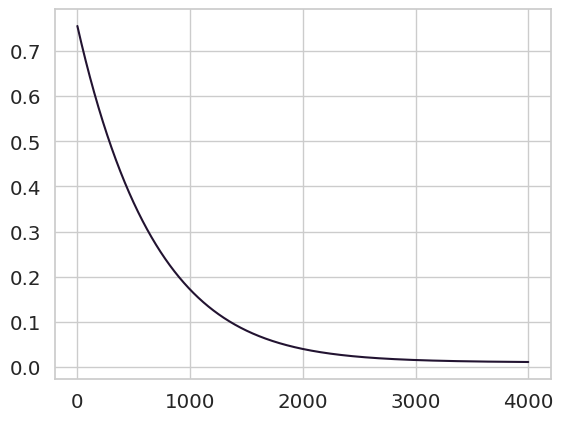

0.062499993
0.0625
(200, 200)


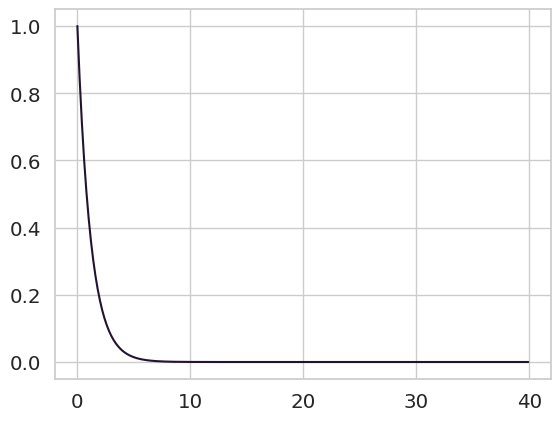

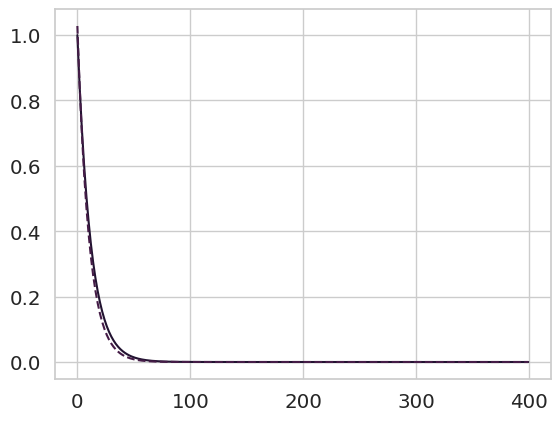

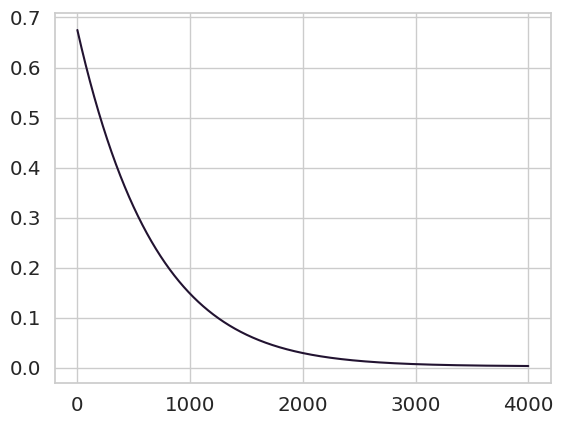

0.062499993
0.0625
(200, 200)


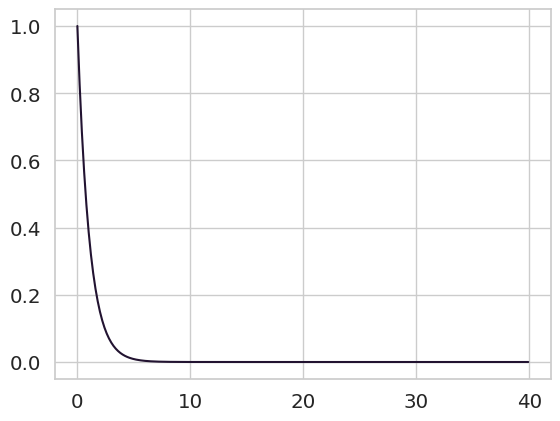

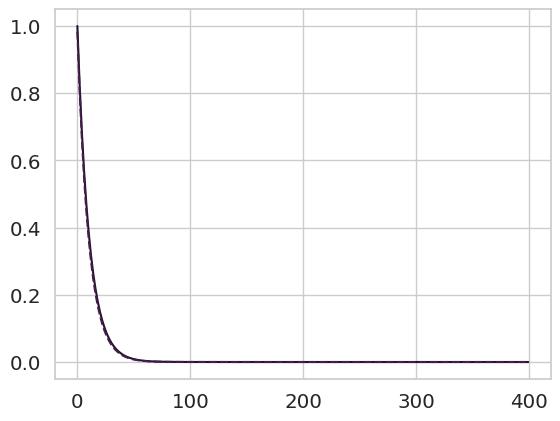

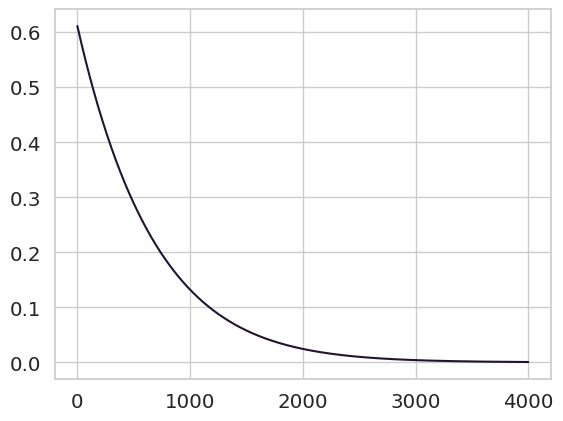

0.24999997
0.25
(200, 200)


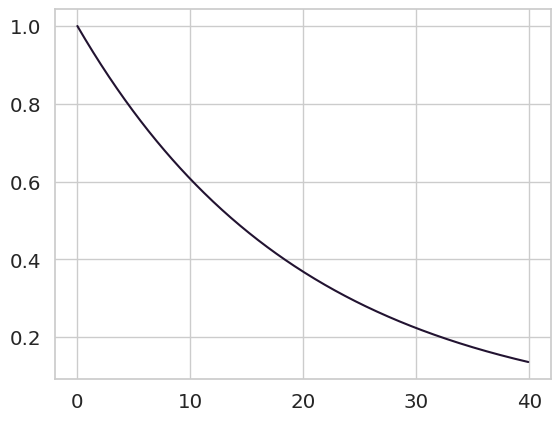

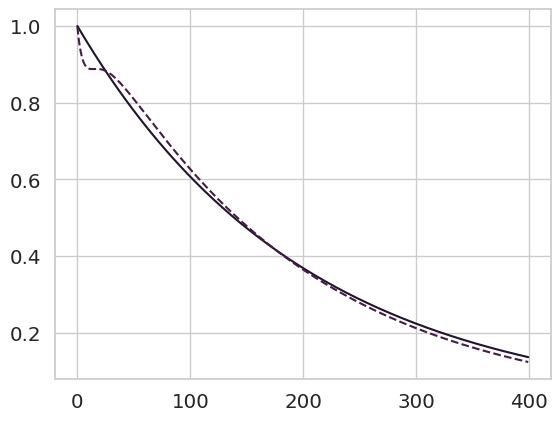

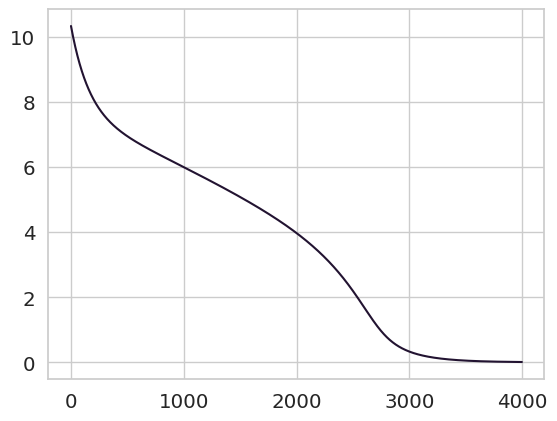

0.24999997
0.25
(200, 200)


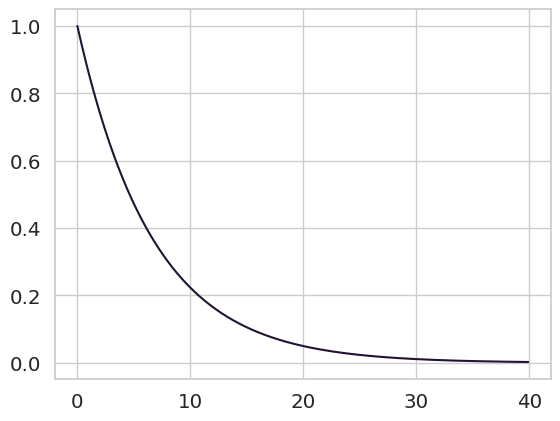

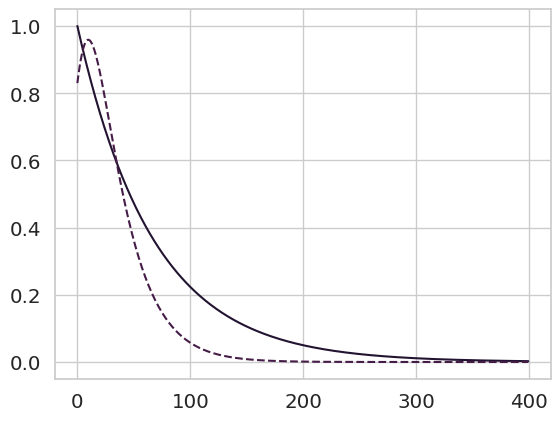

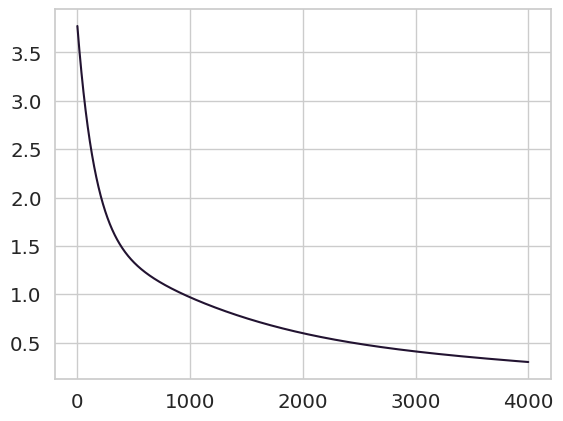

0.24999997
0.25
(200, 200)


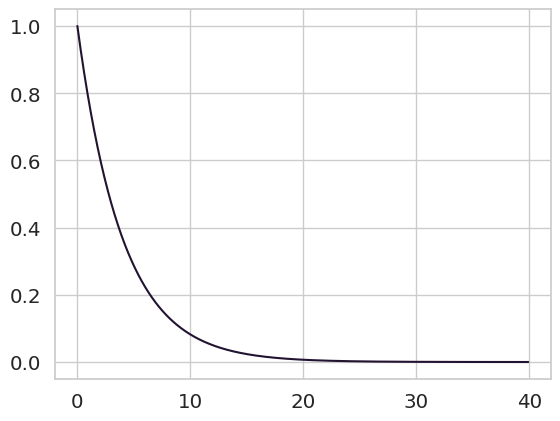

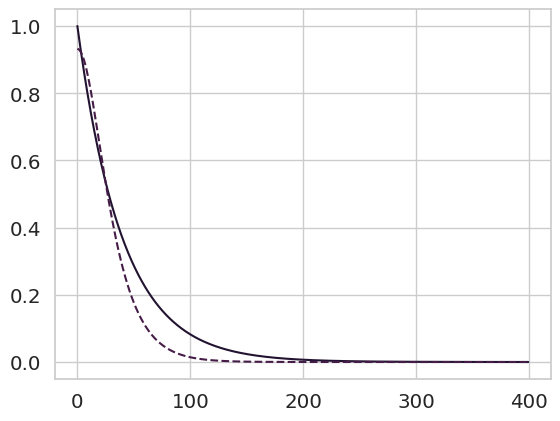

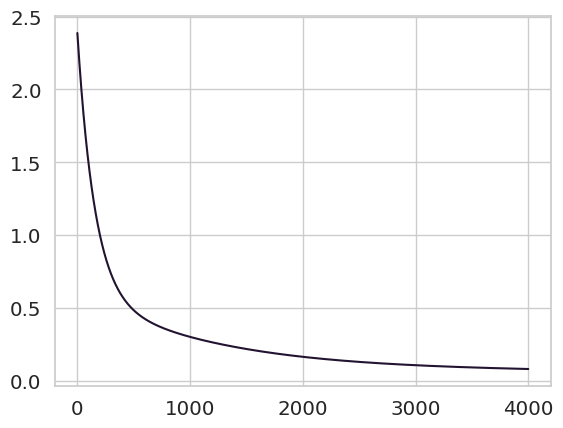

0.24999997
0.25
(200, 200)


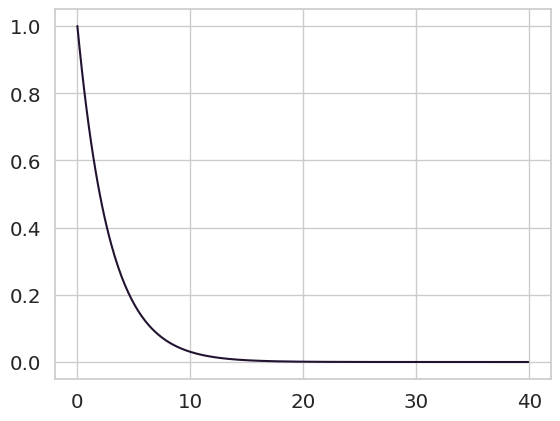

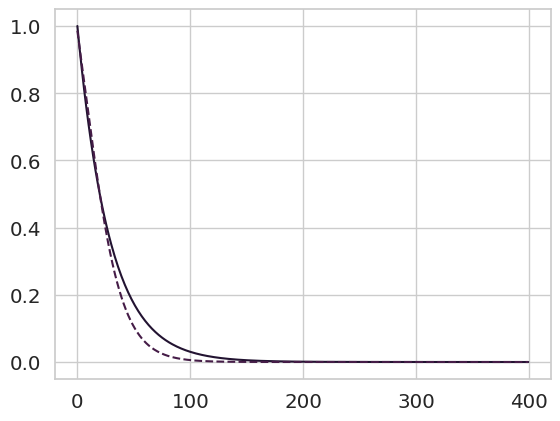

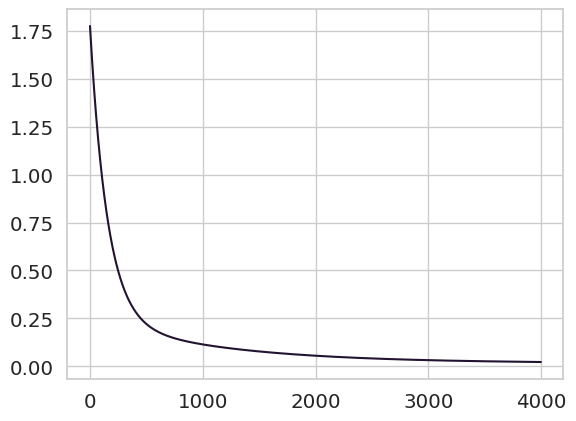

0.24999997
0.25
(200, 200)


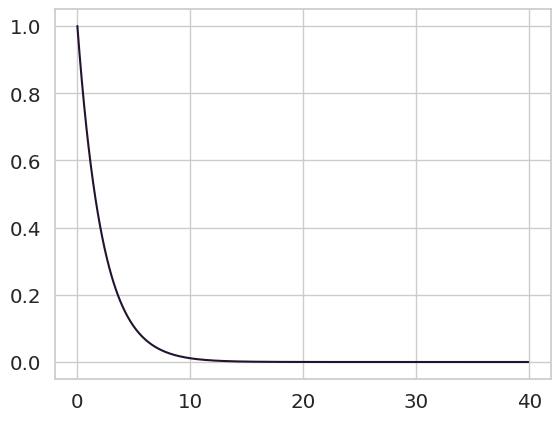

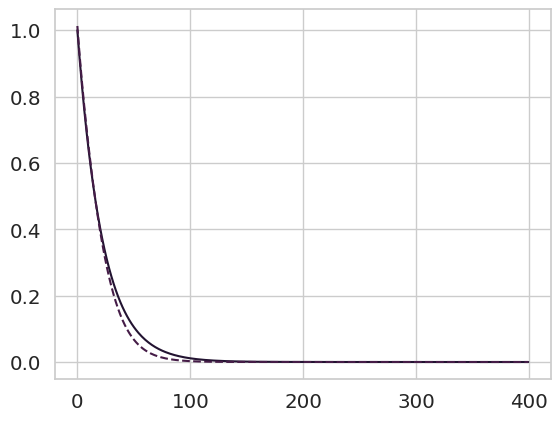

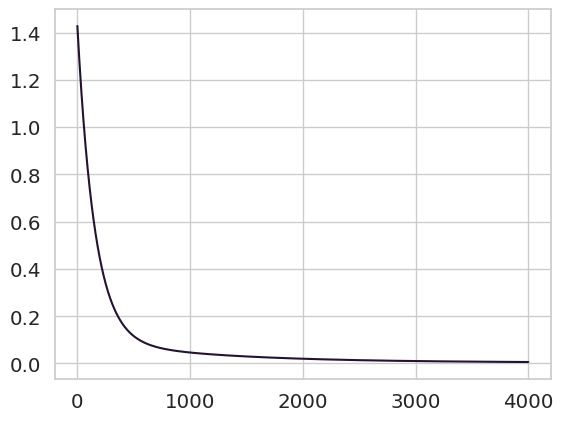

0.24999997
0.25
(200, 200)


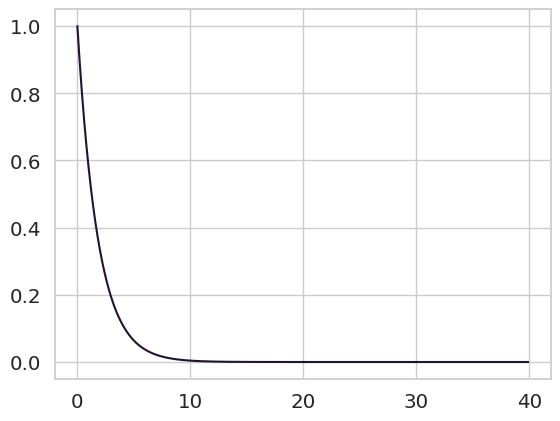

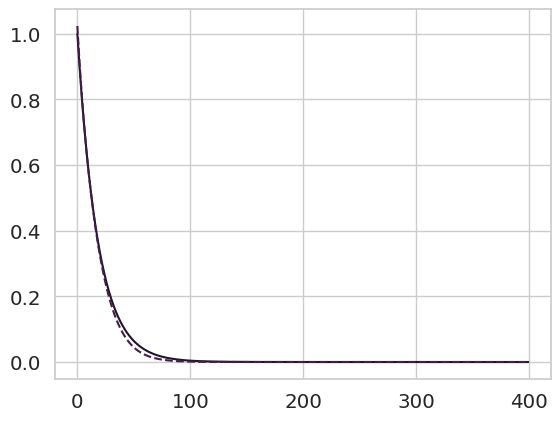

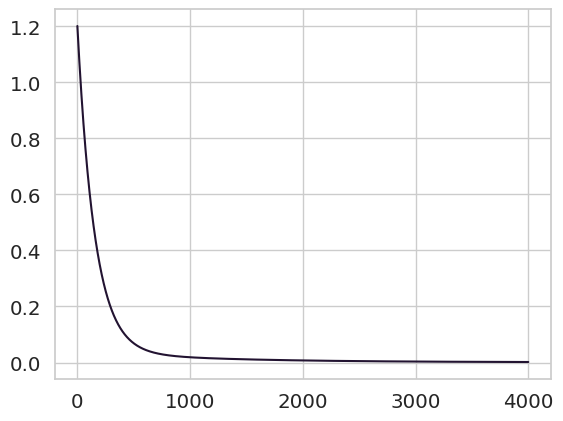

0.24999997
0.25
(200, 200)


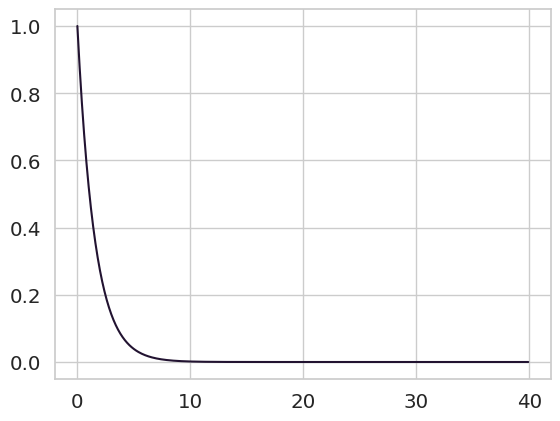

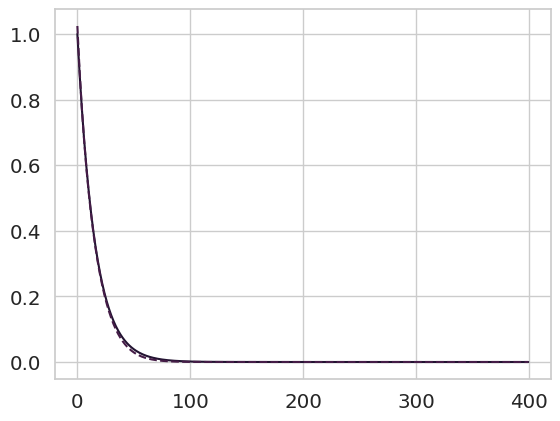

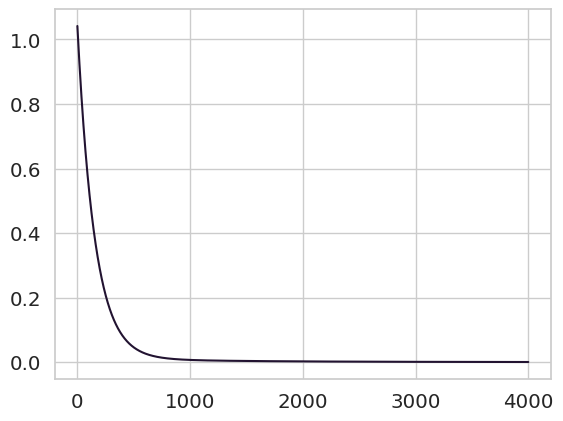

0.24999997
0.25
(200, 200)


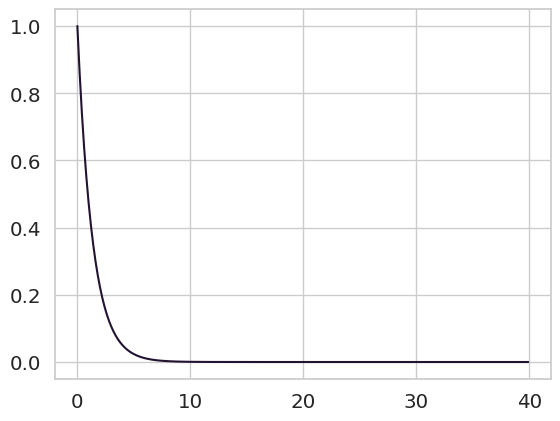

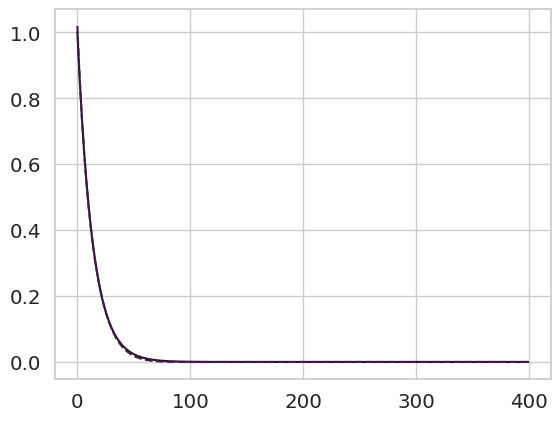

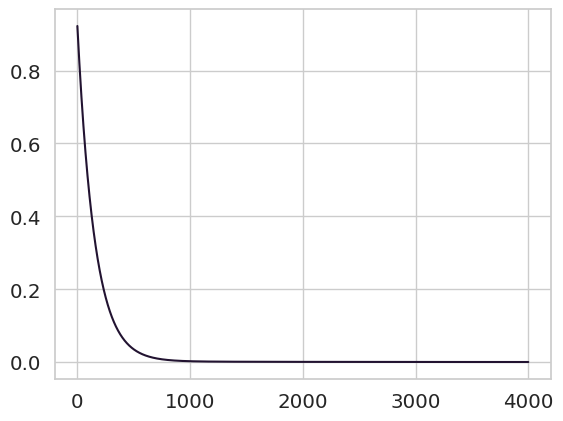

0.24999997
0.25
(200, 200)


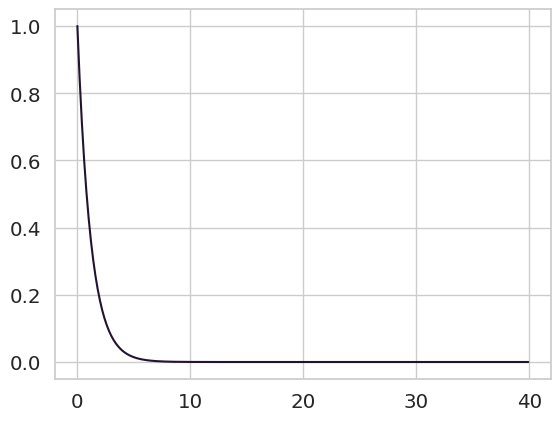

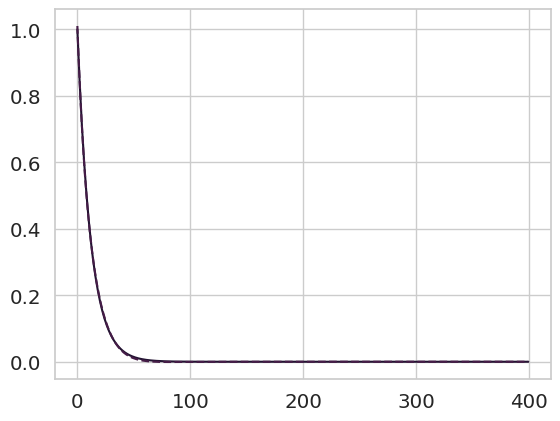

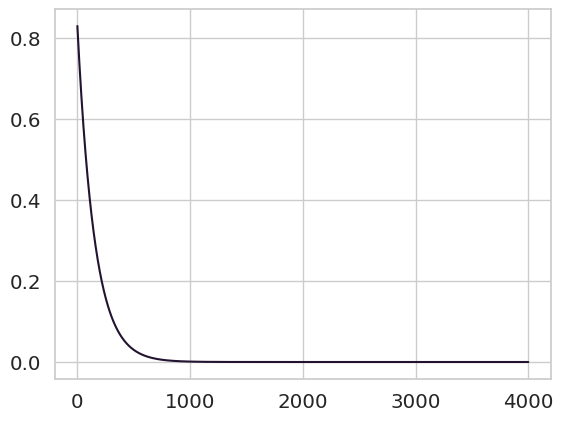

0.24999997
0.25
(200, 200)


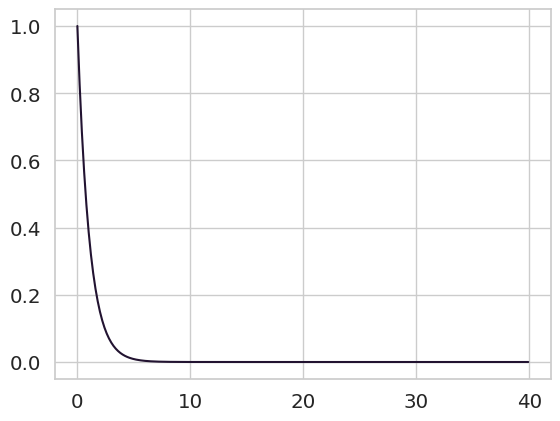

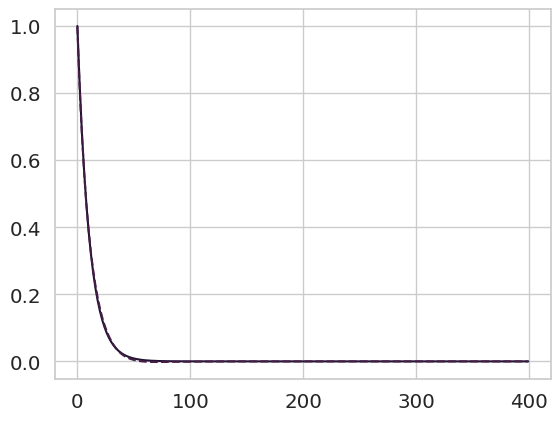

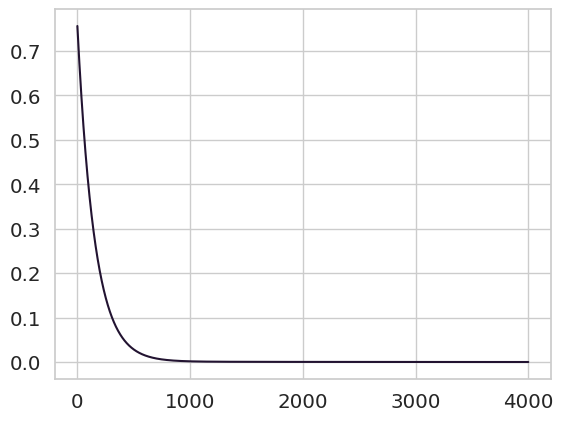

0.56250006
0.56250006
(200, 200)


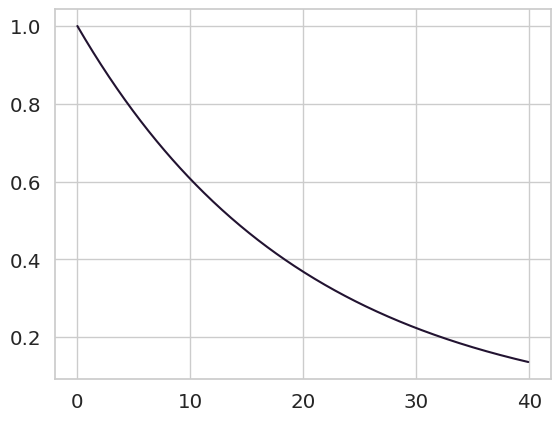

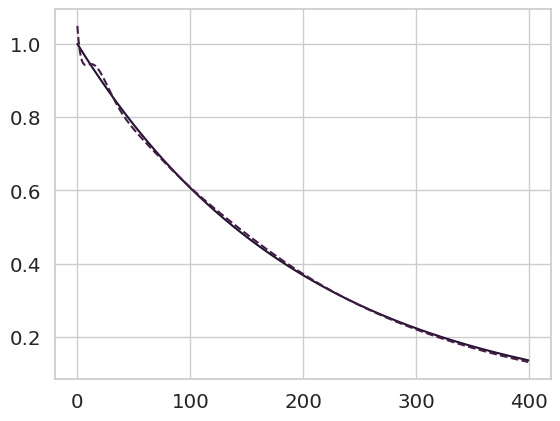

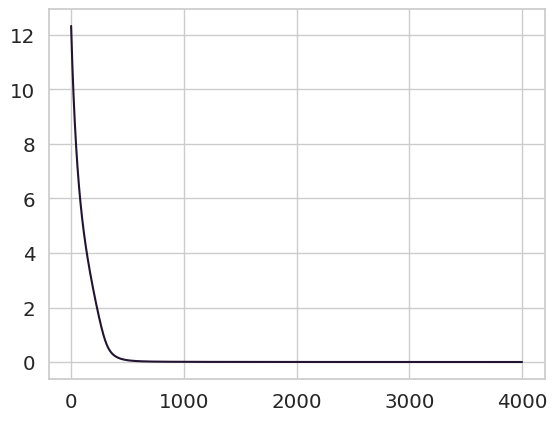

0.56250006
0.56250006
(200, 200)


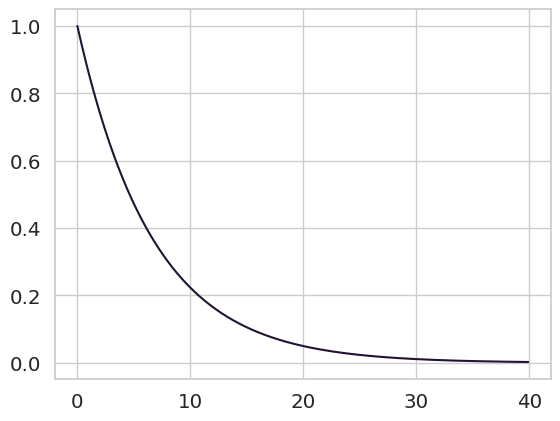

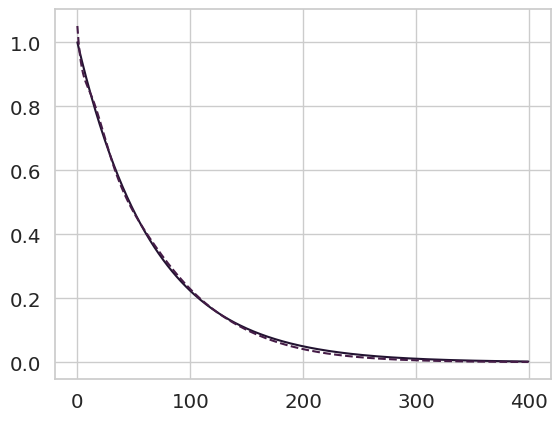

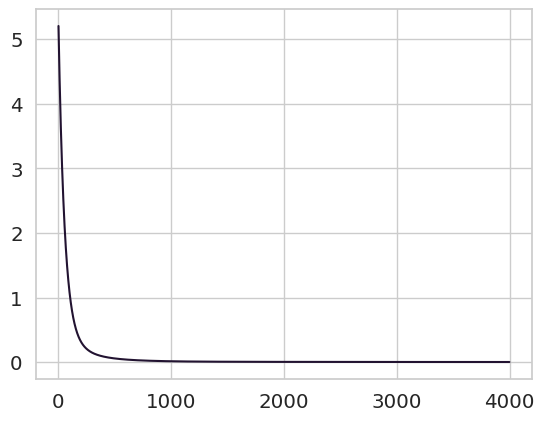

0.56250006
0.56250006
(200, 200)


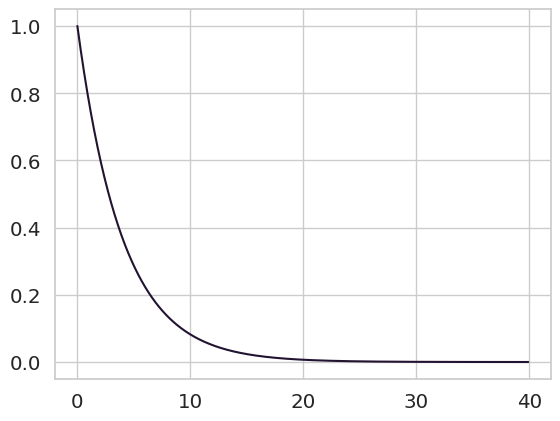

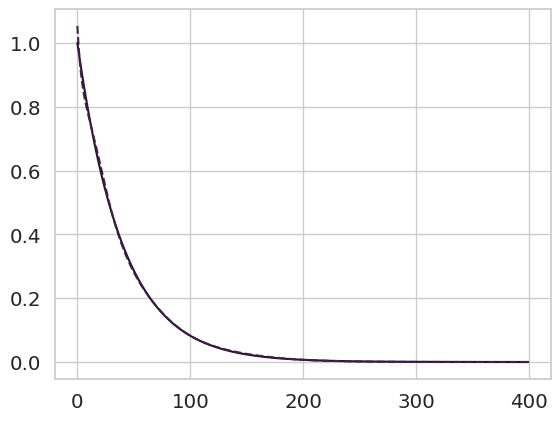

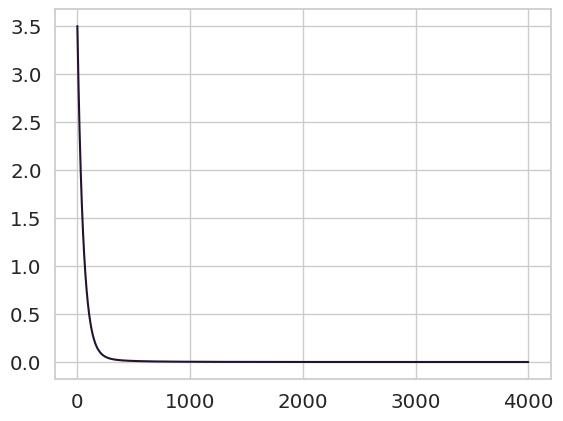

0.56250006
0.56250006
(200, 200)


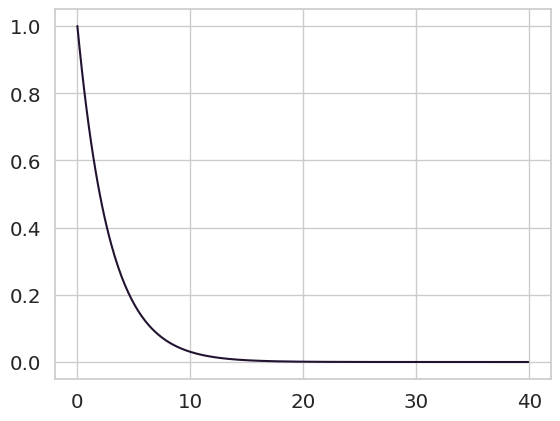

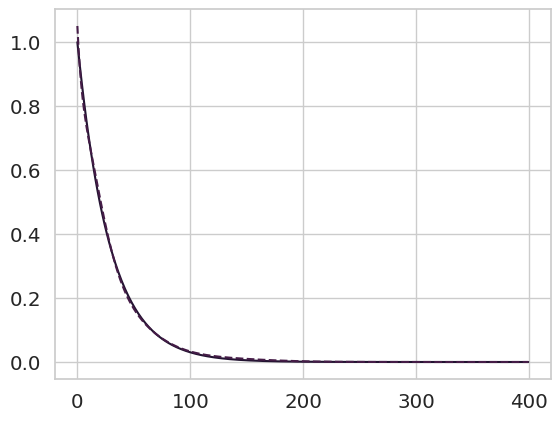

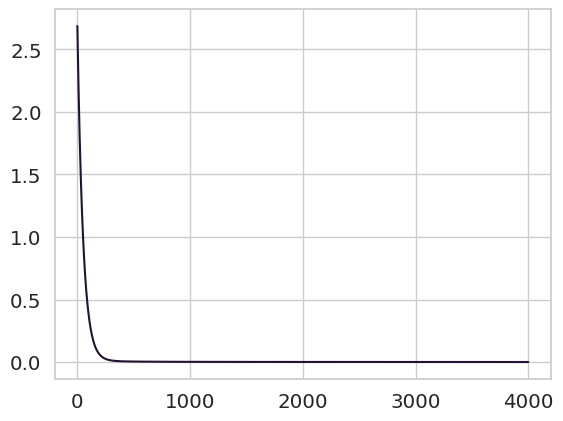

0.56250006
0.56250006
(200, 200)


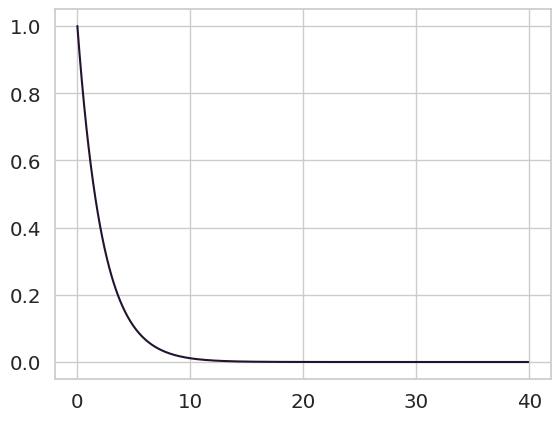

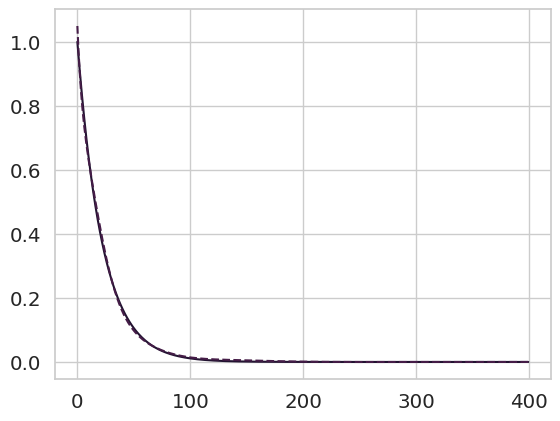

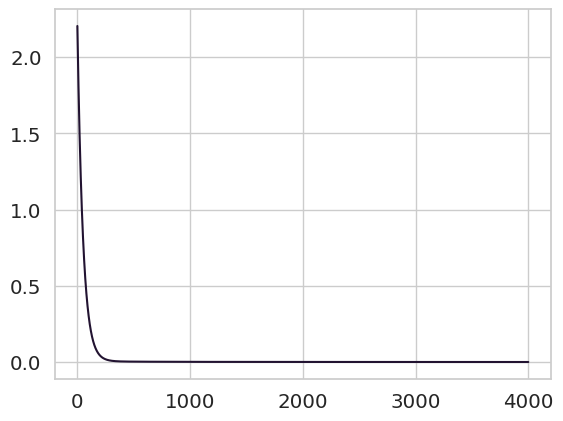

0.56250006
0.56250006
(200, 200)


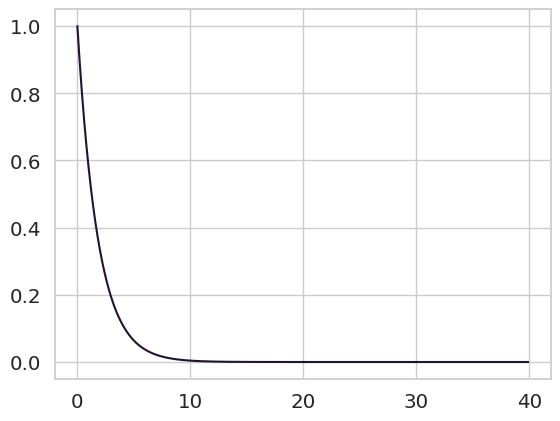

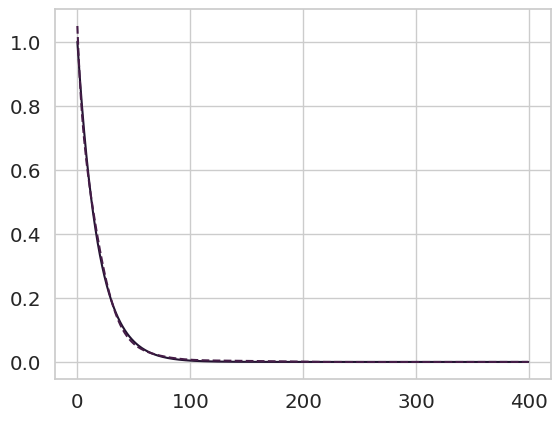

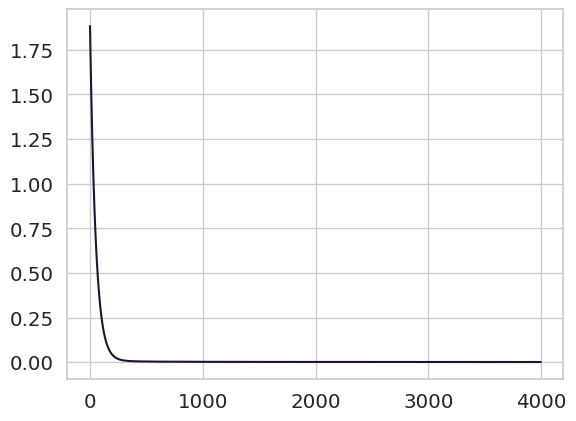

0.56250006
0.56250006
(200, 200)


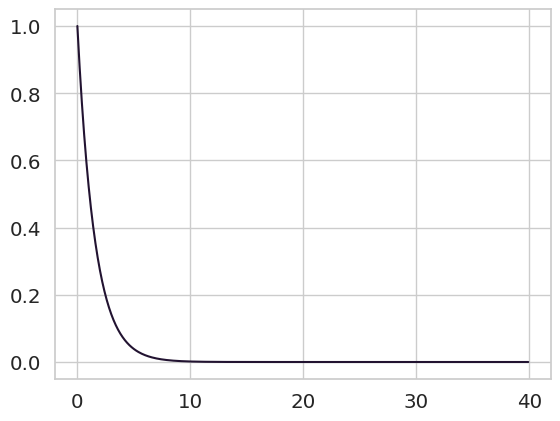

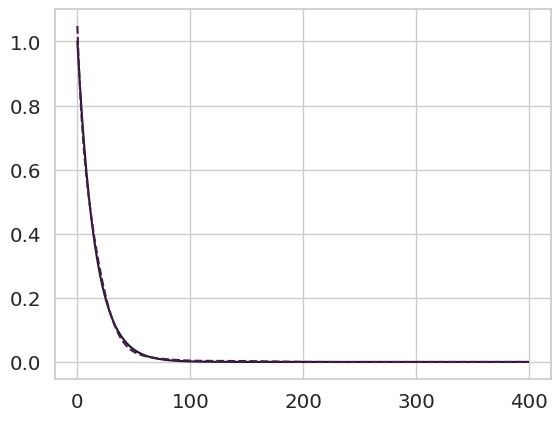

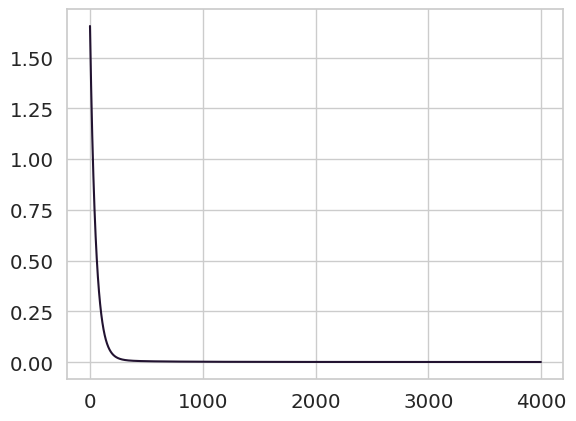

0.56250006
0.56250006
(200, 200)


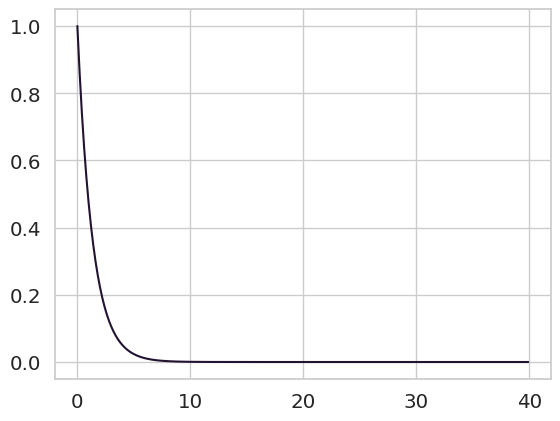

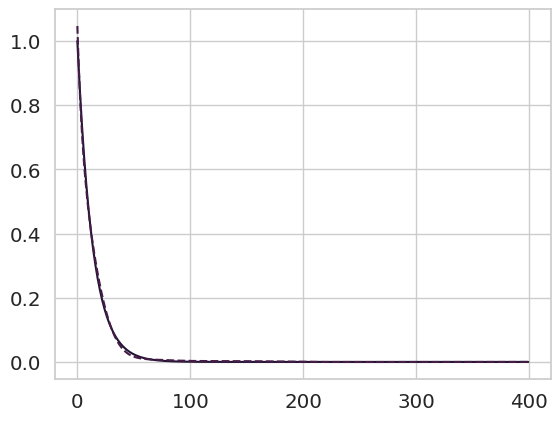

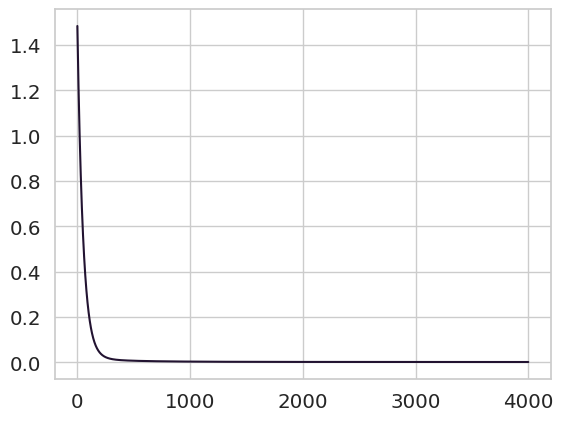

0.56250006
0.56250006
(200, 200)


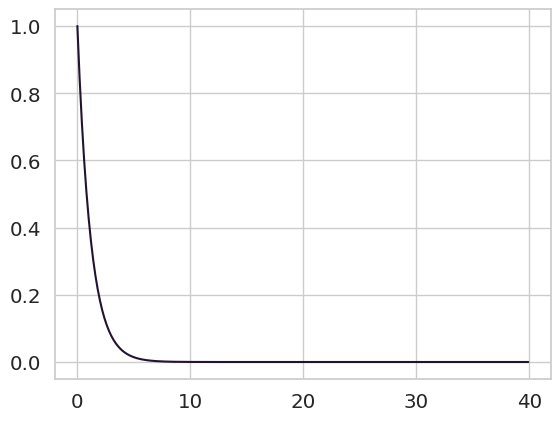

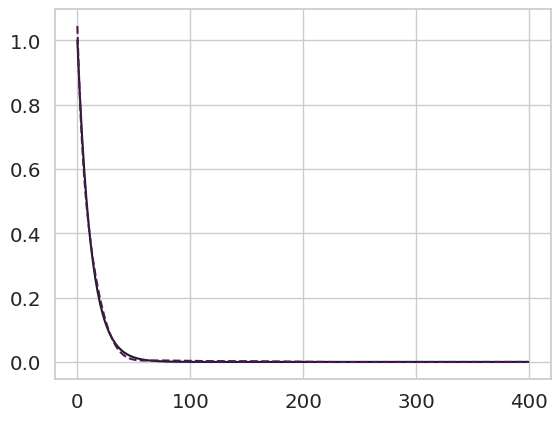

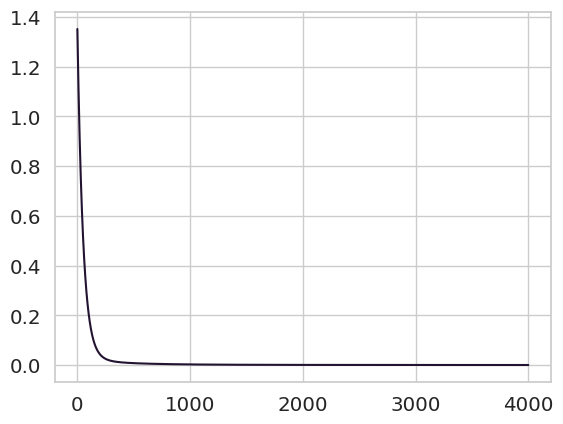

0.56250006
0.56250006
(200, 200)


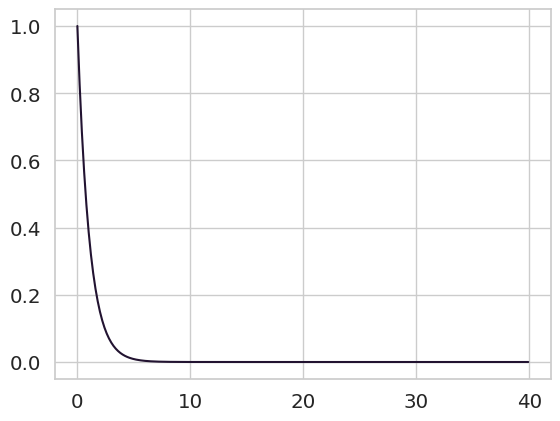

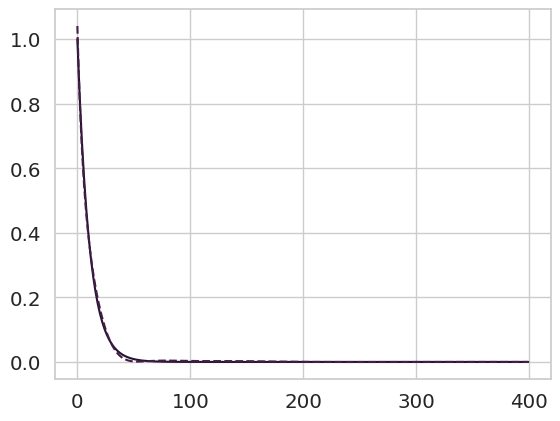

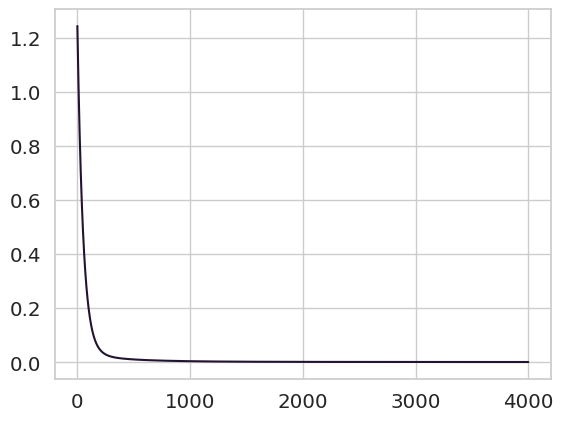

In [ ]:
N = 200

# define target function
#c_star = 0.3
#omega_star = 0.7
#target_exp = c_star + 1j * omega_star


sigma = 0.7
lr = 0.005

dt = 0.1
time_window = 400
train_step = 4000


c0 = 1.0
omega0 = 0.4
gamma = 0.05

lamb_init = 0.0+0.0*1j


all_c_star = jnp.linspace(0.05, 0.95, 10)
omega_star = 0.0

all_sigma = [ 0.25, 0.5, 0.75 ]

all_all_W_move = []

for j, sigma in enumerate(all_sigma):

  all_W_move = []


  for i, c_star in enumerate(all_c_star):

    target_exp = c_star + 1j * omega_star
    W0 = sigma*random.normal(random.PRNGKey(2), (N,N))
    losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs, all_zu, all_u_top = train_model_complex_target_warmstart(target_exp, N, train_step, lamb_init, time_window,sigma=sigma, lr = lr, dt=dt, tied = False, gamma=gamma)
    all_W_move += [ jnp.mean( (W - W0)**2 ) ]
    plt.plot(losses)
    plt.show()

  all_all_W_move += [all_W_move]

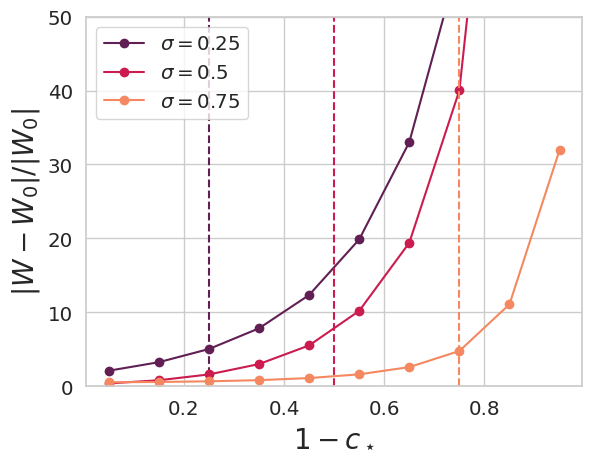

In [ ]:
sns.set_palette("rocket", n_colors=3)
for i, sigma in enumerate(all_sigma):
  plt.plot(1-jnp.array(all_c_star), jnp.array(all_all_W_move[i]) / jnp.mean( sigma*random.normal(random.PRNGKey(2), (N,N)))**2, '-o', color = f'C{i}', label = f'$\sigma = {sigma}$')
  plt.plot( sigma * jnp.ones(10) , jnp.linspace(0.0, 100.0,10), '--',color = f'C{i}')
plt.ylabel(r'$|W-W_0| / |W_0|$',fontsize = 20)
plt.xlabel(r'$1- c_\star$', fontsize = 20)
plt.ylim([0,50])
plt.legend()
plt.savefig('vary_task_complexity_RKHS_cutoff_many_sigma.pdf',bbox_inches = 'tight')
plt.show()

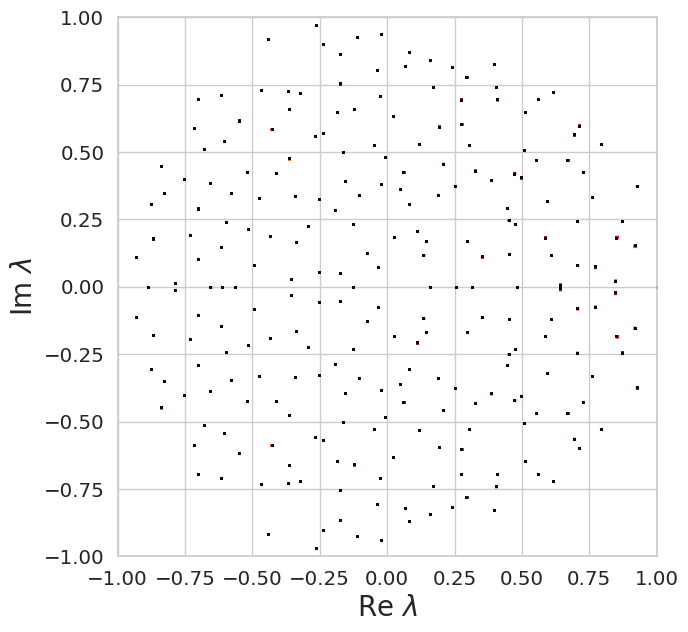

In [ ]:
times = jnp.arange(60, 250, 2)
sns.set_palette("rocket_r", n_colors=len(times))
plt.figure(figsize = (7,7))
for t in times:
    plt.scatter(all_eigs[t].real, all_eigs[t].imag, s = 1.0)

plt.xlim([-1,1])
plt.ylim([-1,1])
plt.xlabel(r'Re $\lambda$',fontsize = 20)
plt.ylabel(r'Im $\lambda$',fontsize = 20)
plt.gca().set_aspect('equal')

plt.show()

## Large Initialization

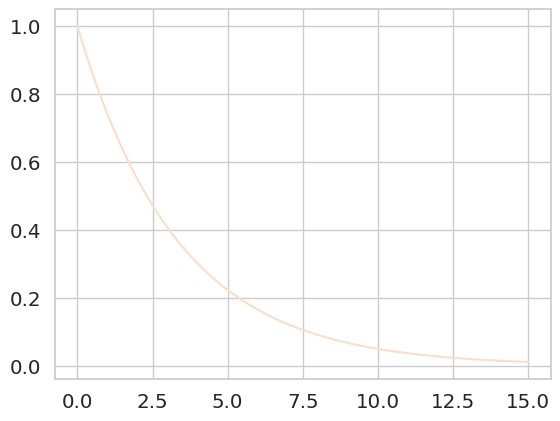

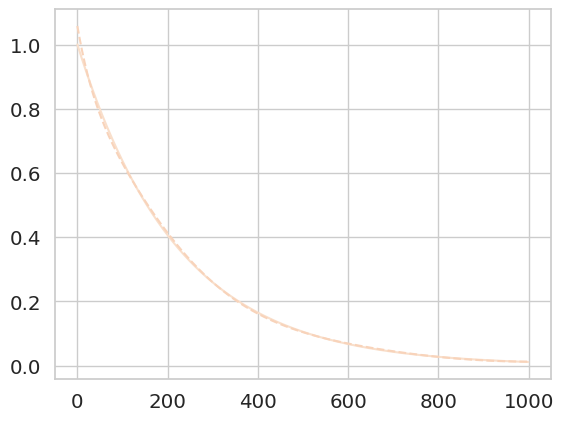

In [ ]:
N = 100
target_exp = 0.3

sigma = 0.985
lr = 0.0025
time_window = 1000
train_step = 2000

losses,aligns, W_aligns, W, u_norm, c_scale = train_model( target_exp , N, train_step = train_step, time_window = time_window, sigma = sigma, lr = lr, dt = 0.015, tied= True)

<Figure size 800x800 with 0 Axes>

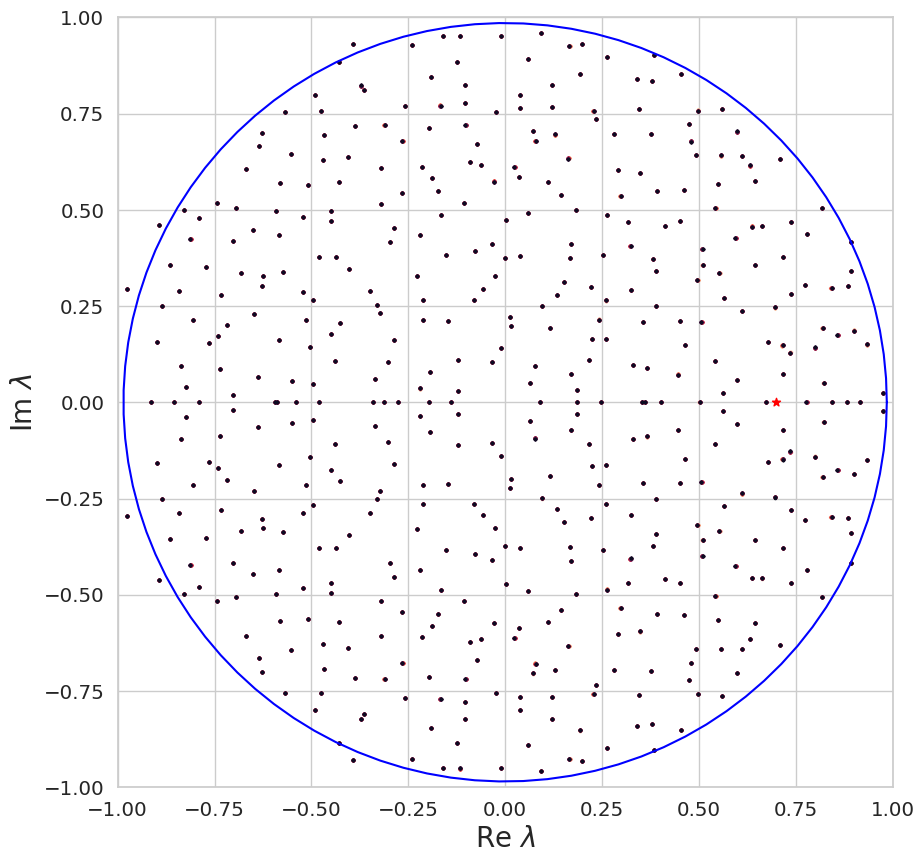

In [ ]:
plt.figure(figsize = (8,8))
times = jnp.arange(60, 120, 2)
sns.set_palette("rocket_r", n_colors=len(times))

plt.figure(figsize = (10,10))
#f, (a0, a1) = plt.subplots(2, 1, height_ratios=[4, 1.25])
for t in times:
  #for t, eig in enumerate(all_eigs):
  plt.scatter(all_eigs[t].real, all_eigs[t].imag, s = 2.5)

theta_vals = jnp.linspace(0, 2*jnp.pi, 100)
plt.plot(sigma * jnp.cos(theta_vals), sigma * jnp.sin(theta_vals), color = 'blue', label = r'$x^2 + y^2 = \sigma^2$')
#plt.aspect('equal')
plt.scatter( [1-target_exp], [0.0 ], marker = '*', color = 'red')

plt.xlim([-1.0, 1.0])
plt.ylim([-1.0, 1.0])
plt.xlabel(r'Re $\lambda$',fontsize = 20)
#plt.xticks([])

plt.ylabel(r'Im $\lambda$', fontsize = 20)
#plt.tight_layout()

#a1.semilogy(jnp.array(c_scale), jnp.linspace(1,len(c_scale),len(c_scale)), color = 'C6')
#a1.semilogy(1- jnp.array(cs),  jnp.linspace(1,len(cs),len(cs)), '--', color = 'black',label = 'theory')
#a1.semilogy(jnp.array(c_scale), jnp.linspace(1,len(c_scale),len(c_scale)), label = r'$c(s)$')
#a1.semilogy(1- jnp.array(cs),  jnp.linspace(1,len(cs),len(cs)), '--', color = 'black',label = 'theory')
#a1.set_xlabel(r'$c(s)$',fontsize = 20)
#a1.set_xlim([-0.3, 1.0])
#a1.set_ylabel(r'$s$', fontsize = 20)
#a1.legend()
#plt.tight_layout()
#plt.legend()
plt.savefig('eigenvalue_dynamics_lazy_real_target_complex_plane_no_outlier.pdf', bbox_inches= 'tight')
plt.show()

In [ ]:
import jax.numpy as jnp
import matplotlib.pyplot as plt

0.9702249
0.97022504
(500, 500)


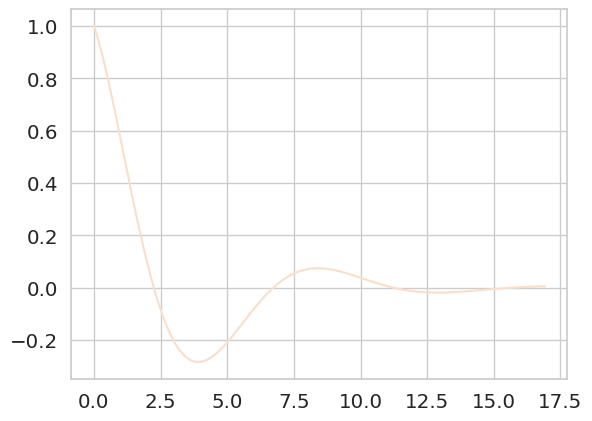

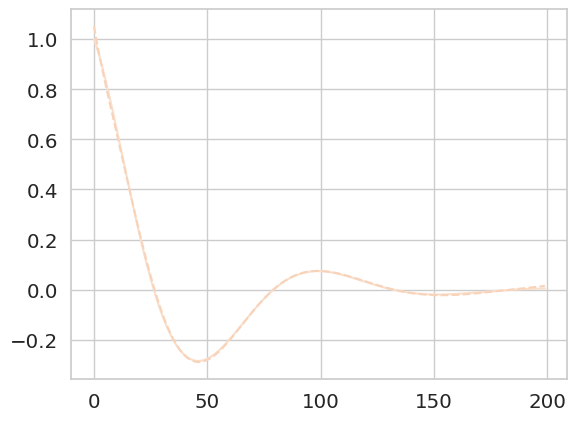

In [ ]:
N = 500

# define target function
c_star = 0.3
omega_star = 0.7
target_exp = c_star + 1j * omega_star



sigma = 0.985
lr = 0.005

dt = 0.085
time_window = 200
train_step = 2500


c0 = 1.0
omega0 = 0.4
gamma = 0.1

lamb_init = 0.0+0.0*1j

losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs, all_zu, all_u_top = train_model_complex_target_warmstart(target_exp, N, train_step, lamb_init, time_window,sigma=sigma, lr = lr, dt=dt, tied = False, gamma=gamma)

<Figure size 800x800 with 0 Axes>

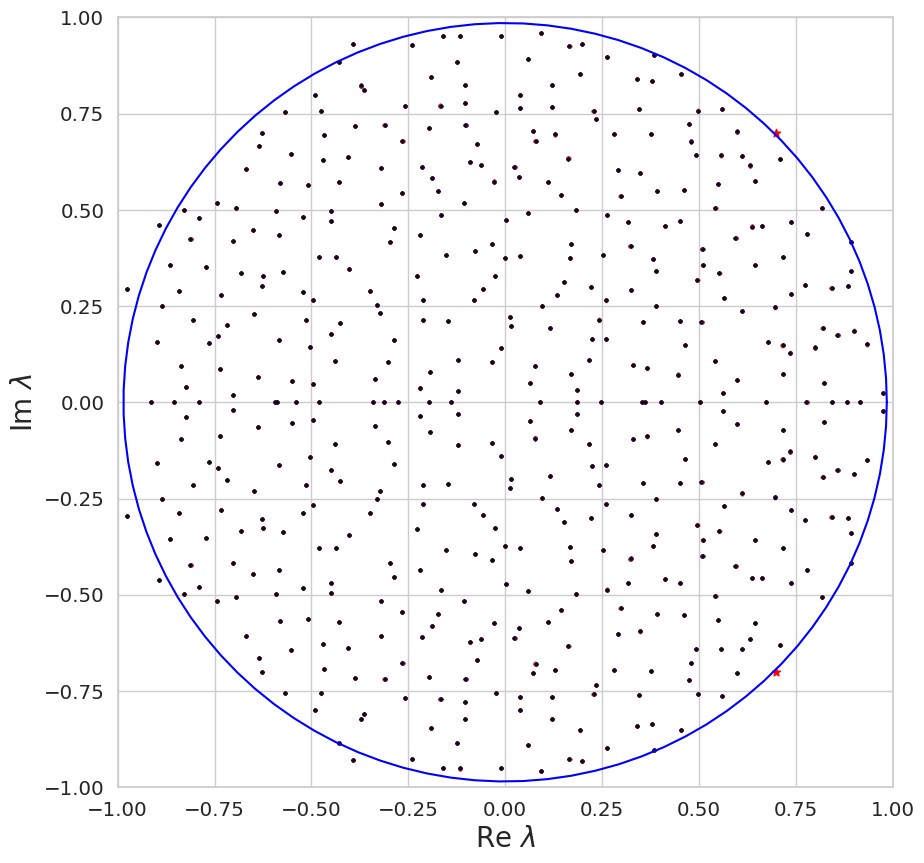

In [ ]:
plt.figure(figsize = (8,8))
times = jnp.arange(60, 120, 2)
sns.set_palette("rocket_r", n_colors=len(times))

plt.figure(figsize = (10,10))
#f, (a0, a1) = plt.subplots(2, 1, height_ratios=[4, 1.25])
for t in times:
  #for t, eig in enumerate(all_eigs):
  plt.scatter(all_eigs[t].real, all_eigs[t].imag, s = 2.5)

theta_vals = jnp.linspace(0, 2*jnp.pi, 100)
plt.plot(sigma * jnp.cos(theta_vals), sigma * jnp.sin(theta_vals), color = 'blue', label = r'$x^2 + y^2 = \sigma^2$')
#plt.aspect('equal')
plt.scatter( [1-c_star,1-c_star], [omega_star, -omega_star], marker = '*', color = 'red')

plt.xlim([-1.0, 1.0])
plt.ylim([-1.0, 1.0])
plt.xlabel(r'Re $\lambda$',fontsize = 20)
#plt.xticks([])

plt.ylabel(r'Im $\lambda$', fontsize = 20)
#plt.tight_layout()

#a1.semilogy(jnp.array(c_scale), jnp.linspace(1,len(c_scale),len(c_scale)), color = 'C6')
#a1.semilogy(1- jnp.array(cs),  jnp.linspace(1,len(cs),len(cs)), '--', color = 'black',label = 'theory')
#a1.semilogy(jnp.array(c_scale), jnp.linspace(1,len(c_scale),len(c_scale)), label = r'$c(s)$')
#a1.semilogy(1- jnp.array(cs),  jnp.linspace(1,len(cs),len(cs)), '--', color = 'black',label = 'theory')
#a1.set_xlabel(r'$c(s)$',fontsize = 20)
#a1.set_xlim([-0.3, 1.0])
#a1.set_ylabel(r'$s$', fontsize = 20)
#a1.legend()
#plt.tight_layout()
#plt.legend()
#plt.savefig('eigenvalue_dynamics_lazy_complex_plane_no_outlier.pdf', bbox_inches= 'tight')
plt.show()

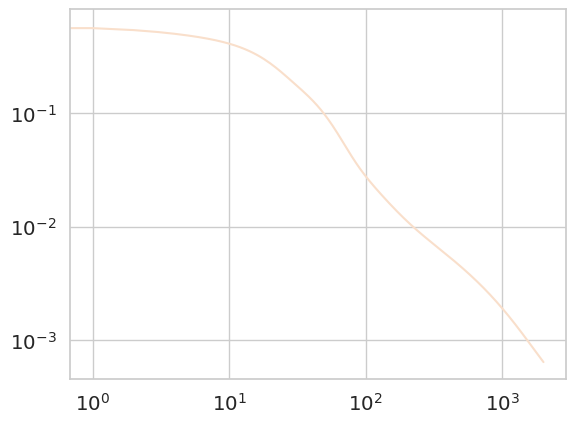

In [ ]:
plt.loglog(losses)
plt.show()

0.7944983


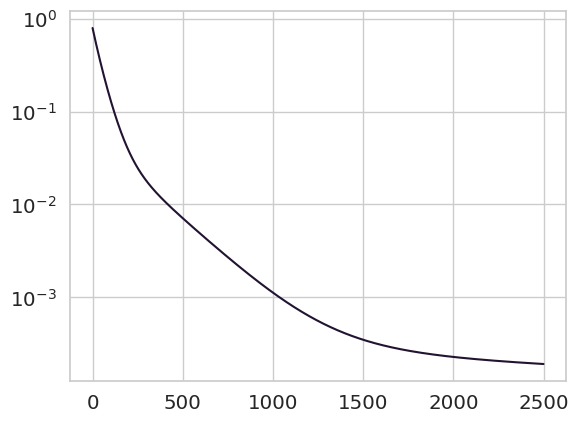

In [ ]:
#plt.plot(losses)
print(losses[0])
plt.semilogy(losses)
plt.show()

<Figure size 800x800 with 0 Axes>

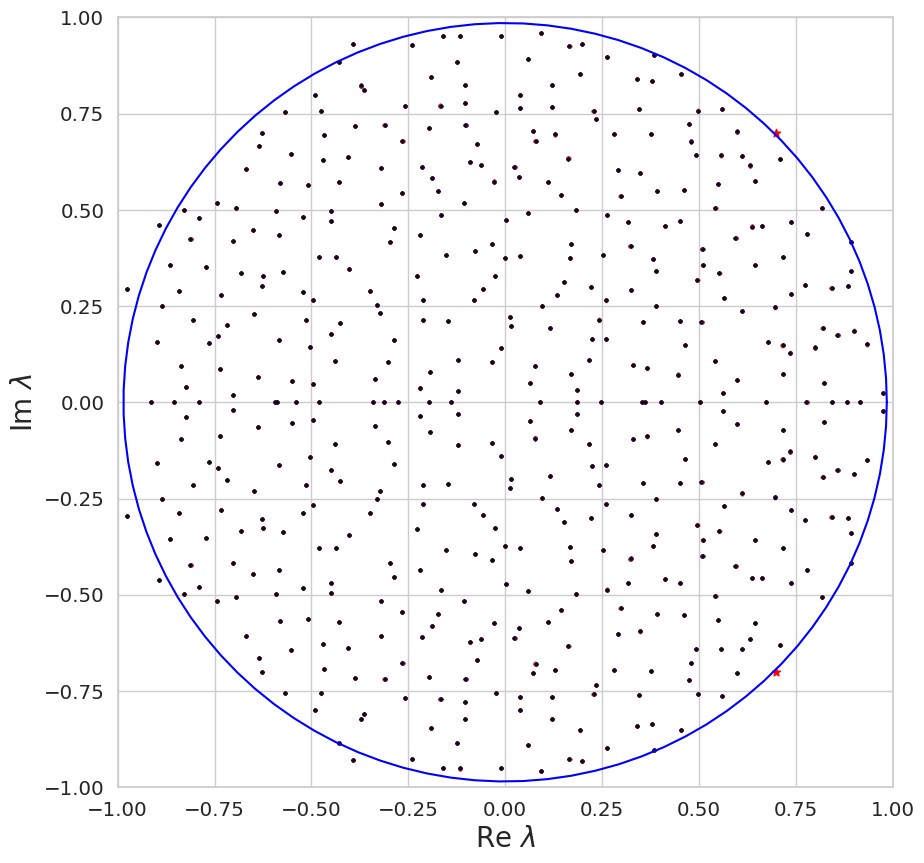

In [ ]:
plt.figure(figsize = (8,8))
times = jnp.arange(60, 120, 2)
sns.set_palette("rocket_r", n_colors=len(times))

plt.figure(figsize = (10,10))
#f, (a0, a1) = plt.subplots(2, 1, height_ratios=[4, 1.25])
for t in times:
  #for t, eig in enumerate(all_eigs):
  plt.scatter(all_eigs[t].real, all_eigs[t].imag, s = 2.5)

theta_vals = jnp.linspace(0, 2*jnp.pi, 100)
plt.plot(sigma * jnp.cos(theta_vals), sigma * jnp.sin(theta_vals), color = 'blue', label = r'$x^2 + y^2 = \sigma^2$')
#plt.aspect('equal')
plt.scatter( [1-c_star,1-c_star], [omega_star, -omega_star], marker = '*', color = 'red')

plt.xlim([-1.0, 1.0])
plt.ylim([-1.0, 1.0])
plt.xlabel(r'Re $\lambda$',fontsize = 20)
#plt.xticks([])

plt.ylabel(r'Im $\lambda$', fontsize = 20)
#plt.tight_layout()

#a1.semilogy(jnp.array(c_scale), jnp.linspace(1,len(c_scale),len(c_scale)), color = 'C6')
#a1.semilogy(1- jnp.array(cs),  jnp.linspace(1,len(cs),len(cs)), '--', color = 'black',label = 'theory')
#a1.semilogy(jnp.array(c_scale), jnp.linspace(1,len(c_scale),len(c_scale)), label = r'$c(s)$')
#a1.semilogy(1- jnp.array(cs),  jnp.linspace(1,len(cs),len(cs)), '--', color = 'black',label = 'theory')
#a1.set_xlabel(r'$c(s)$',fontsize = 20)
#a1.set_xlim([-0.3, 1.0])
#a1.set_ylabel(r'$s$', fontsize = 20)
#a1.legend()
#plt.tight_layout()
#plt.legend()
plt.savefig('eigenvalue_dynamics_lazy_complex_plane_no_outlier.pdf', bbox_inches= 'tight')
plt.show()

(0.3+0.72j)
200
(200, 200)


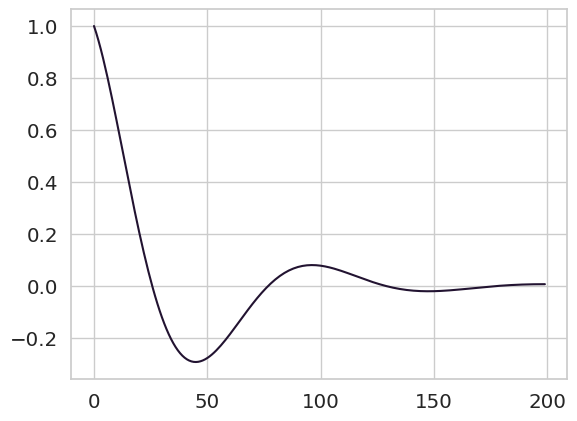

0.99942607


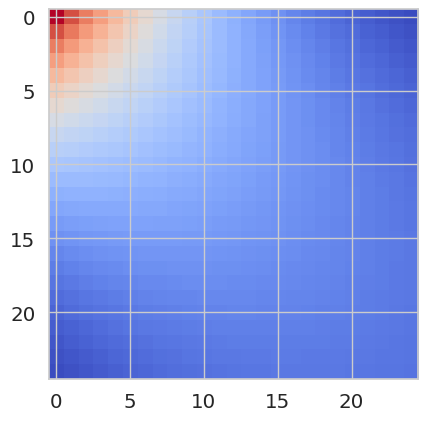

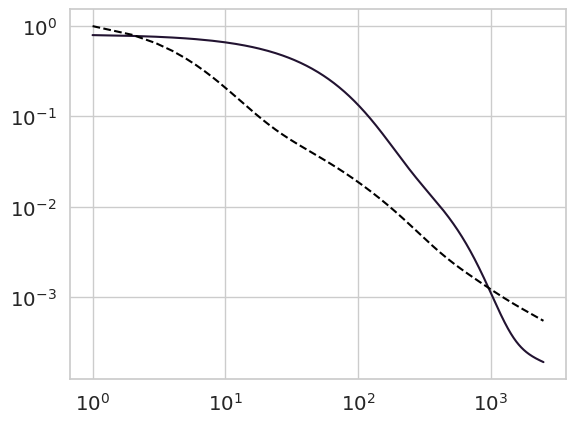

0.99942607
0.7944983


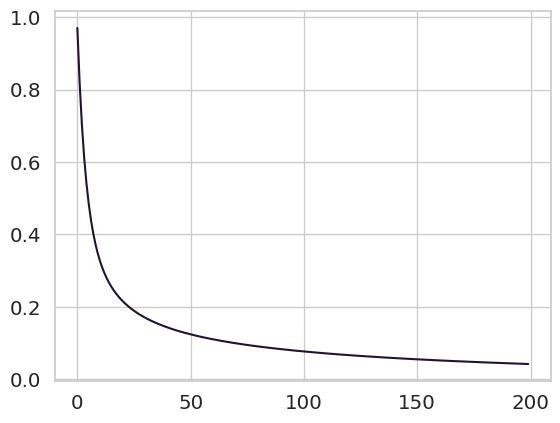

In [ ]:
import jax

def compute_lazy_limit(target_exp, train_step, lamb_init, time_window, dt = 0.025, sigma = 0.1, lr = 0.01, steps = 100):

  # compute NTK for this model
  # v = - (  )

  print(time_window)
  Theta = dt * jnp.tril( jnp.ones((time_window,time_window)) , k=-1)
  inv_mat = jnp.linalg.inv( jnp.eye(time_window) + Theta )
  C = sigma**2 * inv_mat @ jnp.ones((time_window, time_window)) @ inv_mat.T

  for n in range(steps):

    C_new = sigma**2 * inv_mat @ jnp.ones((time_window, time_window)) @ inv_mat.T
    C_new += sigma**2 * inv_mat @ Theta @ C @ Theta.T @ inv_mat.T
    C = 0.9 * C_new + 0.1 * C

  K = 2 * sigma**2 * C
  print(K.shape)

  #conv =  jax.scipy.signal.convolve2d(C, C, mode = 'valid')
  #print(conv.shape)
  #K += sigma**2 * conv

  s, phi = jnp.linalg.eigh(K)
  y = jnp.exp( - target_exp * jnp.linspace(0, time_window-1, time_window) * dt  ).real

  plt.plot(y)
  plt.show()

  print(jnp.sum(y**2) * dt)

  #coeffs = phi.T @ y
  Delta = 1.0 * y
  loss= []
  for t in range(train_step):
    loss += [ jnp.sum(Delta**2) * dt ]

    Delta -= lr * K @ Delta

  #tvals = jnp.linspace(0, train_step, train_step)
  #errs = jnp.exp( - lr * jnp.outer( tvals , s) ) * coeffs[jnp.newaxis,:]

  #loss = jnp.sum( errs**2 , axis = 1 ) * dt

  return C, jnp.array(loss)

print(target_exp)
C, loss = compute_lazy_limit(target_exp, train_step, lamb_init, time_window, dt= dt, sigma = sigma)

plt.imshow(C[0:25,0:25], cmap = 'coolwarm')
plt.show()

plt.loglog(jnp.linspace(1,len(losses),len(losses)), losses, label = 'Expt')
plt.loglog(jnp.linspace(1,len(losses),len(losses)), loss,'--', color = 'black')
plt.show()
print(loss[0])
print(losses[0])

plt.plot(jnp.diag(C))
plt.show()

(250, 500)


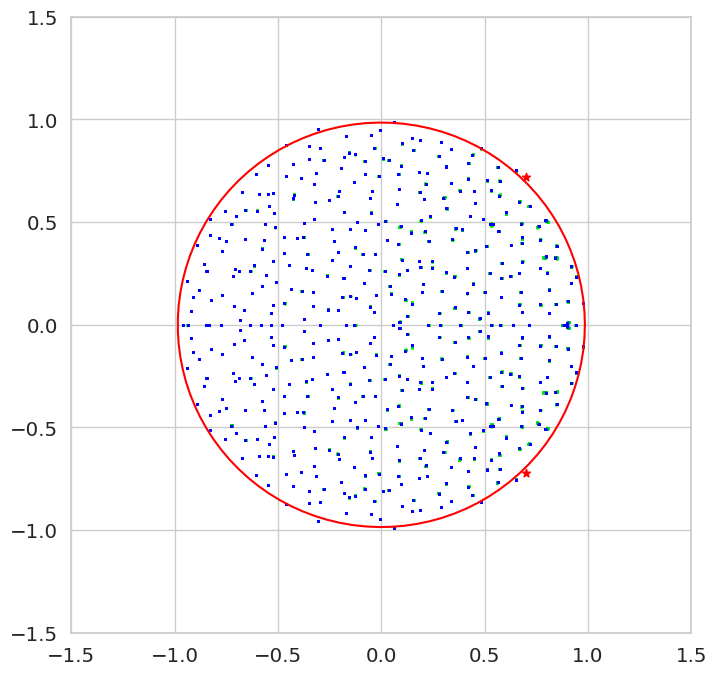

In [ ]:
all_eigs = np.array(all_eigs)
#all_eigs2d = np.array(all_eigs2d)

print(all_eigs.shape)
Ts = np.linspace(0, 1, len(all_eigs))
plt.figure(figsize = (8,8))

for i, eig in enumerate(all_eigs):
    plt.scatter(eig.real, eig.imag, color=(0.0, 1.0*(1-Ts[i]) , Ts[i] ), s = 0.8)
    #plt.scatter( all_eigs2d[i].real, all_eigs2d[i].imag , color = 'black', s = 0.25)

thetas = np.linspace(0, 2*np.pi, 100)
plt.plot(  sigma * np.cos(thetas), sigma *np.sin(thetas), color = 'red')
#box_size = 20 / np.sqrt(N)

box_size = 1.5

plt.scatter( [1-c_star,1-c_star], [omega_star, -omega_star], marker = '*', color = 'red')

#plt.plot(  1.0-jnp.array(c_omega).real, jnp.array(c_omega).imag , '--', color = 'black' )
#plt.plot(  1.0-jnp.array(c_omega).real, -jnp.array(c_omega).imag , '--', color = 'black')

plt.xlim([-box_size, box_size])
plt.ylim([-box_size, box_size])
plt.xlabel('$\lambda$')
plt.show()

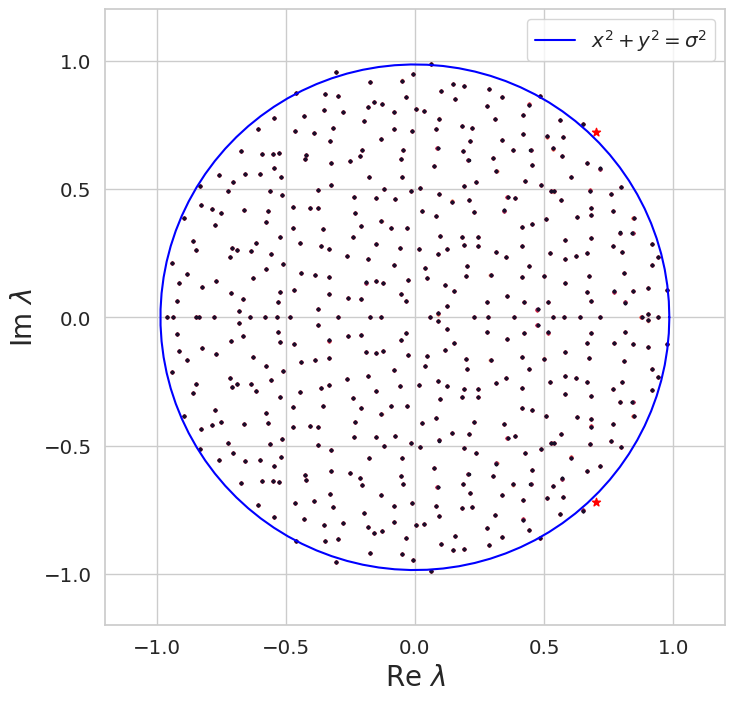

In [ ]:
plt.figure(figsize = (8,8))

times = jnp.arange(60, 90, 2)
sns.set_palette("rocket_r", n_colors=len(times))

for t in times:
  #for t, eig in enumerate(all_eigs):
  plt.scatter(all_eigs[t].real, all_eigs[t].imag, s = 2.5)

theta_vals = jnp.linspace(0, 2*jnp.pi, 100)
plt.plot(sigma * jnp.cos(theta_vals), sigma * jnp.sin(theta_vals), color = 'blue', label = r'$x^2 + y^2 = \sigma^2$')
plt.scatter( [1-c_star,1-c_star], [omega_star, -omega_star], marker = '*', color = 'red')

plt.xlim([-1.2, 1.2])
plt.ylim([-1.2, 1.2])
plt.xlabel(r'Re $\lambda$',fontsize = 20)
plt.ylabel(r'Im $\lambda$', fontsize = 20)
plt.legend()
plt.savefig('eigenvalue_dynamics_real_time_lazy.pdf', bbox_inches= 'tight')
plt.show()

In [ ]:
print(N)

500


In [ ]:
def train_RF_complex_target_warmstart(target_exp, N, train_step, lamb_init, time_window, dt = 0.025, sigma = 0.1, lr = 0.01, tied = True, leak = 1.0, gamma = 1.0, seed = 0):

  u_dir = random.normal(random.PRNGKey(seed), (N,))
  u_dir = u_dir / jnp.sqrt( jnp.mean(u_dir**2) )
  u = sigma*u_dir
  if tied:
    v = u
  else:
    v = sigma*random.normal(random.PRNGKey(seed + 3), (N,))

  """
  perp_u = random.normal( random.PRNGKey(2 * seed + 1), (N,)  )
  perp_u = perp_u - jnp.dot(perp_u, u)/jnp.sum(u**2) * u
  perp_u = perp_u / jnp.sqrt( jnp.sum(perp_u**2) ) * jnp.sqrt( jnp.sum(u**2) )
  print(jnp.sum(perp_u**2) / N)
  print(jnp.sum(u**2) / N )


  u_normed = u / jnp.sqrt(jnp.sum(u**2) )
  perp_u_normed = perp_u / jnp.sqrt(jnp.sum(perp_u**2) )
  z = u_normed + 1j * perp_u_normed
  #lamb_init = 1.5*sigma + 1j * 1.5*sigma
  #print(lamb_init)
  outlier_component = lamb_init * jnp.outer( z, jnp.conjugate(z) ) + jnp.conjugate(lamb_init) * jnp.outer( jnp.conjugate(z), z )

  outlier_component = outlier_component.real
  print(outlier_component.shape)
  #  s * u

  W = sigma*random.normal(random.PRNGKey(seed + 4), (N,N))  + jnp.sqrt(N) * outlier_component
  """

  W = sigma*random.normal(random.PRNGKey(4 * seed + 4), (N,N))

  def loss_fn(v, u, W):

    def update_fn(carry, x):
      h = carry
      dh = dt * ( - leak * h + 1/jnp.sqrt(N) * W @ h  ) # run forward dynamics starting from u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v ) / gamma
      return h_new, window

    _, f = lax.scan(update_fn, init = u, xs= None, length = time_window)
    y = jnp.exp( - target_exp * jnp.linspace(0, time_window-1, time_window) * dt  ).real

    return jnp.sum( (f-y)**2 ) * dt

  y = jnp.exp( - target_exp * jnp.linspace(0, time_window-1, time_window) * dt  ).real

  plt.plot(jnp.linspace(0, time_window-1, time_window) * dt, y)
  plt.show()
  print("y norm")
  print(jnp.sum(y**2) * dt)


  val_grad_fn = jit( value_and_grad(loss_fn) )
  opt_init, opt_update, get_params = optimizers.sgd( lr * N * gamma**2 )

  opt_state = opt_init(v)

  losses = []
  aligns = []
  W_aligns = []
  u_norm = []
  c_scale = []

  all_eigs = []
  all_zu = []
  all_u_top_eig = []

  for t in range(train_step):

    v = get_params(opt_state)


    loss, grads = val_grad_fn(get_params(opt_state), u, W)

    opt_state = opt_update(t, grads, opt_state)

    losses.append(loss)


    aligns += [ jnp.sum( u * v ) / jnp.sqrt( jnp.sum(u**2) * jnp.sum(v**2) ) ]
    W_aligns += [  jnp.sum( v * ( W @ u )) / jnp.sqrt( jnp.sum((W @ u)**2) * jnp.sum(v**2) )   ]

    u_norm += [ jnp.mean(u**2) ]
    c_scale += [ jnp.mean(  v *  (W @ u / jnp.sqrt(N) )) ]

    all_zu += [ jnp.mean( u * v ) ]



  # check final windowing fn
  def update_fn(carry, x):
      h = carry
      dh = dt * ( -leak*h + 1/jnp.sqrt(N) * W @ h  ) # run forward dynamics starting rom u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v ) / gamma
      return h_new, window

  _, f = lax.scan(update_fn, init = u, xs= None, length = time_window)
  plt.plot(y)
  plt.plot(f, '--')
  plt.show()

  return losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs, all_zu, all_u_top_eig


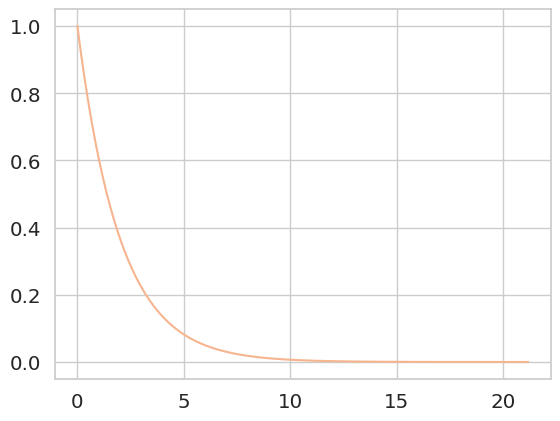

y norm
1.043102


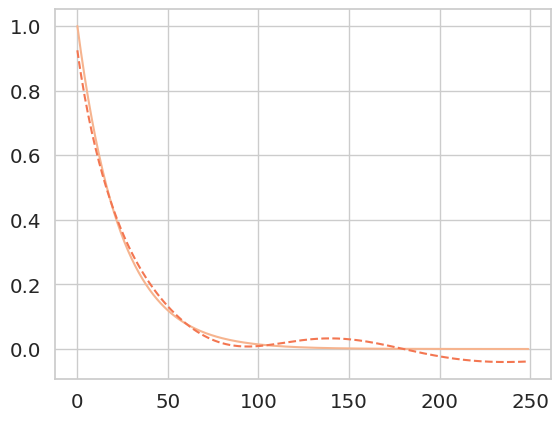

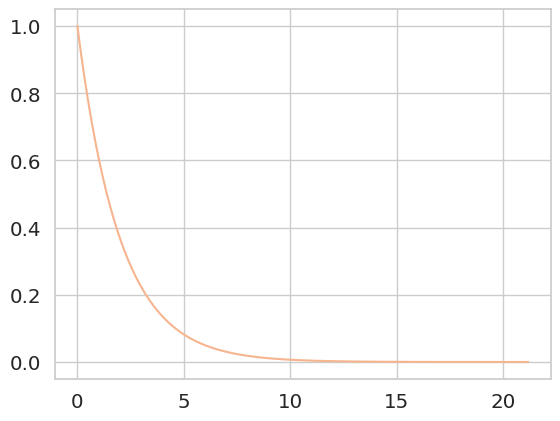

y norm
1.043102


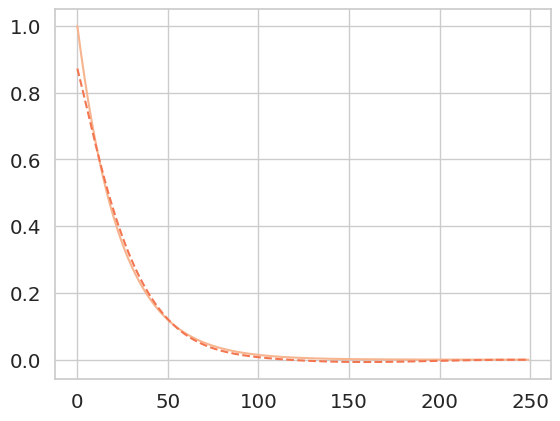

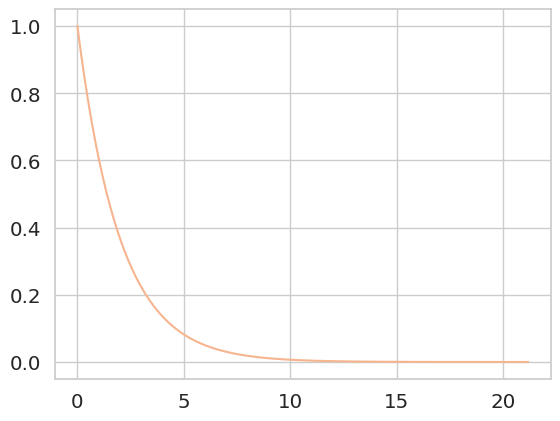

y norm
1.043102


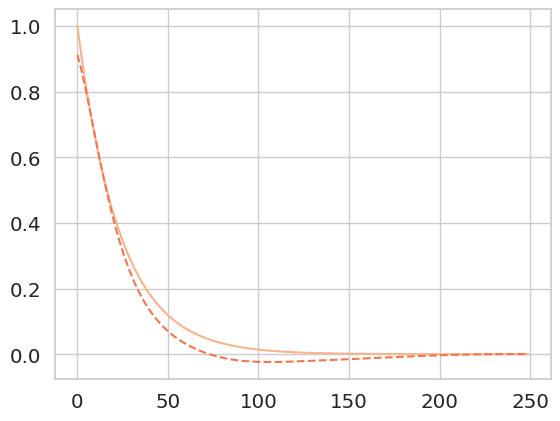

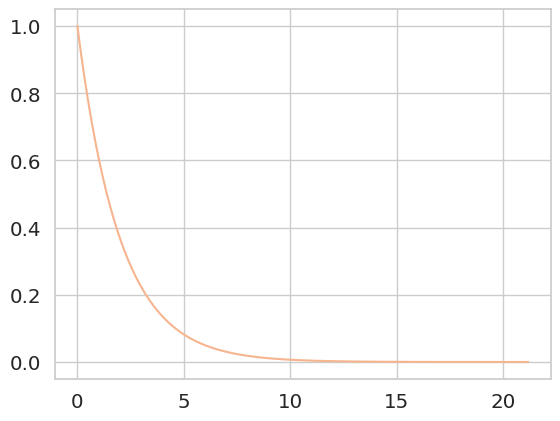

y norm
1.043102


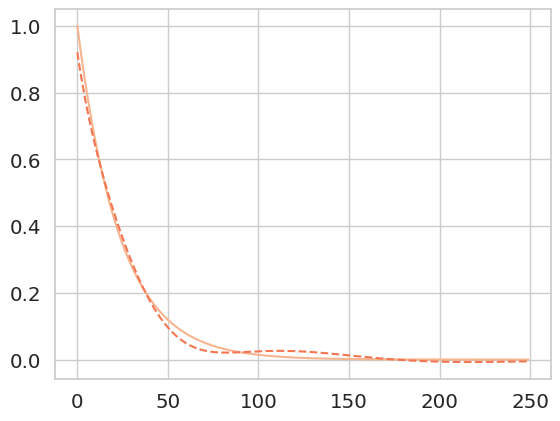

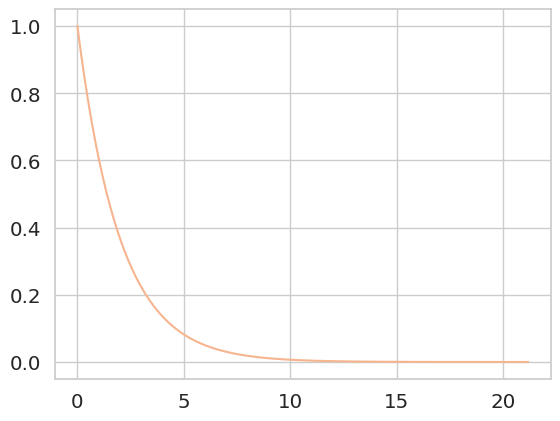

y norm
1.043102


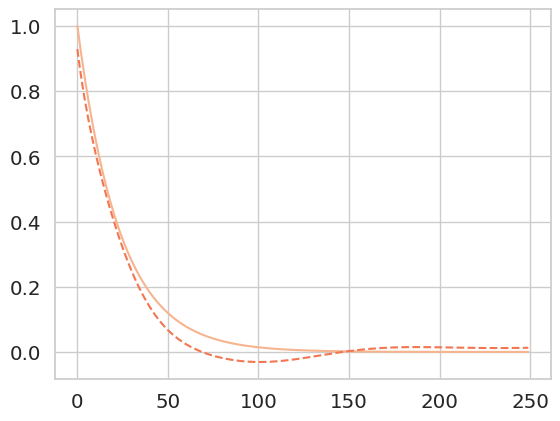

In [ ]:
N = 100
lr = 0.0025
sigma = 0.98
gamma = 3.0
lamb_init = 0.0 + 0.0*1j

time_window = 250
train_step = 1000

c_star = 0.5
omega_star = 0.0
target_exp = c_star + 1j * omega_star

dt = 0.085

all_loss = []
for k in range(5):
  losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs, all_zu, all_u_top = train_RF_complex_target_warmstart(target_exp, N, train_step, lamb_init, time_window,sigma=sigma, lr = lr, dt=dt, tied = False, gamma=gamma, seed = k)
  all_loss += [losses]

In [ ]:
print(sigma)
print(gamma)
print(lr)

0.98
1.0
0.005


In [ ]:
tvals = jnp.linspace(0, time_window-1, time_window) * dt
C = sigma**2 * jnp.exp(- tvals[:,jnp.newaxis] - tvals[jnp.newaxis,:] ) * jax.scipy.special.i0(2 * sigma * jnp.sqrt(jnp.outer(tvals,tvals)))
y = jnp.exp( - target_exp * tvals  ).real

K = C

Delta = 1.0 * y
loss_i0 = []
for t in range(train_step):
  loss_i0 += [ jnp.sum(Delta**2) * dt]
  Delta -= 2 * lr * K @ Delta  * dt


[Array(1.043102, dtype=float32), Array(1.0351017, dtype=float32), Array(1.0271639, dtype=float32), Array(1.0192883, dtype=float32), Array(1.0114744, dtype=float32), Array(1.0037217, dtype=float32), Array(0.99602973, dtype=float32), Array(0.98839813, dtype=float32), Array(0.98082626, dtype=float32), Array(0.9733136, dtype=float32), Array(0.9658599, dtype=float32), Array(0.95846444, dtype=float32), Array(0.9511269, dtype=float32), Array(0.9438468, dtype=float32), Array(0.93662375, dtype=float32), Array(0.9294571, dtype=float32), Array(0.92234665, dtype=float32), Array(0.9152918, dtype=float32), Array(0.90829206, dtype=float32), Array(0.90134716, dtype=float32), Array(0.8944566, dtype=float32), Array(0.8876199, dtype=float32), Array(0.8808366, dtype=float32), Array(0.87410647, dtype=float32), Array(0.8674289, dtype=float32), Array(0.8608034, dtype=float32), Array(0.8542299, dtype=float32), Array(0.84770757, dtype=float32), Array(0.8412365, dtype=float32), Array(0.83481574, dtype=float32),

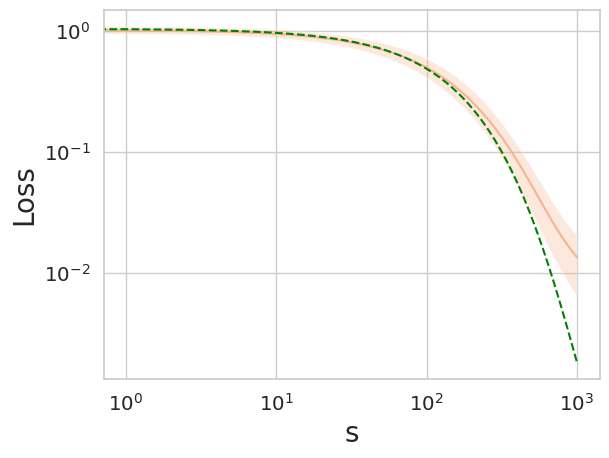

In [ ]:
#print(losses[0])
#print(loss[0]/losses[0])

loss_mean = jnp.array(all_loss).mean(axis=0)
loss_std = jnp.array(all_loss).std(axis=0)

plt.loglog(loss_mean)
plt.fill_between(jnp.arange(len(loss_mean)), loss_mean - loss_std, loss_mean + loss_std , alpha = 0.3 )

#plt.loglog(loss,'--')
print(loss_i0)
plt.loglog(loss_i0, '--', color = 'green')
plt.ylabel('Loss',fontsize = 20)
plt.xlabel('s', fontsize = 20)
plt.show()



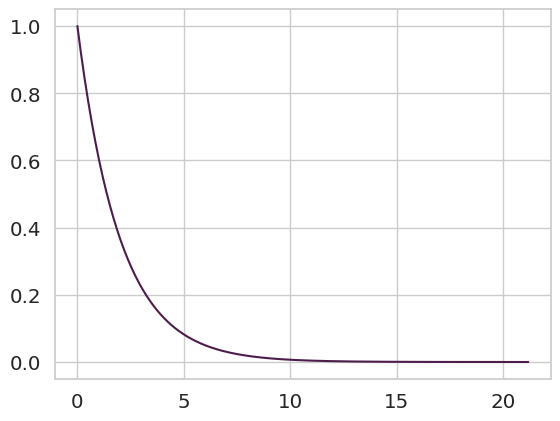

y norm
1.043102


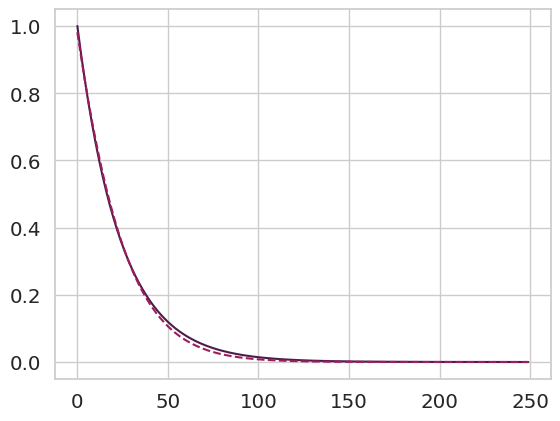

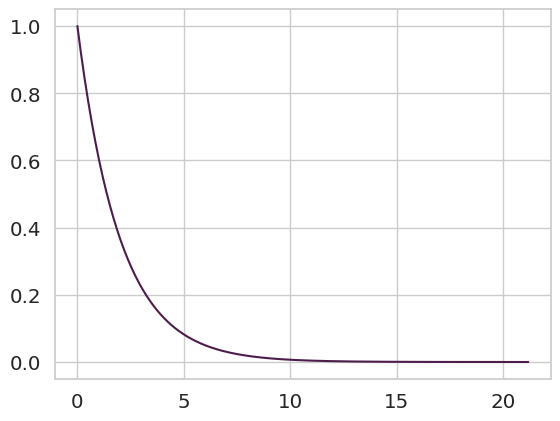

y norm
1.043102


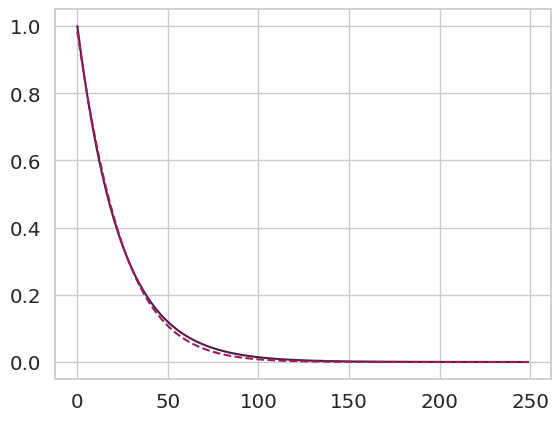

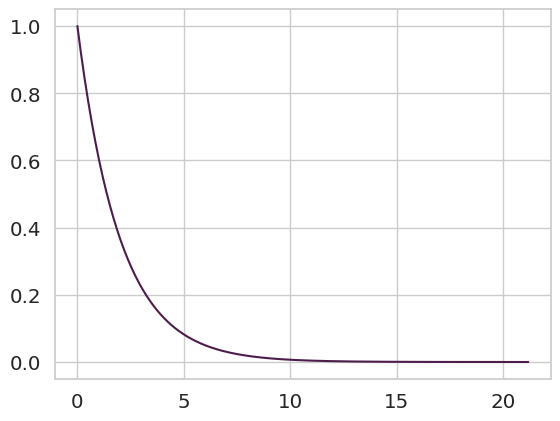

y norm
1.043102


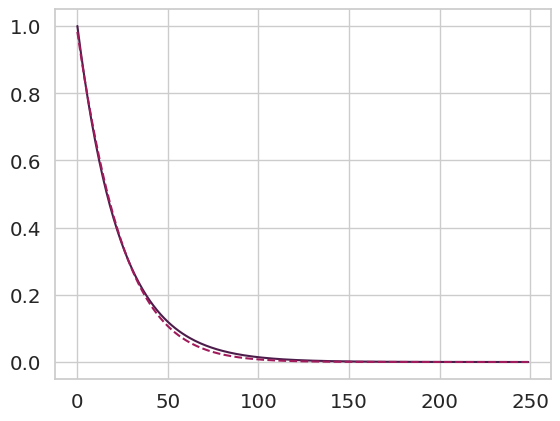

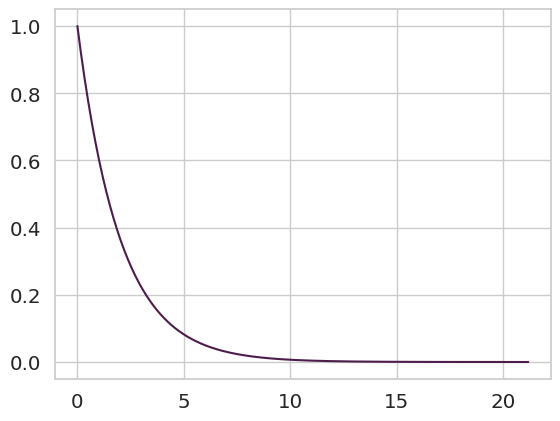

y norm
1.043102


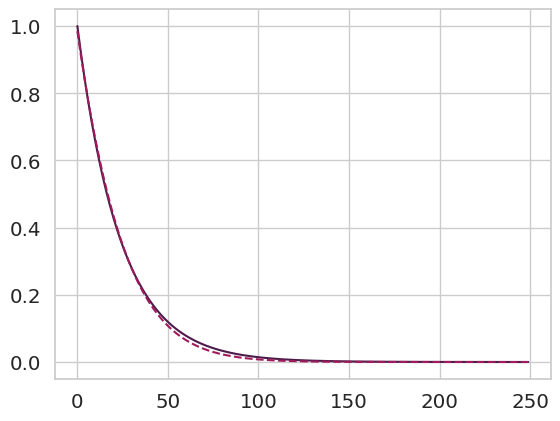

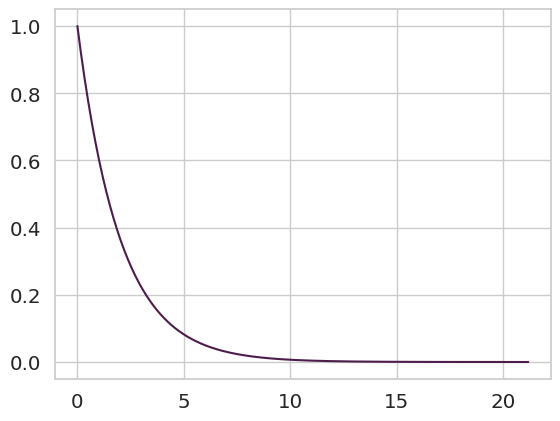

y norm
1.043102


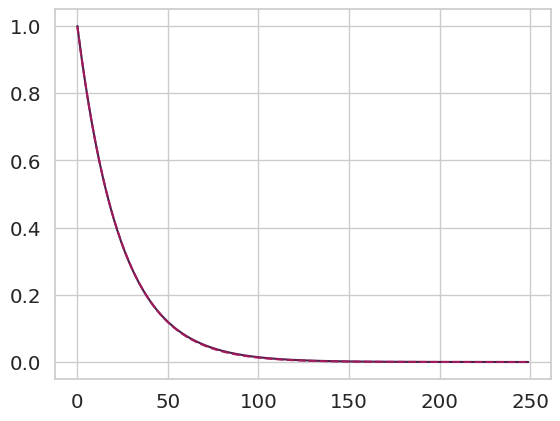

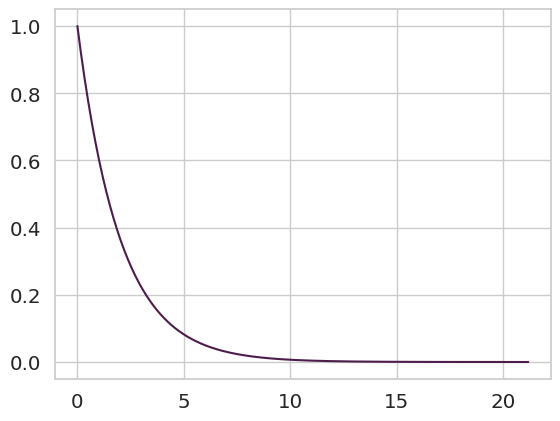

y norm
1.043102


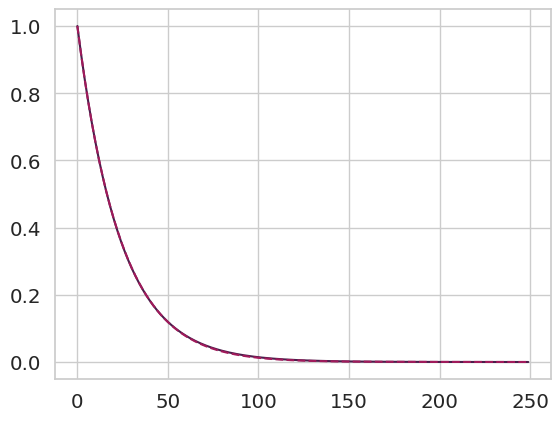

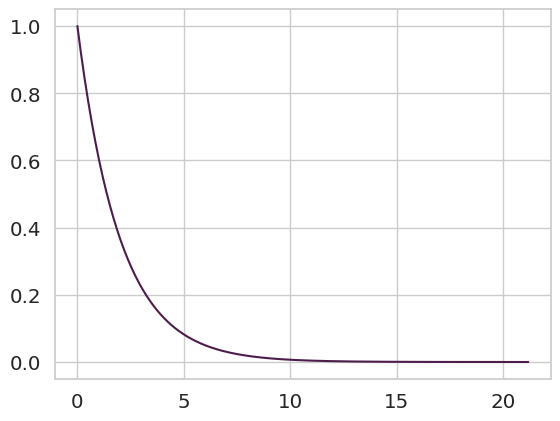

y norm
1.043102


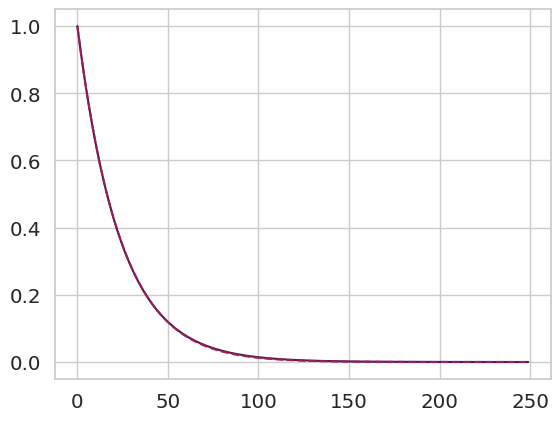

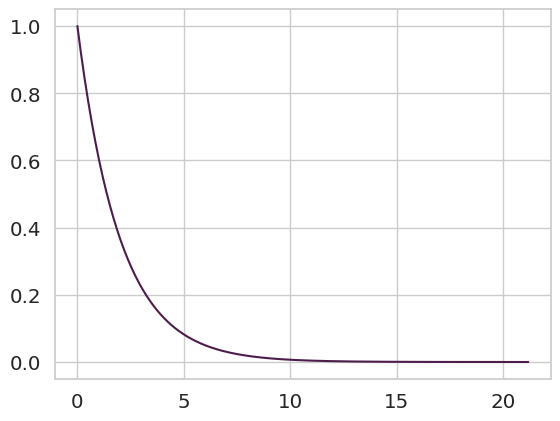

y norm
1.043102


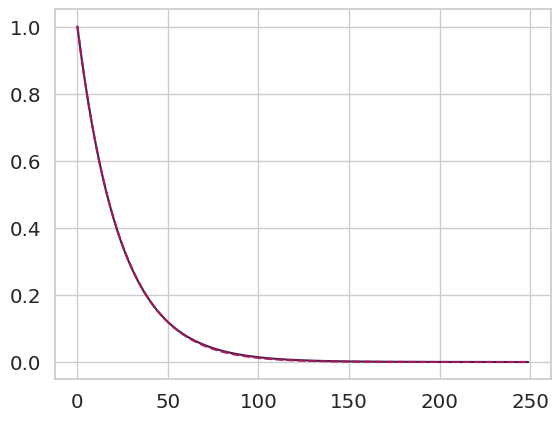

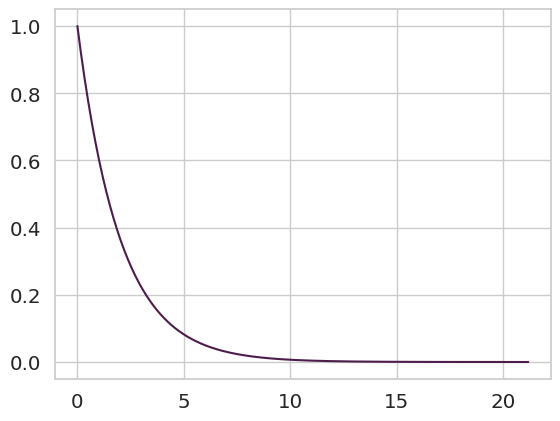

y norm
1.043102


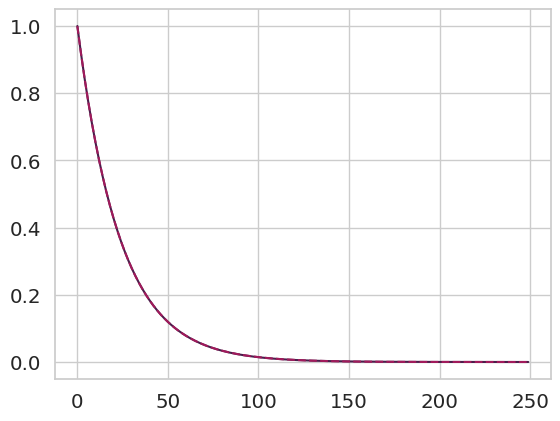

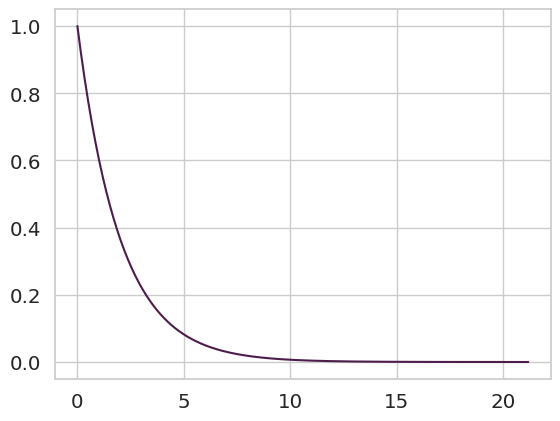

y norm
1.043102


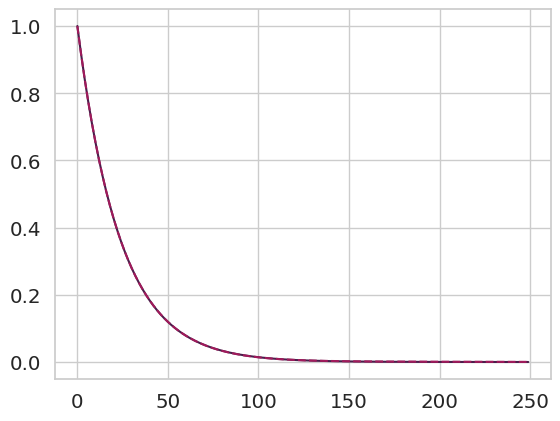

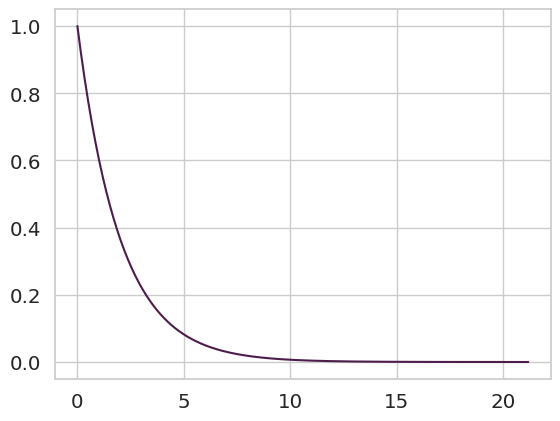

y norm
1.043102


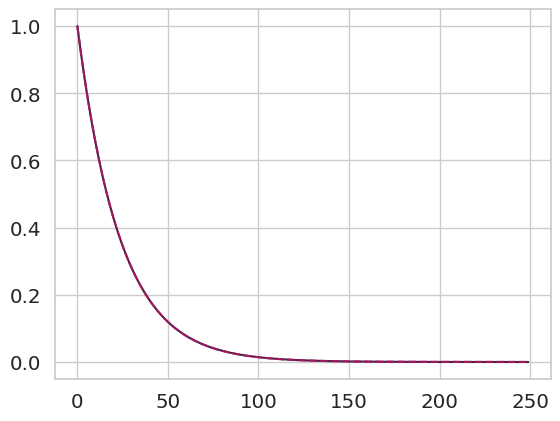

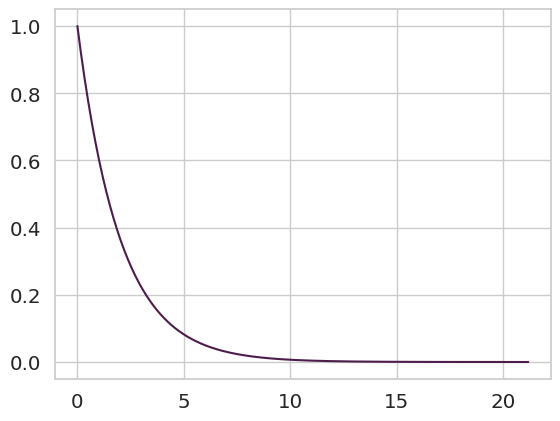

y norm
1.043102


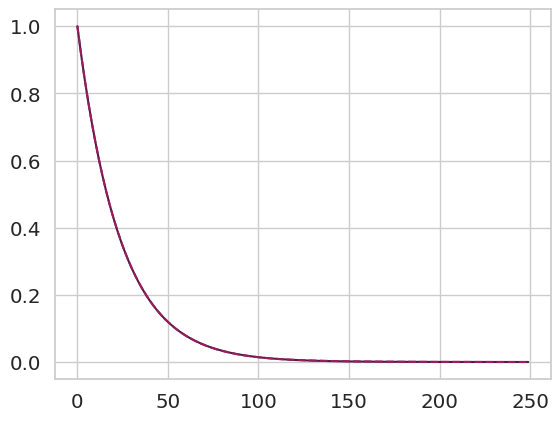

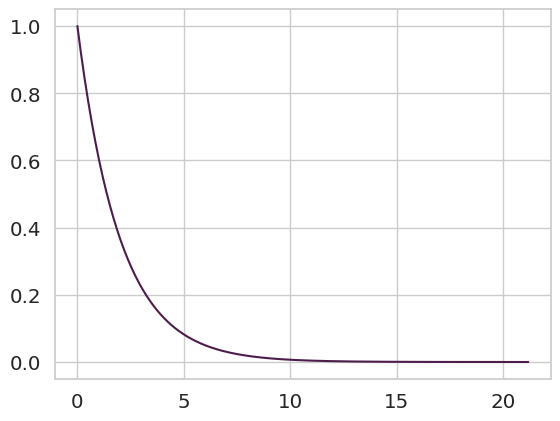

y norm
1.043102


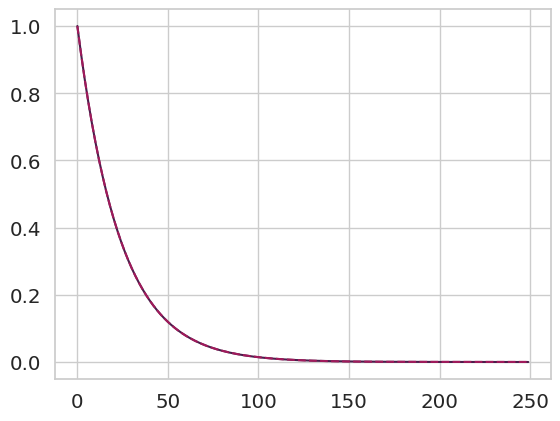

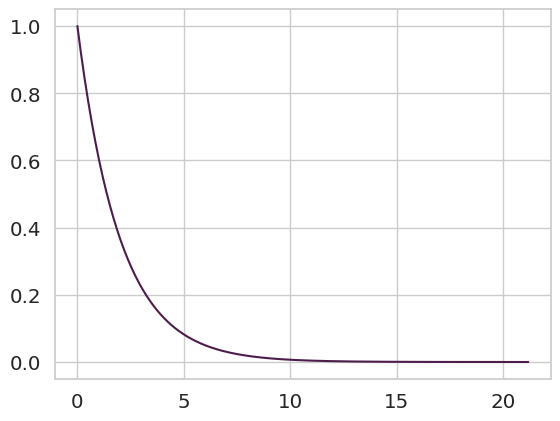

y norm
1.043102


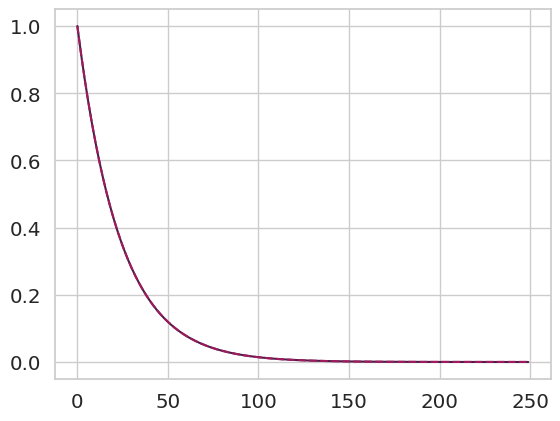

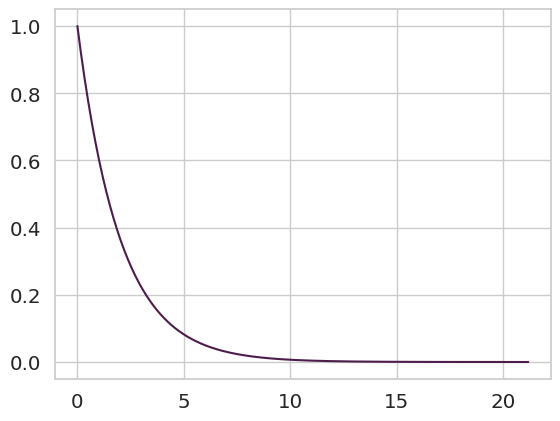

y norm
1.043102


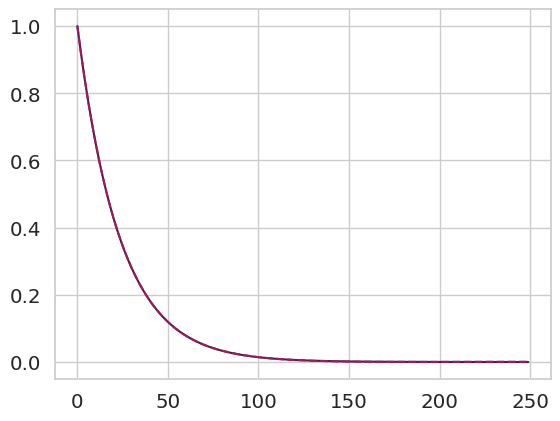

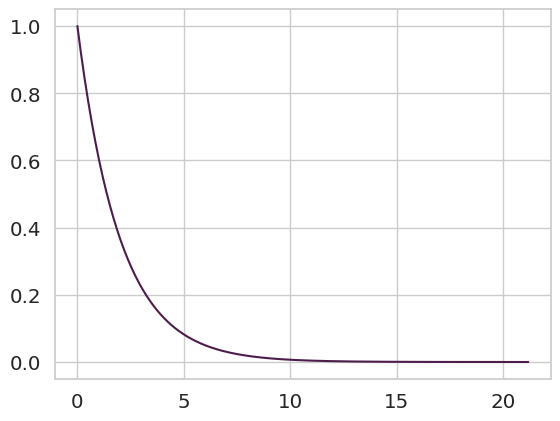

y norm
1.043102


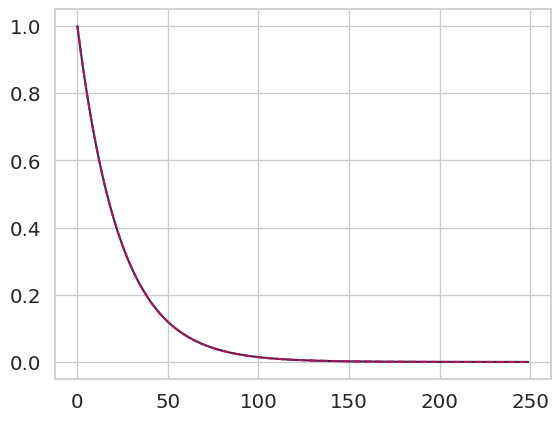

In [ ]:
sigmas = [0.6, 0.7, 0.8, 0.9]

lr = 0.15
N = 4000

all_all_loss = []
for i, sigma in enumerate(sigmas):
  all_loss = []
  for k in range(4):
    losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs, all_zu, all_u_top = train_RF_complex_target_warmstart(target_exp, N, train_step, lamb_init, time_window,sigma=sigma, lr = lr, dt=dt, tied = False, gamma=gamma, seed = k)
    all_loss += [losses]
  all_all_loss += [all_loss]

In [ ]:
all_loss_th = []
for i, sigma in enumerate(sigmas):

  tvals = jnp.linspace(0, time_window-1, time_window) * dt
  C = sigma**2 * jnp.exp(- tvals[:,jnp.newaxis] - tvals[jnp.newaxis,:] ) * jax.scipy.special.i0(2 * sigma * jnp.sqrt(jnp.outer(tvals,tvals)))
  y = jnp.exp( - target_exp * tvals  ).real

  K = C
  Delta = 1.0 * y
  loss_i0 = []
  for t in range(train_step):
    loss_i0 += [ jnp.sum(Delta**2) * dt]
    Delta -= 2 * lr * K @ Delta  * dt

  all_loss_th += [loss_i0]



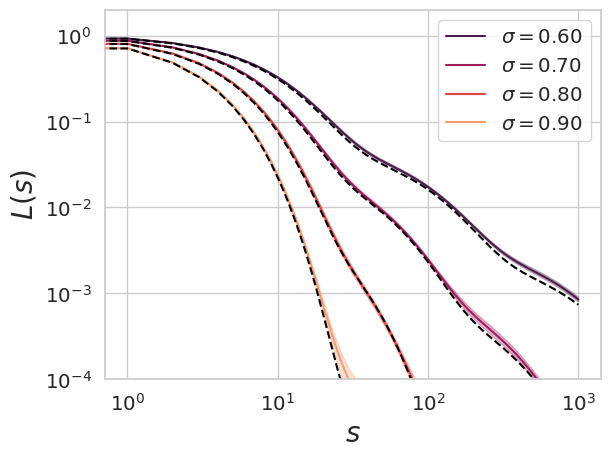

In [ ]:
sns.set_palette("rocket", n_colors=len(sigmas))

for i, sigma in enumerate(sigmas):
  loss_mean = jnp.array(all_all_loss[i]).mean(axis=0)
  loss_std = jnp.array(all_all_loss[i]).std(axis=0)
  plt.loglog( loss_mean , color = f'C{i}', label = r'$\sigma = %0.2f$' % sigma)
  plt.fill_between(jnp.arange(len(loss_mean)), loss_mean - loss_std, loss_mean + loss_std , alpha = 0.3 , color = f'C{i}')
  plt.loglog(all_loss_th[i], '--', color = 'black')
plt.legend()
plt.xlabel(r'$s$',fontsize = 20)
plt.ylabel(r'$L(s)$',fontsize = 20)
plt.ylim([1e-4,2.0])
#plt.savefig(f'lazy_learning_loss_vs_sigma_new_N_{N}.pdf',bbox_inches = 'tight')
plt.savefig(f'lazy_learning_loss_vs_sigma_new_N_{N}.svg',bbox_inches = 'tight')

plt.show()

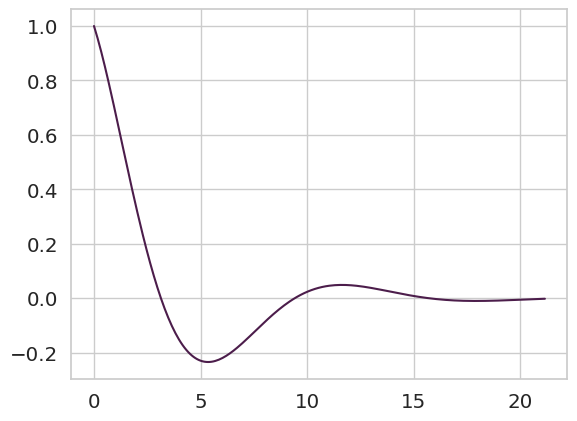

y norm
1.2427869


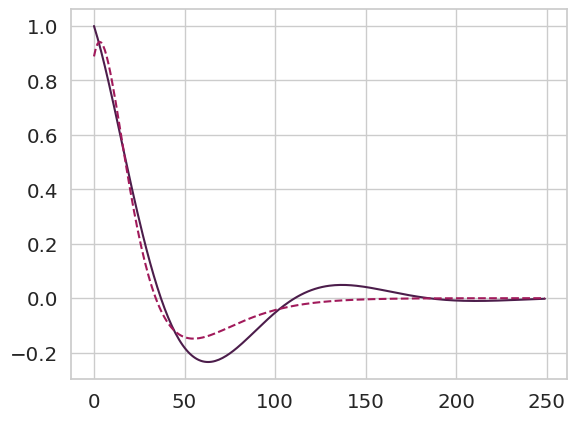

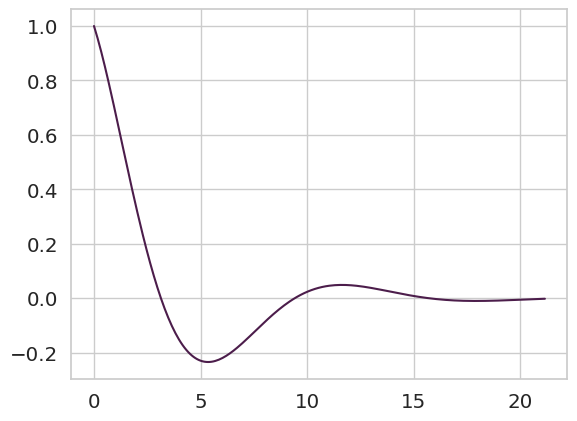

y norm
1.2427869


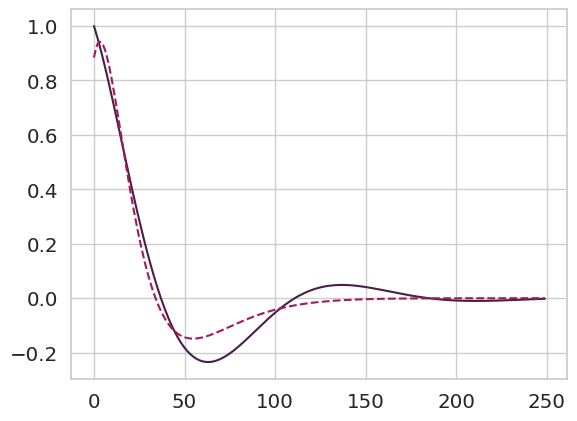

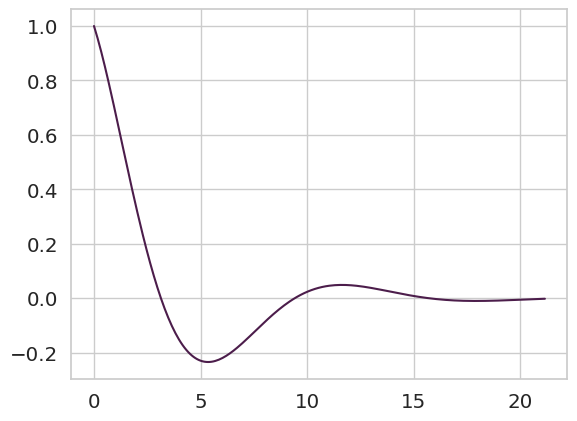

y norm
1.2427869


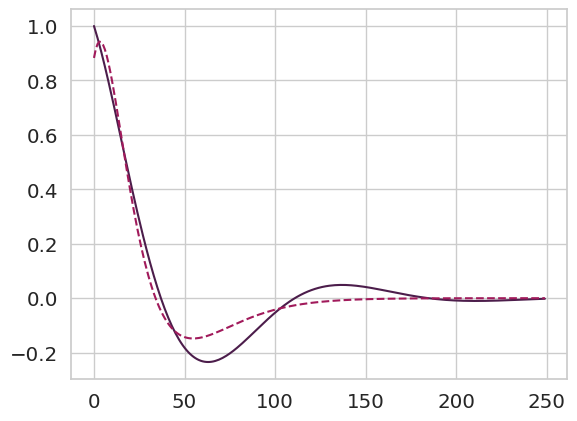

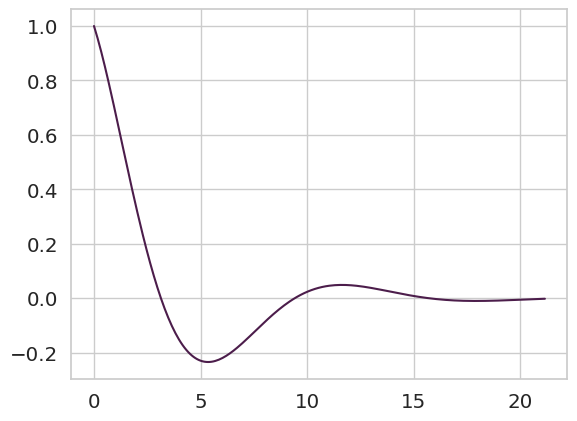

y norm
1.2427869


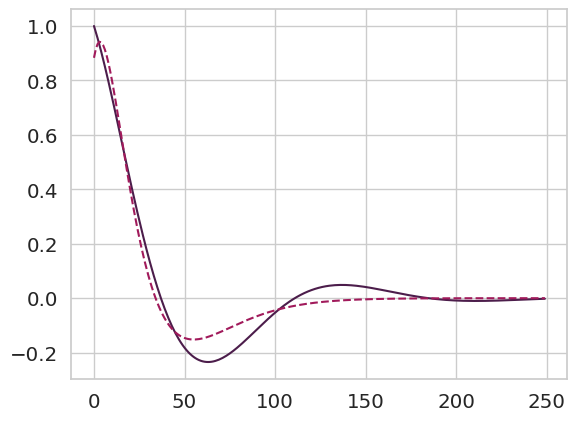

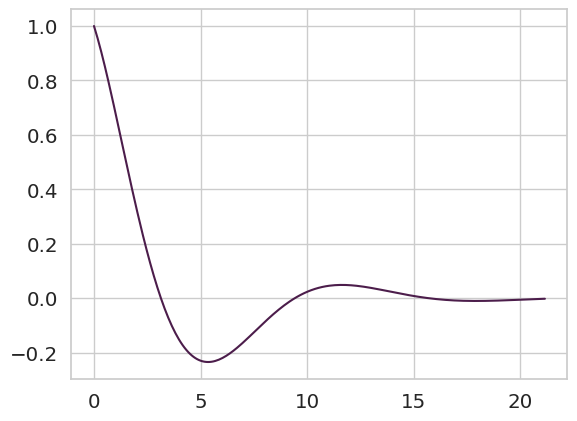

y norm
1.2427869


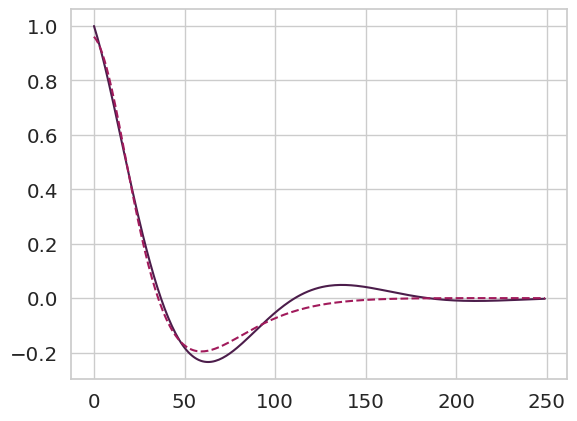

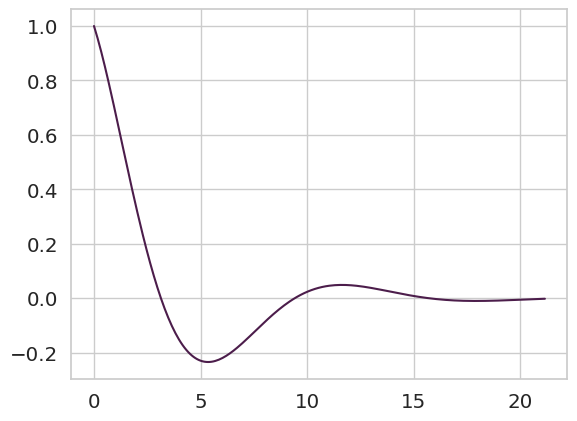

y norm
1.2427869


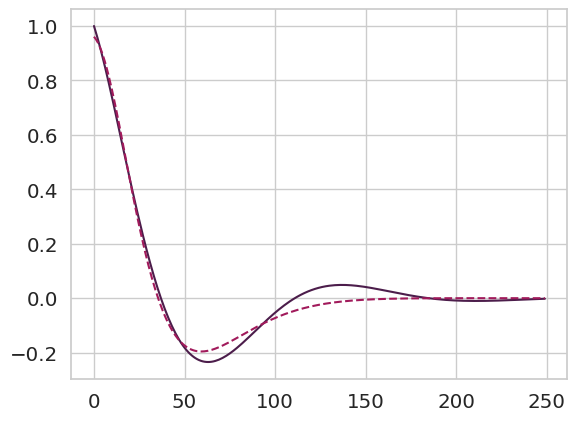

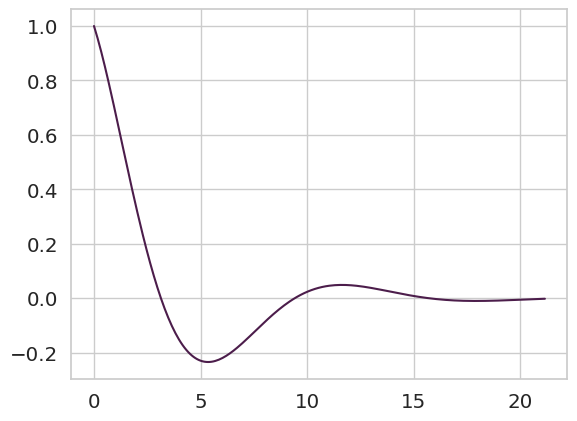

y norm
1.2427869


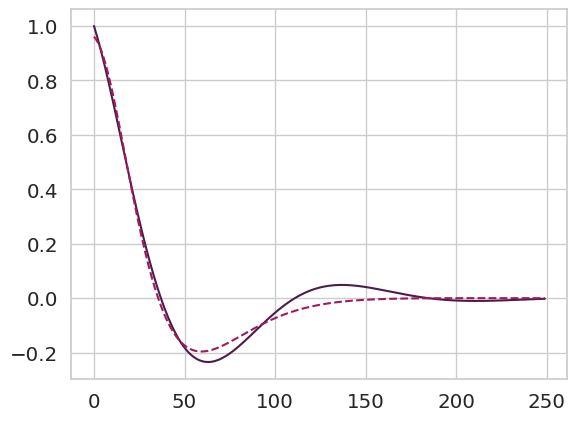

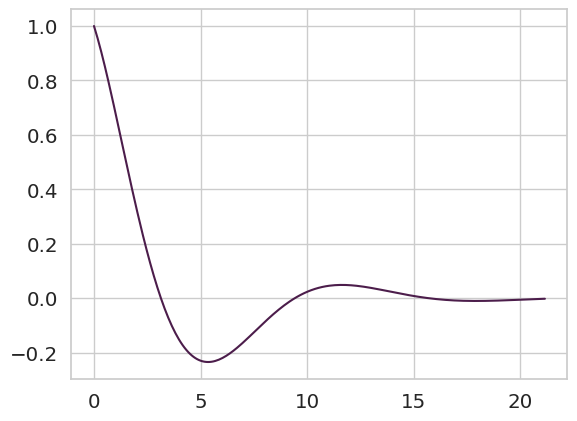

y norm
1.2427869


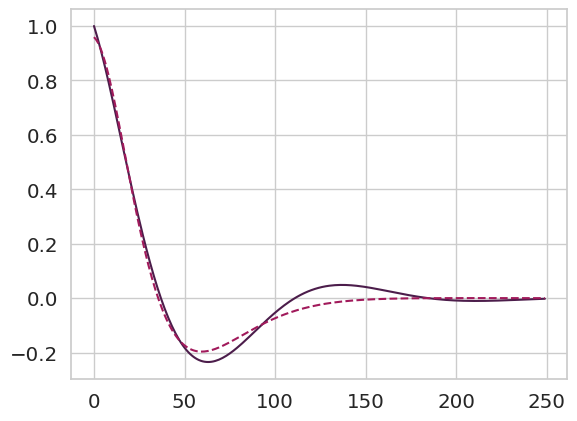

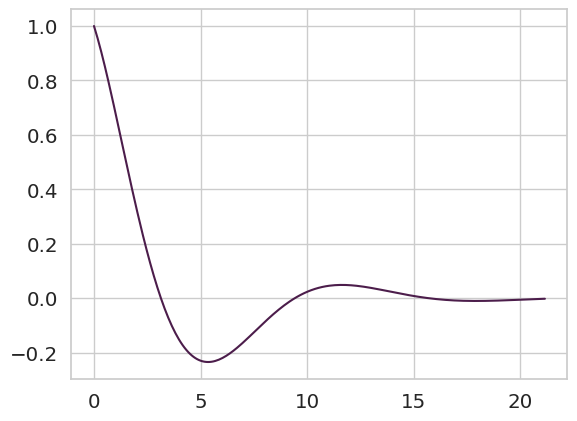

y norm
1.2427869


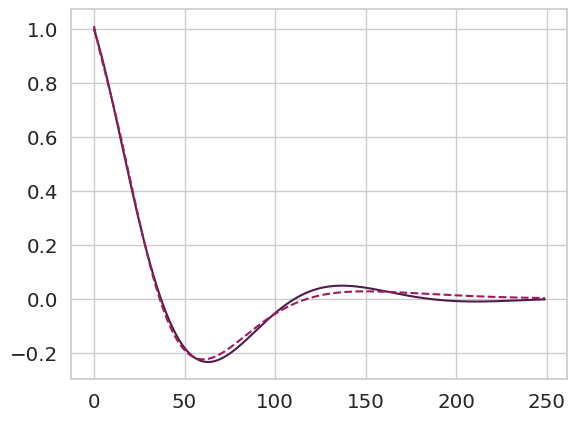

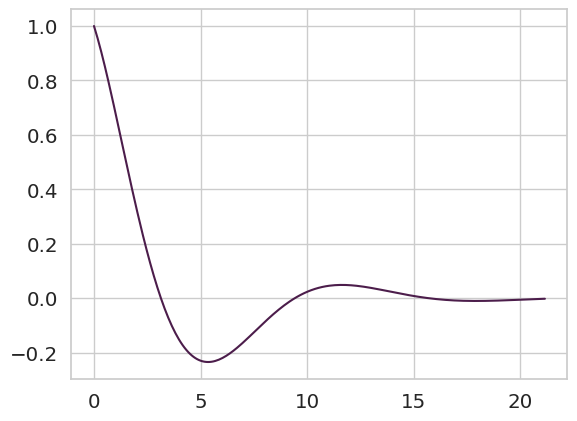

y norm
1.2427869


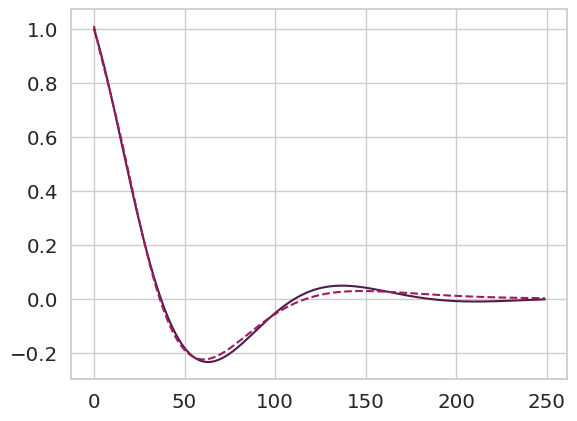

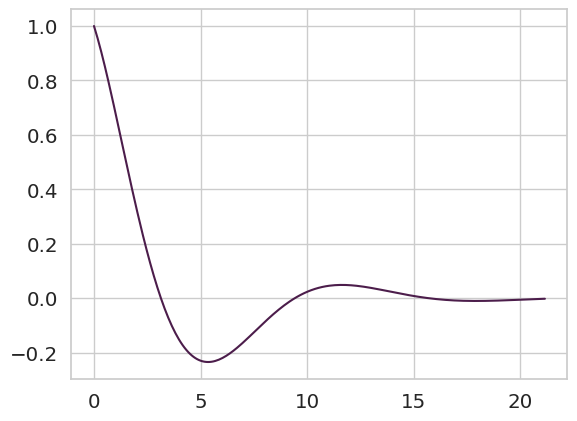

y norm
1.2427869


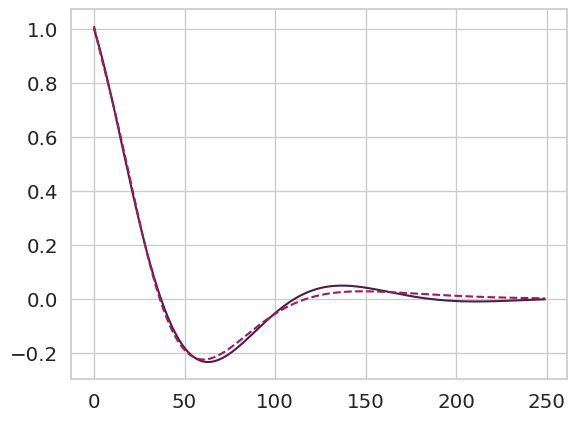

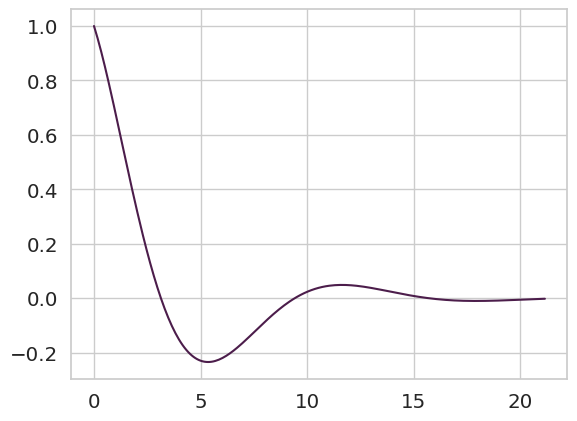

y norm
1.2427869


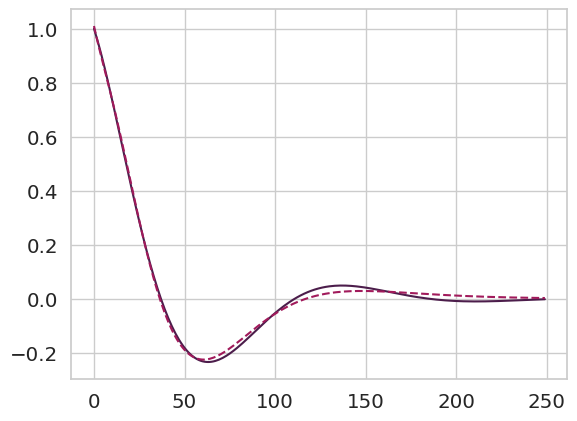

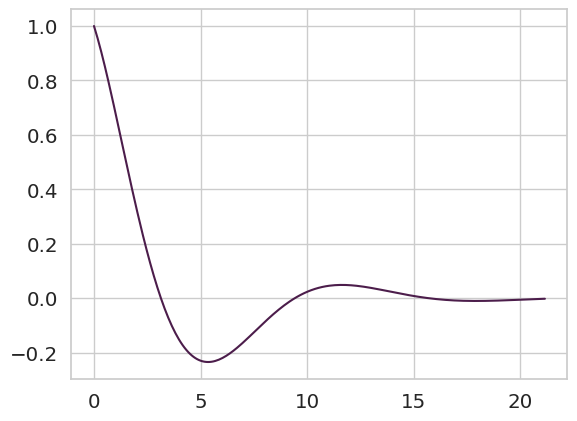

y norm
1.2427869


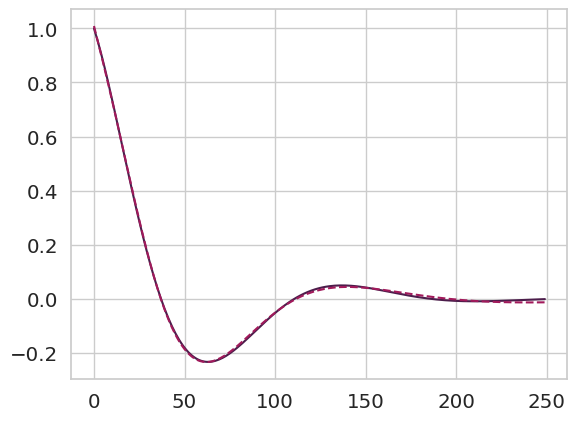

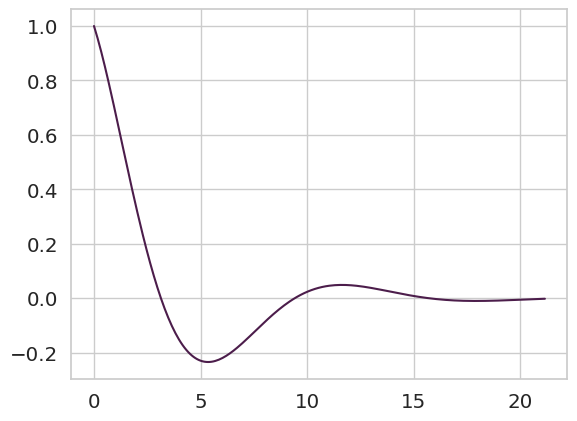

y norm
1.2427869


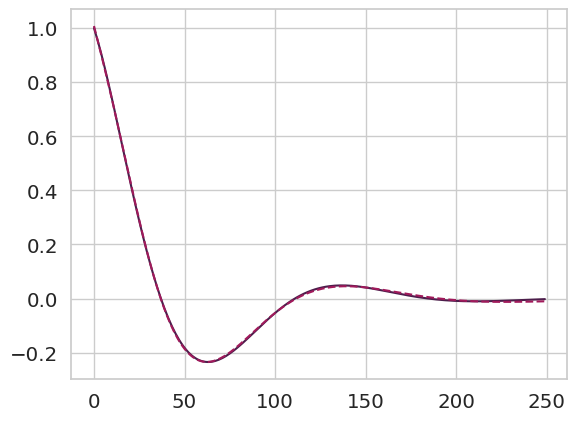

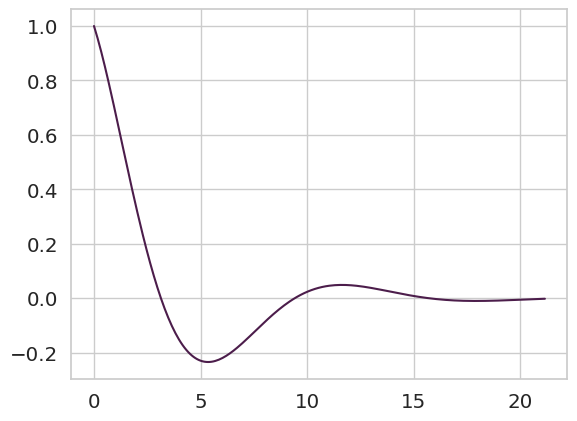

y norm
1.2427869


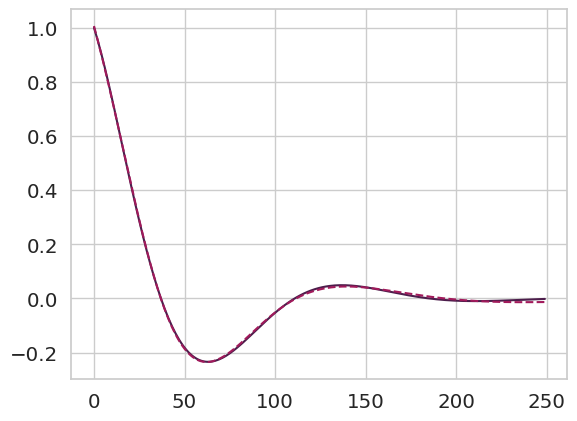

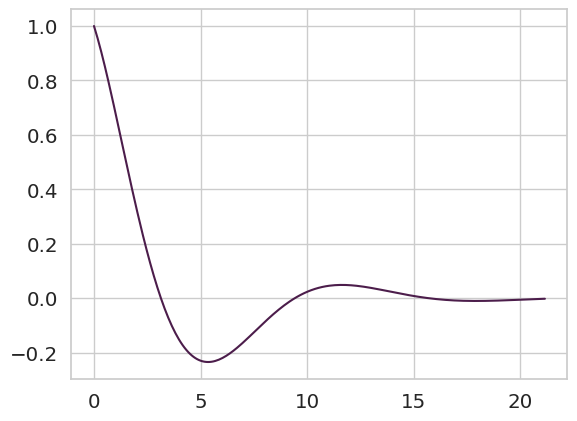

y norm
1.2427869


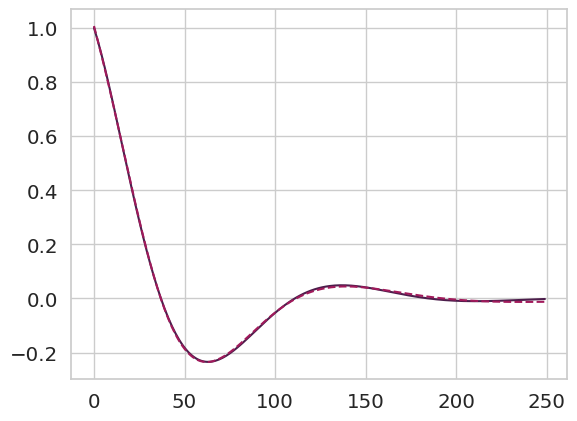

In [ ]:
sigmas = [0.6, 0.7, 0.8, 0.9]

# complex target
c_star = 0.25
omega_star = 0.5
target_exp = c_star + 1j * omega_star


lr = 0.5
N = 4000

all_all_loss = []
for i, sigma in enumerate(sigmas):
  all_loss = []
  for k in range(4):
    losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs, all_zu, all_u_top = train_RF_complex_target_warmstart(target_exp, N, train_step, lamb_init, time_window,sigma=sigma, lr = lr, dt=dt, tied = False, gamma=gamma, seed = k)
    all_loss += [losses]
  all_all_loss += [all_loss]

In [ ]:
all_loss_th = []
for i, sigma in enumerate(sigmas):

  tvals = jnp.linspace(0, time_window-1, time_window) * dt
  C = sigma**2 * jnp.exp(- tvals[:,jnp.newaxis] - tvals[jnp.newaxis,:] ) * jax.scipy.special.i0(2 * sigma * jnp.sqrt(jnp.outer(tvals,tvals)))
  y = jnp.exp( - target_exp * tvals  ).real

  K = C
  Delta = 1.0 * y
  loss_i0 = []
  for t in range(train_step):
    loss_i0 += [ jnp.sum(Delta**2) * dt]
    Delta -= 2 * lr * K @ Delta  * dt

  all_loss_th += [loss_i0]

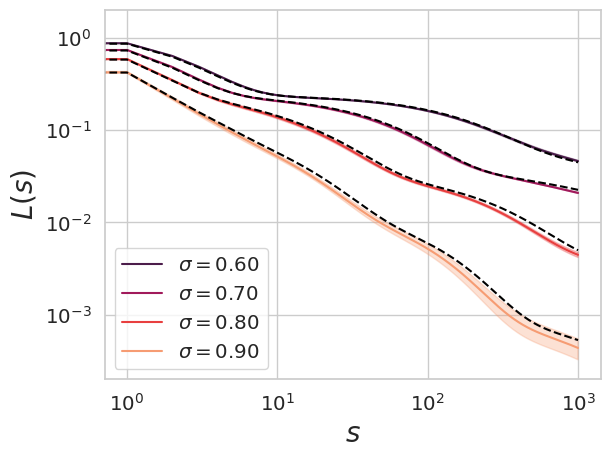

In [ ]:
sns.set_palette("rocket", n_colors=len(sigmas))

for i, sigma in enumerate(sigmas):
  loss_mean = jnp.array(all_all_loss[i]).mean(axis=0)
  loss_std = jnp.array(all_all_loss[i]).std(axis=0)
  plt.loglog( loss_mean , color = f'C{i}', label = r'$\sigma = %0.2f$' % sigma)
  plt.fill_between(jnp.arange(len(loss_mean)), loss_mean - loss_std, loss_mean + loss_std , alpha = 0.3 , color = f'C{i}')
  plt.loglog(all_loss_th[i], '--', color = 'black')
plt.legend()
plt.xlabel(r'$s$',fontsize = 20)
plt.ylabel(r'$L(s)$',fontsize = 20)
plt.ylim([2e-4,2.0])
plt.savefig(f'lazy_learning_complex_loss_vs_sigma_new_N_{N}.pdf',bbox_inches = 'tight')
#plt.savefig(f'lazy_learning_loss_vs_sigma_new_N_{N}.svg',bbox_inches = 'tight')
plt.show()

In [ ]:
def compute_kernel(target_exp, N, train_step, lamb_init, time_window, dt = 0.025, sigma = 0.1, lr = 0.01, tied = True, leak = 1.0, gamma = 1.0, num_iter = 10):

  u_dir = random.normal(random.PRNGKey(0), (N,))
  u_dir = u_dir / jnp.sqrt( jnp.mean(u_dir**2) )
  u = sigma*u_dir
  if tied:
    v = u
  else:
    v = sigma*random.normal(random.PRNGKey(1), (N,))

  perp_u = random.normal( random.PRNGKey(3), (N,)  )
  perp_u = perp_u - jnp.dot(perp_u, u)/jnp.sum(u**2) * u
  perp_u = perp_u / jnp.sqrt( jnp.sum(perp_u**2) ) * jnp.sqrt( jnp.sum(u**2) )
  print(jnp.sum(perp_u**2) / N)
  print(jnp.sum(u**2) / N )


  u_normed = u / jnp.sqrt(jnp.sum(u**2) )
  perp_u_normed = perp_u / jnp.sqrt(jnp.sum(perp_u**2) )
  z = u_normed + 1j * perp_u_normed
  #lamb_init = 1.5*sigma + 1j * 1.5*sigma
  #print(lamb_init)
  outlier_component = lamb_init * jnp.outer( z, jnp.conjugate(z) ) + jnp.conjugate(lamb_init) * jnp.outer( jnp.conjugate(z), z )

  outlier_component = outlier_component.real
  print(outlier_component.shape)
  #  s * u



  all_C = []
  for k in range(num_iter):
    W = sigma*random.normal(random.PRNGKey(2 + k), (N,N))


    def update_fn(carry, x):
      h = carry
      dh = dt * ( - leak * h + 1/jnp.sqrt(N) * W @ h  ) # run forward dynamics starting from u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v ) / gamma
      return h_new, h

    _, hs =  lax.scan(update_fn, init = u, xs= None, length = time_window)

    C = hs @ hs.T / N
    all_C += [C]

  return all_C

0.855625
0.855625
(3000, 3000)
200
(200, 200)


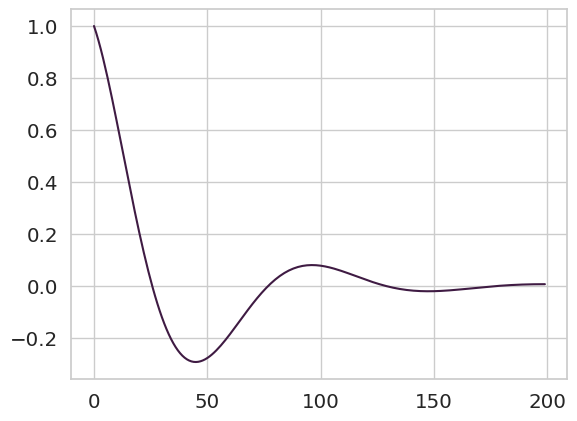

0.99942607


KeyboardInterrupt: 

In [ ]:
sigma = 0.925
N = 3000
C_expt = compute_kernel(target_exp, N, train_step, lamb_init, time_window, dt = dt, sigma = sigma, lr = lr, tied = False, leak = 1.0, gamma = 1.0)
C, loss = compute_lazy_limit(target_exp, train_step, lamb_init, time_window, dt= dt, sigma = sigma)


In [ ]:
print(sigma)
C_mean = jnp.array(C_expt).mean(axis=0)
C_std = jnp.array(C_expt).std(axis=0)

0.925


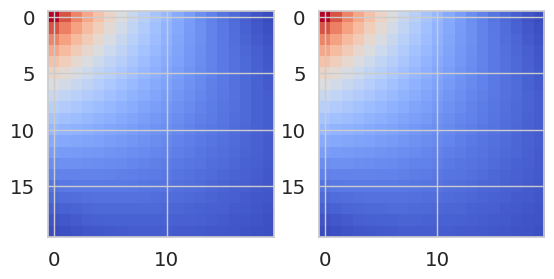

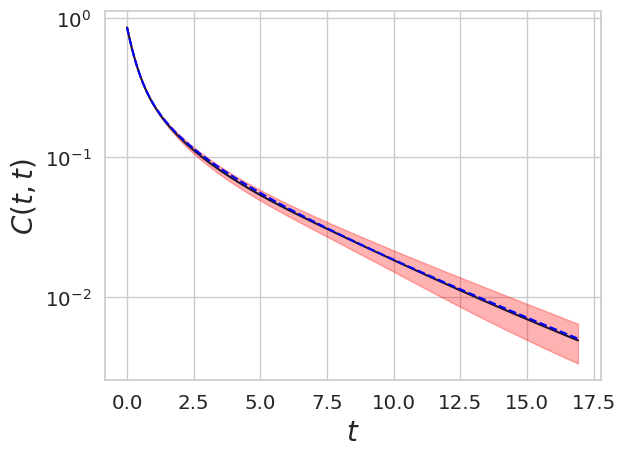

In [ ]:
plt.subplot(1,2,1)
plt.imshow(C_mean[0:20,0:20], cmap = 'coolwarm')
plt.subplot(1,2,2)
plt.imshow(C[0:20,0:20], cmap = 'coolwarm')
plt.show()

plt.semilogy(dt * jnp.arange(C.shape[0]), jnp.diag(C_mean))
plt.semilogy(dt * jnp.arange(C.shape[0]), jnp.diag(C), '--', color = 'blue')
plt.fill_between( dt * jnp.arange(C.shape[0]) ,  jnp.diag(C_mean) - jnp.diag(C_std) , jnp.diag(C_mean) + jnp.diag(C_std) , alpha = 0.3, color = 'red')
plt.xlabel(r'$t$',fontsize = 20)
plt.ylabel(r'$C(t,t)$',fontsize =20)
plt.show()

In [ ]:
sigmas = [0.75, 0.85, 0.9, 0.95, 0.99]

all_C_mean = []
all_C_std = []
all_C_th = []

for i, sigma in enumerate(sigmas):
  C_expt = compute_kernel(target_exp, N, train_step, lamb_init, time_window, dt = dt, sigma = sigma, lr = lr, tied = False, leak = 1.0, gamma = 1.0)
  C, loss = compute_lazy_limit(target_exp, train_step, lamb_init, time_window, dt= dt, sigma = sigma)

  all_C_mean += [jnp.array(C_expt).mean(axis=0)]
  all_C_std += [jnp.array(C_expt).std(axis=0) ]
  all_C_th += [  C ]


NameError: name 'target_exp' is not defined

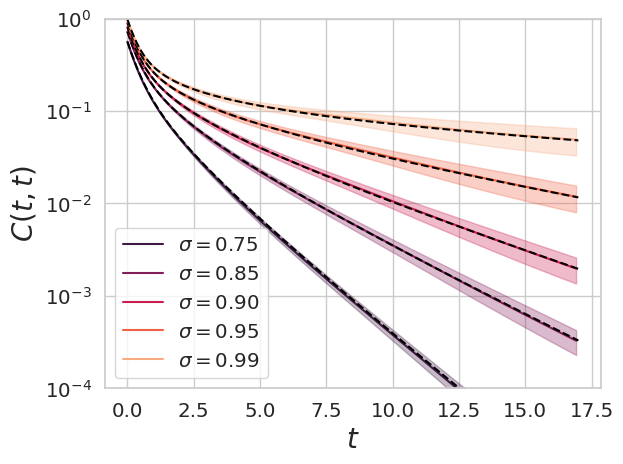

"\nfor i, sigma in enumerate(sigmas):\n  tvals = jnp.linspace(0, dt*C.shape[0], 200)\n  c_i = sigma**2 * jnp.exp(- 2*tvals ) * jax.scipy.special.i0(2 * sigma * tvals)\n  plt.semilogy(tvals, c_i)\nplt.xlabel(r'$t$',fontsize = 20)\nplt.ylabel(r'$C(t,t)$',fontsize =20)\nplt.ylim([1e-4,1.0])\nplt.legend()\nplt.show()\n"

In [ ]:
sns.set_palette("rocket", n_colors=len(sigmas))
for i, sigma in enumerate(sigmas):
  plt.semilogy(dt * jnp.arange(C.shape[0]), jnp.diag(all_C_mean[i]), color= f'C{i}',label = r'$\sigma = %0.2f$' % sigma)
  #plt.semilogy(dt * jnp.arange(C.shape[0]), jnp.diag(all_C_th[i]), '--',  color= f'black')
  tvals = jnp.linspace(0, dt*C.shape[0], 200)
  c_i = sigma**2 * jnp.exp(- 2*tvals ) * jax.scipy.special.i0(2 * sigma * tvals)
  plt.semilogy(tvals, c_i , '--', color = 'black')
  plt.fill_between( dt * jnp.arange(C.shape[0]) ,  jnp.diag(all_C_mean[i]) - jnp.diag(all_C_std[i]) , jnp.diag(all_C_mean[i]) + jnp.diag(all_C_std[i])  , alpha = 0.3, color = f'C{i}')
plt.xlabel(r'$t$',fontsize = 20)
plt.ylabel(r'$C(t,t)$',fontsize =20)
plt.ylim([1e-4,1.0])
plt.legend()
plt.savefig('auto_correlation_vs_sigma_lazy.pdf',bbox_inches = 'tight')
plt.show()


for i, sigma in enumerate(sigmas):
  tvals = jnp.linspace(0, dt*C.shape[0], 200)
  c_i = sigma**2 * jnp.exp(- 2*tvals ) * jax.scipy.special.i0(2 * sigma * tvals)
  plt.semilogy(tvals, c_i)
  plt.semilogy(dt * jnp.arange(C.shape[0]), jnp.diag(all_C_th[i]), '--',  color= f'black')

plt.xlabel(r'$t$',fontsize = 20)
plt.ylabel(r'$C(t,t)$',fontsize =20)
plt.ylim([1e-4,1.0])
plt.legend()
plt.show()


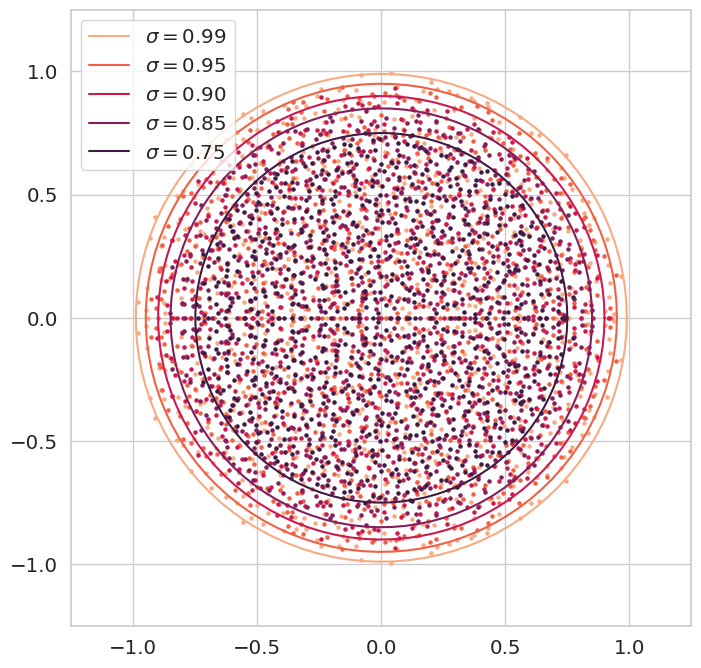

In [ ]:
N = 800

plt.figure(figsize = (8,8))
sns.set_palette("rocket_r", n_colors=len(sigmas))


thetas =jnp.linspace(0,2*jnp.pi, 100)
for i, sigma in enumerate(sigmas[::-1]):
  W = sigma * random.normal(random.PRNGKey(i), (N,N)) / jnp.sqrt(N)
  eigs = np.linalg.eigvals(W)
  plt.scatter(eigs.real, eigs.imag,  s = 5.0)
  plt.plot( sigma * jnp.cos(thetas), sigma*jnp.sin(thetas), color = f'C{i}',label = r'$\sigma = %0.2f$' % sigma )
box_size = 1.25


#plt.plot(  1.0-jnp.array(c_omega).real, jnp.array(c_omega).imag , '--', color = 'black' )
#plt.plot(  1.0-jnp.array(c_omega).real, -jnp.array(c_omega).imag , '--', color = 'black')

plt.xlim([-box_size, box_size])
plt.ylim([-box_size, box_size])
plt.legend()
plt.savefig('complex_plane_eig_vs_sigma.pdf',bbox_inches = 'tight')
plt.show()

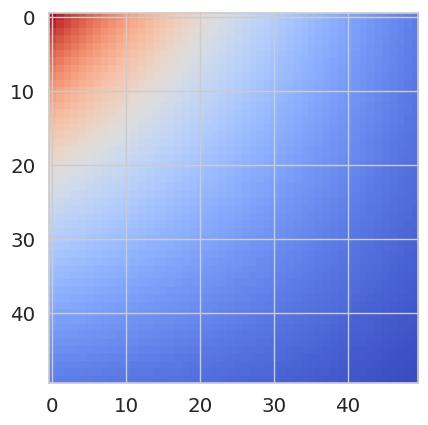

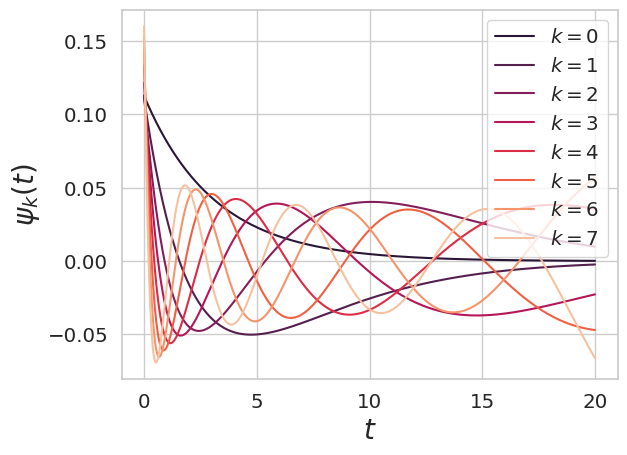

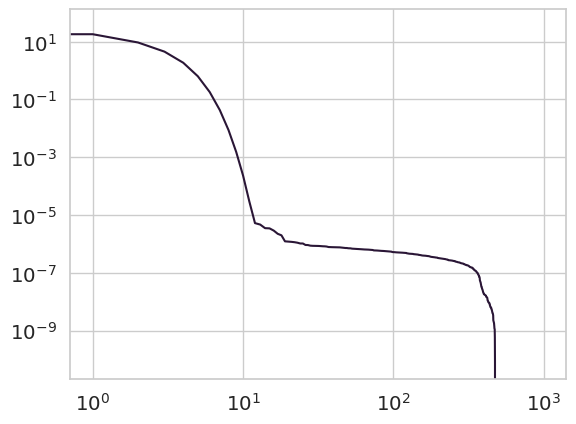

In [ ]:
sigma = 0.95

tgrid = jnp.linspace(0, 20, 1000)

C_grid = sigma**2 * jnp.exp( - tgrid[:,jnp.newaxis] - tgrid[jnp.newaxis,:] ) * jax.scipy.special.i0(2*sigma * jnp.sqrt( jnp.outer(tgrid,tgrid) ))
plt.imshow(C_grid[0:50,0:50], cmap = 'coolwarm')
plt.show()

s, v = jnp.linalg.eigh(C_grid)
indsort = jnp.argsort(s)[::-1]
v = v[:,indsort]
s = s[indsort]


num_k = 8
sns.set_palette("rocket", n_colors= num_k)

for k in range(num_k):
  plt.plot(tgrid, v[:,k] * jnp.sign(v[0,k]), label = r'$k = %d$' % k)
plt.xlabel(r'$t$',fontsize = 20)
plt.ylabel(r'$\psi_k(t)$',fontsize =20)
plt.legend()
plt.show()

plt.loglog(s)
plt.show()

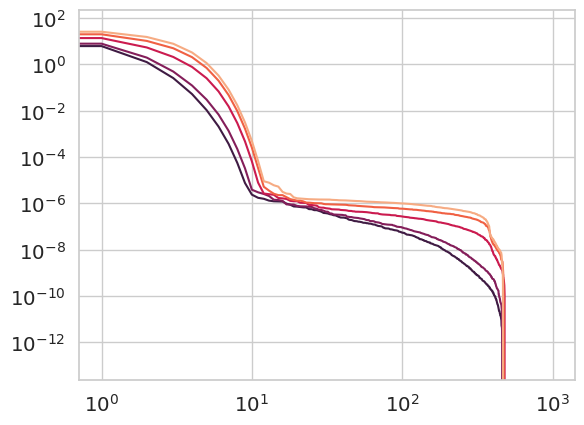

In [ ]:
sigmas = [0.75, 0.8, 0.9, 0.95, 0.975]

sns.set_palette("rocket", n_colors= len(sigmas))
for i, sigma in enumerate(sigmas):

  tgrid = jnp.linspace(0, 20, 1000)

  C_grid = jnp.exp( - tgrid[:,jnp.newaxis] - tgrid[jnp.newaxis,:] ) * jax.scipy.special.i0(2*sigma * jnp.sqrt( jnp.outer(tgrid,tgrid) ))
  #plt.imshow(C_grid[0:50,0:50], cmap = 'coolwarm')
  #plt.show()

  s, v = jnp.linalg.eigh(C_grid)
  indsort = jnp.argsort(s)[::-1]
  v = v[:,indsort]
  s = s[indsort]

  plt.loglog(s)
plt.show()


## Diagonal Parameterizaqtion

In [ ]:
def train_diag_model_complex_target_warmstart(target_exp, N, train_step, lamb_init, time_window, dt = 0.025, sigma = 0.1, lr = 0.01, tied = True, leak = 1.0, gamma = 1.0):

  u_dir = random.normal(random.PRNGKey(0), (N,))
  u_dir = u_dir / jnp.sqrt( jnp.mean(u_dir**2) )
  u = sigma*u_dir
  if tied:
    v = u
  else:
    v = sigma*random.normal(random.PRNGKey(1), (N,))

  perp_u = random.normal( random.PRNGKey(3), (N,)  )
  perp_u = perp_u - jnp.dot(perp_u, u)/jnp.sum(u**2) * u
  perp_u = perp_u / jnp.sqrt( jnp.sum(perp_u**2) ) * jnp.sqrt( jnp.sum(u**2) )
  print(jnp.sum(perp_u**2) / N)
  print(jnp.sum(u**2) / N )


  u_normed = u / jnp.sqrt(jnp.sum(u**2) )
  perp_u_normed = perp_u / jnp.sqrt(jnp.sum(perp_u**2) )
  z = u_normed + 1j * perp_u_normed
  #lamb_init = 1.5*sigma + 1j * 1.5*sigma
  #print(lamb_init)
  outlier_component = lamb_init * jnp.outer( z, jnp.conjugate(z) ) + jnp.conjugate(lamb_init) * jnp.outer( jnp.conjugate(z), z )

  outlier_component = outlier_component.real
  print(outlier_component.shape)
  #  s * u
  W = sigma*random.normal(random.PRNGKey(2), (N,N))  + jnp.sqrt(N) * outlier_component

  # u = 1/2 * z + 1/2 * z'

  u = np.zeros( N )
  u[0] = sigma  * jnp.sqrt(N / 2)
  u[1] = sigma * jnp.sqrt(N / 2)
  u = jnp.array(u)
  v = 1.0 * u

  eigs = np.linalg.eigvals(W / jnp.sqrt(N))

  eig_r = eigs.real
  eig_r[0] = 2*sigma
  eig_r[1] = 2*sigma
  eig_i = eigs.imag
  eig_i[0] = 2*sigma
  eig_i[1] = - 2*sigma


  def loss_fn(params):
    u, v, eig_r, eig_i = params

    def update_fn(carry, x):
      h = carry
      dh = dt * ( - leak * h + (eig_r + 1j*eig_i) / jnp.sqrt(N) * h  ) # run forward dynamics starting from u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v ) / gamma
      return h_new, window

    _, f = lax.scan(update_fn, init = u.astype(jnp.complex64), xs= None, length = time_window)
    y = jnp.exp( - target_exp * jnp.linspace(0, time_window-1, time_window) * dt  ).real

    return jnp.sum( jnp.abs( f - y )**2 ) * dt

  y = jnp.exp( - target_exp * jnp.linspace(0, time_window-1, time_window) * dt  ).real

  plt.plot(jnp.linspace(0, time_window-1, time_window) * dt, y)
  plt.show()

  params = [u, v, eig_r * jnp.sqrt(N), eig_i  * jnp.sqrt(N) ]

  val_grad_fn = jit( value_and_grad(loss_fn) )
  opt_init, opt_update, get_params = optimizers.sgd( lr * N * gamma**2 )

  opt_state = opt_init(params)

  losses = []
  aligns = []
  W_aligns = []
  u_norm = []
  c_scale = []

  all_eigs = []
  all_zu = []
  all_u_top_eig = []

  for t in range(train_step):

    u, v, eig_r, eig_i = get_params(opt_state)

    if t % 10 == 0:
      #eig = np.linalg.eigvals( W / jnp.sqrt(N) )

      #eig, vecs = np.linalg.eig( W / jnp.sqrt(N) )
      all_eigs += [ (eig_r + 1j* eig_i) / jnp.sqrt(N) ]
      ind_max = jnp.argsort( eigs.imag )[::-1][0]
      #all_u_top_eig += [jnp.mean( vecs[:,ind_max] * u )]


    loss, grads = val_grad_fn(get_params(opt_state))

    opt_state = opt_update(t, grads , opt_state)

    losses.append(loss)


    aligns += [ jnp.sum( u * v ) / jnp.sqrt( jnp.sum(u**2) * jnp.sum(v**2) ) ]
    W_aligns += [  jnp.sum( v * ( W @ u )) / jnp.sqrt( jnp.sum((W @ u)**2) * jnp.sum(v**2) )   ]

    u_norm += [ jnp.mean(u**2) ]
    c_scale += [ jnp.mean(  v *  (W @ u / jnp.sqrt(N) )) ]

    all_zu += [ jnp.mean( u * z ) ]



  # check final windowing fn
  def update_fn(carry, x):
      h = carry
      dh = dt * ( -leak*h + (eig_r + 1j*eig_i)/jnp.sqrt(N) * h  ) # run forward dynamics starting rom u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v ) / gamma
      return h_new, window

  _, f = lax.scan(update_fn, init = u.astype(jnp.complex64), xs= None, length = time_window)

  plt.plot(y.real)
  plt.plot(f.real, '--')
  plt.plot( jnp.exp( - dt * leak * jnp.arange(time_window) ) )
  plt.show()

  return losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs, all_zu, all_u_top_eig


def train_diag_exp_model_complex_target_warmstart(target_exp, N, train_step, lamb_init, time_window, dt = 0.025, sigma = 0.1, lr = 0.01, tied = True, leak = 1.0, gamma = 1.0):

  u_dir = random.normal(random.PRNGKey(0), (N,))
  u_dir = u_dir / jnp.sqrt( jnp.mean(u_dir**2) )
  u = sigma*u_dir
  if tied:
    v = u
  else:
    v = sigma*random.normal(random.PRNGKey(1), (N,))

  perp_u = random.normal( random.PRNGKey(3), (N,)  )
  perp_u = perp_u - jnp.dot(perp_u, u)/jnp.sum(u**2) * u
  perp_u = perp_u / jnp.sqrt( jnp.sum(perp_u**2) ) * jnp.sqrt( jnp.sum(u**2) )
  print(jnp.sum(perp_u**2) / N)
  print(jnp.sum(u**2) / N )


  u_normed = u / jnp.sqrt(jnp.sum(u**2) )
  perp_u_normed = perp_u / jnp.sqrt(jnp.sum(perp_u**2) )
  z = u_normed + 1j * perp_u_normed
  #lamb_init = 1.5*sigma + 1j * 1.5*sigma
  #print(lamb_init)
  outlier_component = lamb_init * jnp.outer( z, jnp.conjugate(z) ) + jnp.conjugate(lamb_init) * jnp.outer( jnp.conjugate(z), z )

  outlier_component = outlier_component.real
  print(outlier_component.shape)
  #  s * u
  W = sigma*random.normal(random.PRNGKey(2), (N,N))  + jnp.sqrt(N) * outlier_component

  # u = 1/2 * z + 1/2 * z'

  u = np.zeros( N )
  u[0] = sigma  * jnp.sqrt(N / 2)
  u[1] = sigma * jnp.sqrt(N / 2)
  u = jnp.array(u)
  v = 1.0 * u



  eigs = np.linalg.eigvals(W / jnp.sqrt(N))

  eig_r = eigs.real
  eig_r[0] = 2*sigma
  eig_r[1] = 2*sigma
  eig_i = eigs.imag
  eig_i[0] = 2*sigma
  eig_i[1] = - 2*sigma

  eig_mod = jnp.sqrt( eig_r**2 + eig_i**2 )
  eig_angle = jnp.angle(  eig_r+ 1j*eig_i )

  eig_scale = - jnp.log(eig_mod)



  def loss_fn(params):
    u, v, eig_scale, eig_angle = params

    def update_fn(carry, x):
      h = carry
      dh = dt * ( - leak * h + jnp.exp( (-eig_scale + 1j*eig_angle) / jnp.sqrt(N) ) * h  ) # run forward dynamics starting from u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v ) / gamma
      return h_new, window

    _, f = lax.scan(update_fn, init = u.astype(jnp.complex64), xs= None, length = time_window)
    y = jnp.exp( - target_exp * jnp.linspace(0, time_window-1, time_window) * dt  ).real

    return jnp.sum( jnp.abs( f - y )**2 ) * dt

  y = jnp.exp( - target_exp * jnp.linspace(0, time_window-1, time_window) * dt  ).real

  plt.plot(jnp.linspace(0, time_window-1, time_window) * dt, y)
  plt.show()

  params = [u, v, eig_scale * jnp.sqrt(N), eig_angle  * jnp.sqrt(N) ]

  val_grad_fn = jit( value_and_grad(loss_fn) )
  opt_init, opt_update, get_params = optimizers.sgd( lr * N * gamma**2 )

  opt_state = opt_init(params)

  losses = []
  aligns = []
  W_aligns = []
  u_norm = []
  c_scale = []

  all_eigs = []
  all_zu = []
  all_u_top_eig = []

  for t in range(train_step):

    u, v, eig_scale, eig_angle = get_params(opt_state)

    if t % 10 == 0:
      #eig = np.linalg.eigvals( W / jnp.sqrt(N) )

      #eig, vecs = np.linalg.eig( W / jnp.sqrt(N) )
      all_eigs += [ jnp.exp( (- eig_scale + 1j*eig_angle ) / jnp.sqrt(N) ) ]
      ind_max = jnp.argsort( eigs.imag )[::-1][0]
      #all_u_top_eig += [jnp.mean( vecs[:,ind_max] * u )]


    loss, grads = val_grad_fn(get_params(opt_state))

    opt_state = opt_update(t, grads , opt_state)

    losses.append(loss)


    aligns += [ jnp.sum( u * v ) / jnp.sqrt( jnp.sum(u**2) * jnp.sum(v**2) ) ]
    W_aligns += [  jnp.sum( v * ( W @ u )) / jnp.sqrt( jnp.sum((W @ u)**2) * jnp.sum(v**2) )   ]

    u_norm += [ jnp.mean(u**2) ]
    c_scale += [ jnp.mean(  v *  (W @ u / jnp.sqrt(N) )) ]

    all_zu += [ jnp.mean( u * z ) ]



  # check final windowing fn
  def update_fn(carry, x):
      h = carry
      dh = dt * ( -leak*h + jnp.exp( (- eig_scale + 1j*eig_angle)/jnp.sqrt(N) ) * h  ) # run forward dynamics starting rom u
      h_new = h + dh
      window = 1/N * jnp.sum( h * v ) / gamma
      return h_new, window

  _, f = lax.scan(update_fn, init = u.astype(jnp.complex64), xs= None, length = time_window)

  plt.plot(y.real)
  plt.plot(f.real, '--')
  plt.plot( jnp.exp( - dt * leak * jnp.arange(time_window) ) )
  plt.show()

  return losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs, all_zu, all_u_top_eig



0.010000001
0.010000001
(250, 250)


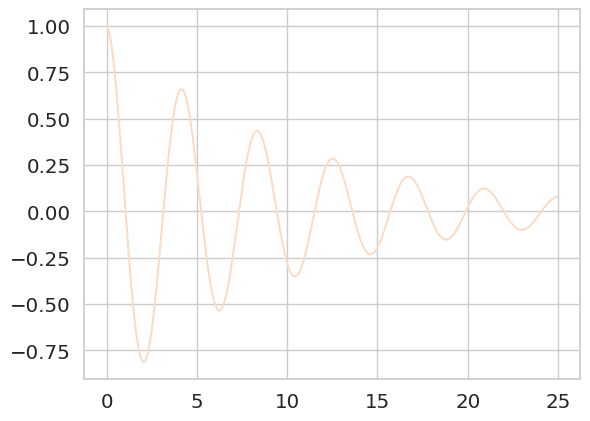

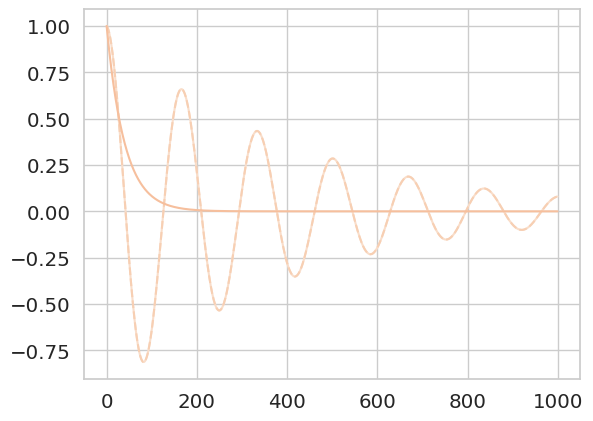

In [ ]:
N = 250

# define target function
c_star = 0.1
omega_star = 1.5
target_exp = c_star + 1j * omega_star

#sigma = 0.15
sigma = 0.1
lr = 0.05

time_window = 1000
train_step = 5000

c0 = 1.0
omega0 = 0.4


#lamb_init = (1.0-c0)/2.0 + 1j * omega0 /2.0
lamb_init = 0.0 + 0.0*1j

losses, aligns, W_aligns, W, u, v, u_norm, c_scale, all_eigs, all_zu, all_u_top_eig =  train_diag_model_complex_target_warmstart(target_exp, N, train_step, lamb_init, time_window, tied = True)




0.010000001
0.010000001
(250, 250)


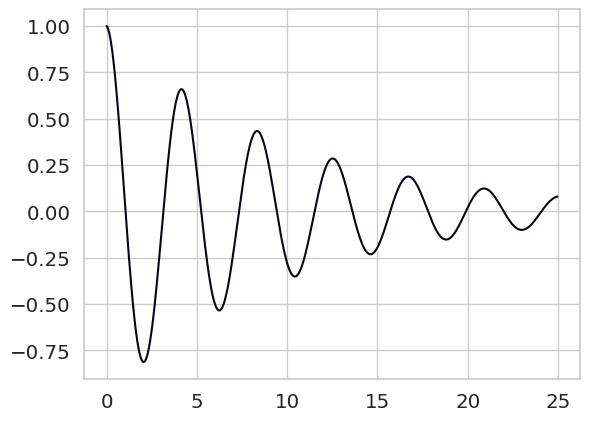

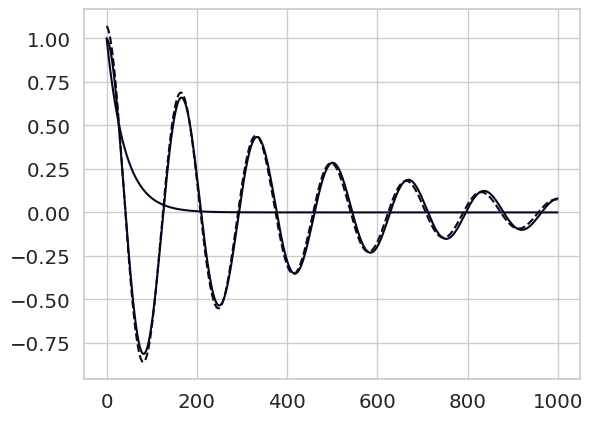

In [ ]:
losses_exp, _, _, _, _, _, _, _, all_eigs_exp, _, _ =  train_diag_exp_model_complex_target_warmstart(target_exp, N, train_step, lamb_init, time_window, tied = True)


(0.0021925073-0.0003800124j)
(0.0021633666-0.0003800124j)
(0.0021094992-0.0003800124j)
(0.0020129525-0.0003800124j)
(0.0018506694-0.0003800124j)
(0.0016042799-0.0003800124j)
(0.0012735294-0.0003800124j)
(0.0008787046-0.0003800124j)
(0.00044964696-0.0003800124j)
(1.4501095e-05-0.0003800124j)
(-0.00040449717-0.0003800124j)
(-0.0007904828-0.0003800124j)
(-0.0011301506-0.0003800124j)
(-0.001412115-0.0003800124j)
(-0.0016256659-0.0003800124j)
(-0.0017597447-0.0003800124j)
(-0.0018019277-0.0003800124j)
(-0.0017371627-0.0003800124j)
(-0.0015459231-0.0003800124j)
(-0.0012010129-0.0003800124j)
(-0.0006612838-0.0003800124j)
(0.00014300848-0.0003800124j)
(0.0013533959-0.0003800124j)
(0.003378301-0.0003800124j)
(0.0073079704-0.0003800124j)
(0.007568928-0.0003800124j)
(0.0075907065-0.0003800124j)
(0.007592768-0.0003800124j)
(0.0075929654-0.0003800124j)
(0.0075929854-0.0003800124j)
(0.0075929863-0.0003800124j)
(0.0075929863-0.0003800124j)
(0.0075929863-0.0003800124j)
(0.0075929863-0.0003800124j)
(0.

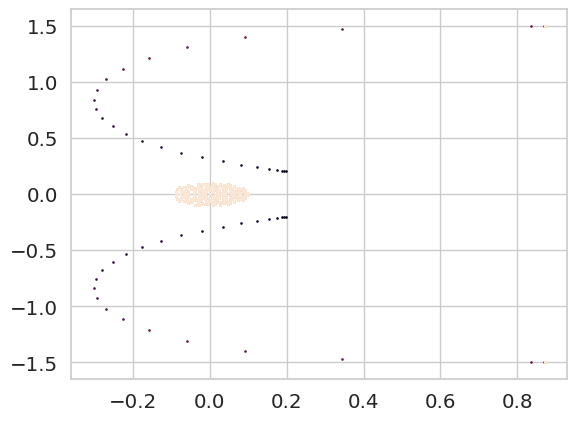

In [ ]:
times = jnp.arange(10, 500, 5)
sns.set_palette("rocket", n_colors=len(times))
plt.figure()
for t in times:
    plt.scatter(all_eigs[t].real, all_eigs[t].imag, s = 0.8)
    #plt.scatter( all_eigs2d[t].real, all_eigs2d[t].imag , color = 'black', s = 0.25)
    print(all_eigs[t].mean())
plt.show()


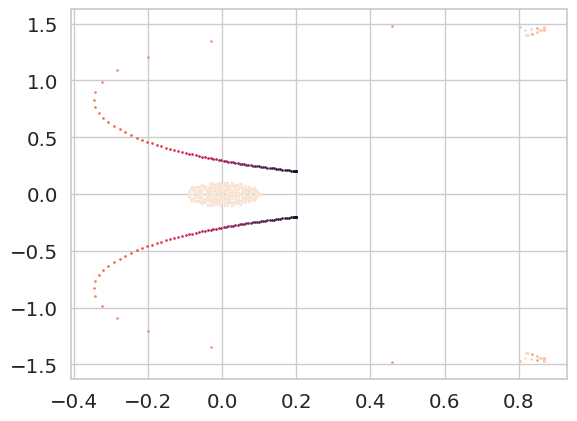

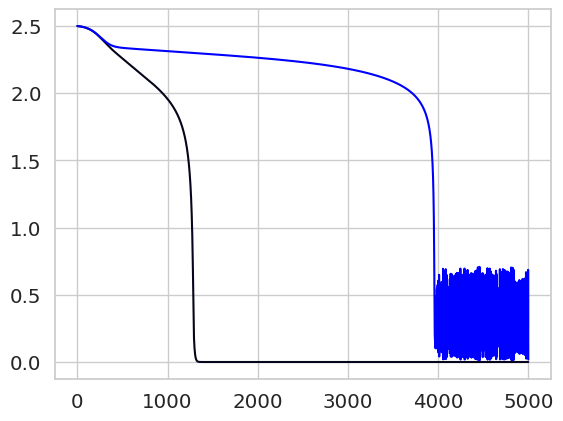

In [ ]:

times = jnp.arange(10, 500, 5)
sns.set_palette("rocket", n_colors=len(times))
plt.figure()
for t in times:
    plt.scatter(all_eigs_exp[t].real, all_eigs_exp[t].imag, s = 0.8)
    #plt.scatter( all_eigs2d[t].real, all_eigs2d[t].imag , color = 'black', s = 0.25)
plt.show()

plt.plot(losses)
plt.plot(losses_exp, color = 'blue')
plt.show()


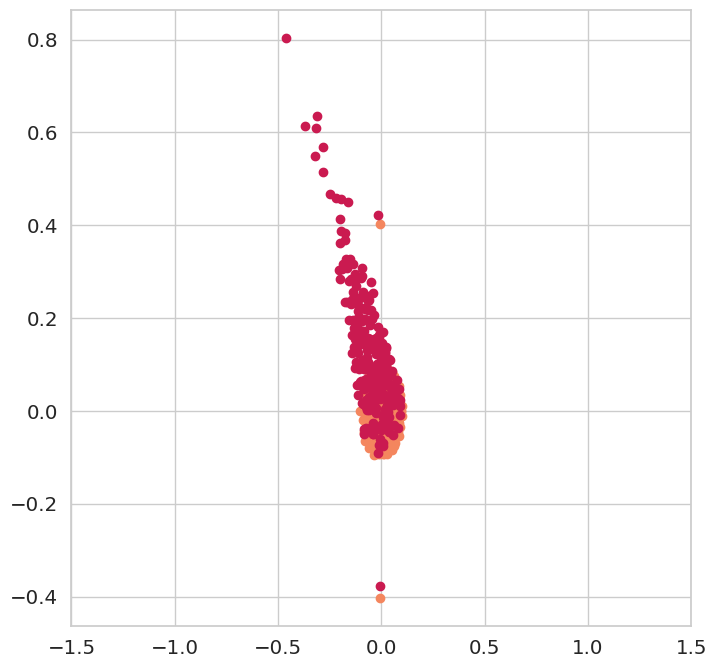

In [ ]:
sns.set_palette("rocket_r", n_colors=3)

plt.figure(figsize =(8,8))
plt.scatter(all_eigs[0].real, all_eigs[0].imag )

plt.scatter(all_eigs[30].real, all_eigs[30].imag )

plt.xlim([-1.5,1.5])
plt.xlim([-1.5,1.5])
plt.show()

# Empirical NTK Eigenfunctions

In [ ]:
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from jax import value_and_grad, random, lax, jit
from jax.example_libraries import optimizers
import jax
import seaborn as sns
import sys

sns.set(font_scale=1.3)
sns.set_style("whitegrid")
sns.set_palette("rocket", n_colors=10)

In [ ]:
T = 10
time_window = 60

dt = T / time_window

sigma = 0.8

tvals = jnp.linspace(0, time_window-1, time_window) * dt

C = sigma**2 * jnp.exp(- tvals[:,jnp.newaxis] - tvals[jnp.newaxis,:] ) * jax.scipy.special.i0(2 * sigma * jnp.sqrt(jnp.outer(tvals,tvals)))


In [ ]:
T = len(tvals)
K = np.zeros((T,T))

for t in range(T):
  sys.stdout.write(f"\r {(t+1)/T}")
  for s in range(T):
    C_sub = C[:t,:s]
    C_sub_rev = C_sub[::-1,:]
    C_sub_rev = C_sub_rev[:,::-1]
    K[t,s] += dt**2 * jnp.sum( C_sub * C_sub_rev )

K += 2 * C


 1.0

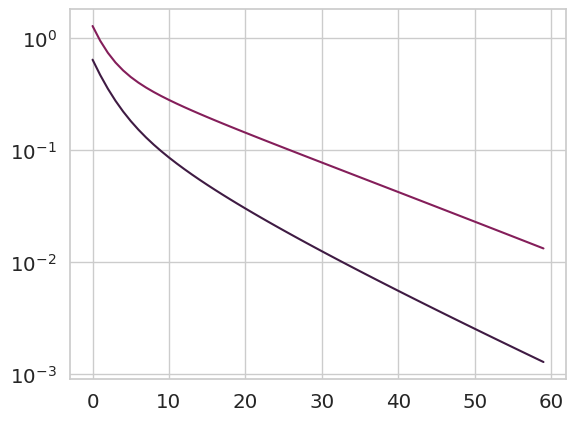

In [ ]:
plt.semilogy(jnp.diag(C))
plt.semilogy(jnp.diag(K))
plt.show()

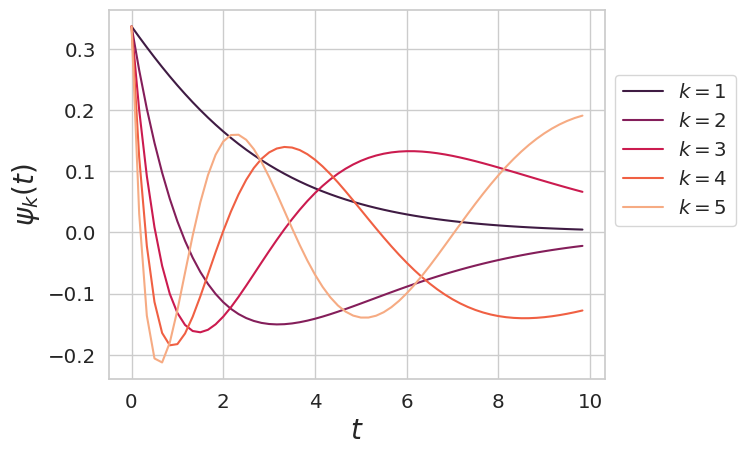

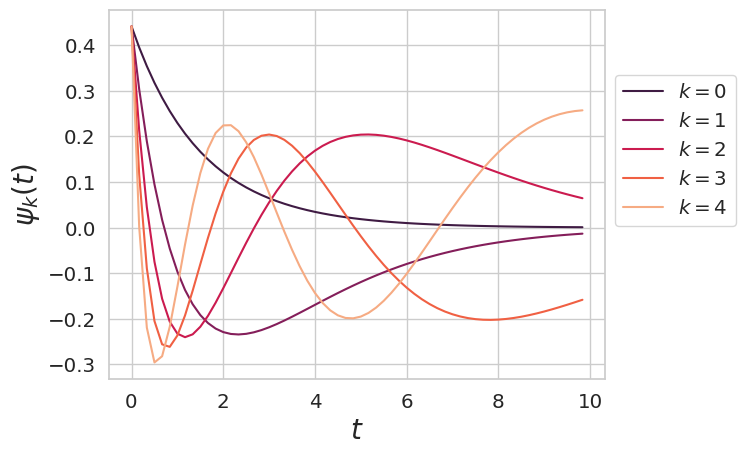

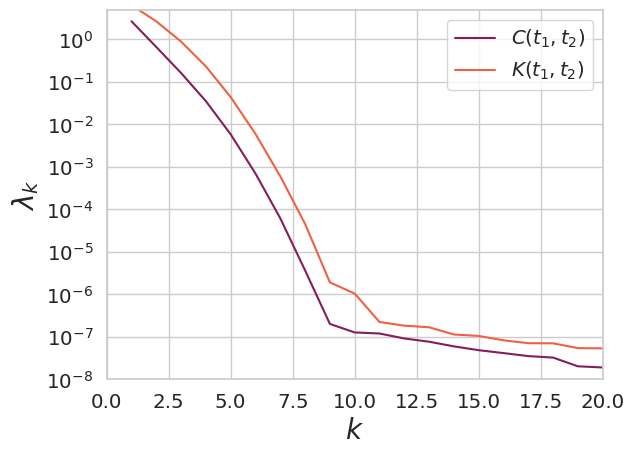

In [ ]:
s_ntk, v = jnp.linalg.eigh(K)


indsort = jnp.argsort(s)[::-1]
s_ntk = s_ntk[indsort]

v = v[:,indsort]

sns.set_palette("rocket", n_colors=5)

for i in range(5):
  plt.plot(tvals, v[:,i] * v[0,0] / v[0,i], label = f'$k={i+1}$')
plt.xlabel(r'$t$',fontsize = 20)
plt.ylabel(r'$\psi_k(t)$',fontsize = 20)
plt.legend(bbox_to_anchor=(1.0, 0.85), loc='upper left')
plt.savefig('ntk_spec.pdf',bbox_inches = 'tight')
plt.show()


s_nngp, v = jnp.linalg.eigh(C)

indsort = jnp.argsort(s)[::-1]
v = v[:,indsort]

s_nngp = s_nngp[indsort]


for i in range(5):
  plt.plot(tvals, v[:,i] * v[0,0] / v[0,i], label = f'$k={i}$')

plt.xlabel(r'$t$',fontsize = 20)
plt.ylabel(r'$\psi_k(t)$',fontsize = 20)
plt.legend(bbox_to_anchor=(1.0, 0.85), loc='upper left')
plt.savefig('nngp_spec.pdf',bbox_inches = 'tight')
plt.show()

sns.set_palette("rocket", n_colors=2)


plt.semilogy(jnp.linspace(1,len(s_nngp),len(s_nngp)), s_nngp,label = r'$C(t_1,t_2)$')
plt.semilogy(jnp.linspace(1,len(s_nngp),len(s_nngp)), s_ntk, label = r'$K(t_1,t_2)$')
plt.xlabel(r'$k$',fontsize = 20)
plt.ylabel(r'$\lambda_k$',fontsize = 20)
plt.xlim([0,20])
plt.ylim([1e-8,5.0])
plt.legend()
plt.savefig('eigenvalues_nngp_vs_ntk.pdf',bbox_inches = 'tight')
plt.show()